## 1 KROK TO WSTAWIENIE PRZYCIETYCH MASEK WIND SPEED I WIND DIRECTION DO KATALOGU

In [ ]:
!pip install rasterio
!pip install fiona

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 78.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 104.0 MB/s eta 0:00:00


## IMPORT BIBLIOTEK

In [ ]:
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import rasterio
from rasterio import features
import fiona
import networkx as nx
from math import atan2, degrees
from matplotlib.colors import ListedColormap, BoundaryNorm
from scipy import ndimage
from scipy.ndimage import distance_transform_edt

from skimage.morphology import (
    binary_opening, binary_closing, binary_erosion, binary_dilation,
    remove_small_objects, disk, skeletonize
)
from skimage.measure import label as sk_label
from skimage.graph import MCP, MCP_Geometric

from shapely.geometry import (
    LineString, MultiLineString, MultiPolygon, Polygon,
    mapping, shape
)
from shapely import ops
from rasterio.transform import Affine, array_bounds, xy
from IPython.display import clear_output
from rasterio.enums import Resampling
from rasterio.warp import calculate_default_transform, reproject
from rasterio.transform import Affine, array_bounds, xy
from IPython.display import clear_output
import cv2
import matplotlib.pyplot as plt
import matplotlib
from matplotlib import cm
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

# Konfiguracja stylu wykresów
warnings.filterwarnings('ignore')
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

## IMPORT FUNKCJI

In [ ]:
def write_raster(array, out_path, profile, dtype, nodata=None, show=False, title=None):
    """Write a raster to file and optionally display it."""
    prof = profile.copy()
    prof.update(dtype=dtype, count=1, nodata=nodata)
    os.makedirs(os.path.dirname(out_path), exist_ok=True)

    # Write array to disk
    with rasterio.open(out_path, 'w', **prof) as dst:
        dst.write(array.astype(dtype), 1)

    print(f"✓ Saved raster: {out_path}")

    if show:
        # Visualize the raster
        fig, ax = plt.subplots(figsize=(10, 8))
        disp = array.astype(float)

        # Mask nodata values for display
        if nodata is not None:
            disp = np.where(disp == nodata, np.nan, disp)

        # Choose colormap based on filename
        if 'mask' in out_path.lower() or 'skeleton' in out_path.lower():
            cmap = 'Blues'
        else:
            cmap = 'viridis'

        im = ax.imshow(disp, cmap=cmap, interpolation='nearest')
        ax.set_title(title or os.path.basename(out_path), fontsize=14, fontweight='bold')
        ax.axis('off')

        # Add colorbar if data are not purely binary
        vals = disp[~np.isnan(disp)]
        if vals.size > 0 and not np.array_equal(np.unique(vals), [0, 1]):
            plt.colorbar(im, ax=ax, shrink=0.8)

        plt.tight_layout()
        plt.show()


def skeleton_to_graph(skel_mask, transform, use_euclid=True, pixel_size=8.0):
    """Convert a binary skeleton mask into a NetworkX graph.
    Nodes: pixel coordinates with geographic coords in 'coord' attribute.
    Edges: connect 8-connected neighbors, weight is Euclidean distance or pixel_size."""
    G = nx.Graph()
    ys, xs = np.where(skel_mask)

    # Add nodes with geographic coordinates
    for y, x in zip(ys, xs):
        x0, y0 = rasterio.transform.xy(transform, y, x)
        G.add_node((y, x), coord=(x0, y0))

    # Define 8-connected neighbor offsets
    neighbors = [(-1, -1), (-1, 0), (-1, 1),
                 (0, -1),           (0, 1),
                 (1, -1),  (1, 0),  (1, 1)]

    # Add edges between adjacent skeleton pixels
    for y, x in zip(ys, xs):
        for dy, dx in neighbors:
            y2, x2 = y + dy, x + dx
            if (0 <= y2 < skel_mask.shape[0] and
                0 <= x2 < skel_mask.shape[1] and
                skel_mask[y2, x2]):

                if (y2, x2) in G.nodes:
                    x1c, y1c = G.nodes[(y, x)]['coord']
                    x2c, y2c = G.nodes[(y2, x2)]['coord']
                    # Compute weight: Euclidean if requested, else uniform pixel_size
                    dist = np.hypot(x1c - x2c, y1c - y2c) if use_euclid else pixel_size
                    G.add_edge((y, x), (y2, x2), weight=dist)

    return G


def create_histogram(data, title, xlabel, color='skyblue'):
    """Create and display a styled histogram of the data array."""
    fig, ax = plt.subplots(figsize=(10, 6))

    # Remove NaNs for plotting and statistics
    clean_data = data[~np.isnan(data)]

    # Plot histogram
    n, bins, patches = ax.hist(
        clean_data, bins=50, alpha=0.7, color=color,
        edgecolor='black', linewidth=0.5
    )

    # Compute basic statistics
    mean_val = np.mean(clean_data)
    std_val = np.std(clean_data)
    stats_text = f'Mean: {mean_val:.2f}\nStd: {std_val:.2f}\nCount: {len(clean_data)}'

    # Place stats text on the plot
    ax.text(
        0.02, 0.98, stats_text, transform=ax.transAxes,
        verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='white', alpha=0.8)
    )

    ax.set_title(title, fontsize=16, fontweight='bold', pad=20)
    ax.set_xlabel(xlabel, fontsize=12)
    ax.set_ylabel('Frequency', fontsize=12)
    ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()


def create_streamplot(X, Y, U, V, start_points, title, invert_stream_y=False, invert_stream_x=False):
    """Create an elegant streamplot of vector field (U, V) over grid (X, Y).
    Options to invert axes if mirror correction is needed."""
    fig, ax = plt.subplots(figsize=(12, 10))

    # Replace NaNs with zero for plotting
    U_plot = np.where(np.isnan(U), 0, U)
    V_plot = np.where(np.isnan(V), 0, V)

    # Optionally invert components for mirror correction tests
    if invert_stream_y:
        V_plot = -V_plot
    if invert_stream_x:
        U_plot = -U_plot

    # Compute speed magnitude for coloring
    speed = np.sqrt(U_plot**2 + V_plot**2)

    # Streamplot: linewidth and arrowsize fixed, color by speed
    strm = ax.streamplot(
        X, Y, U_plot, V_plot,
        density=1.5,
        linewidth=2.0,
        arrowsize=2.0,
        color=speed,
        cmap='plasma',
        norm=plt.Normalize(vmin=np.nanmin(speed), vmax=np.nanmax(speed))
    )

    # Add subtle contour lines of speed
    cont = ax.contour(X, Y, speed, levels=10, colors='gray', alpha=0.3, linewidths=0.5)
    ax.clabel(cont, inline=True, fontsize=8, fmt='%.1f')

    ax.set_title(title, fontsize=16, fontweight='bold', pad=20)
    ax.set_xlabel('X Coordinate (m)', fontsize=12)
    ax.set_ylabel('Y Coordinate (m)', fontsize=12)
    ax.grid(True, alpha=0.3)

    # Colorbar for speed
    cbar = plt.colorbar(strm.lines, ax=ax, shrink=0.8, pad=0.05)
    cbar.set_label('Wind Speed (m/s)')

    # Informational text
    ax.text(
        0.02, 0.02,
        'Streamlines colored by wind speed\nArrows show wind direction',
        transform=ax.transAxes, fontsize=10,
        bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.8)
    )
    plt.tight_layout()
    plt.show()


def analyze_corridor_properties(mask_region, wind_data, wind_dir_data, transform, pixel_size):
    """Analyze properties of a wind corridor region mask:
    - compute dimensions, area, wind speed statistics, and direction consistency."""
    ys, xs = np.where(mask_region)

    if len(ys) == 0:
        return None

    # Compute bounding box in pixel indices
    min_y, max_y = ys.min(), ys.max()
    min_x, max_x = xs.min(), xs.max()

    # Convert to physical dimensions
    height_px = max_y - min_y + 1
    width_px = max_x - min_x + 1
    height_m = height_px * pixel_size
    width_m = width_px * pixel_size

    # Compute area in m^2
    area_px = np.sum(mask_region)
    area_m2 = area_px * (pixel_size ** 2)

    # Wind speed values inside corridor
    wind_vals = wind_data[ys, xs]
    wind_vals_clean = wind_vals[~np.isnan(wind_vals)]
    if len(wind_vals_clean) == 0:
        return None

    wind_stats = {
        'mean': np.mean(wind_vals_clean),
        'max': np.max(wind_vals_clean),
        'min': np.min(wind_vals_clean),
        'std': np.std(wind_vals_clean),
        'percentile_90': np.percentile(wind_vals_clean, 90),
        'percentile_75': np.percentile(wind_vals_clean, 75),
    }

    # Direction statistics initialization
    dir_stats = {'mean': -9999.0, 'consistency': 0.0}
    if wind_dir_data is not None:
        dir_vals = wind_dir_data[ys, xs]
        dir_vals_clean = dir_vals[~np.isnan(dir_vals)]

        if len(dir_vals_clean) > 0:
            # Compute circular mean of directions
            angles = np.deg2rad(dir_vals_clean)
            x_comp = np.sin(angles)
            y_comp = np.cos(angles)
            avg_x = np.mean(x_comp)
            avg_y = np.mean(y_comp)
            mean_angle = (np.rad2deg(np.arctan2(avg_x, avg_y)) + 360) % 360

            # Consistency = resultant vector length (0 to 1)
            resultant_length = np.sqrt(avg_x**2 + avg_y**2)

            dir_stats = {
                'mean': float(mean_angle),
                'consistency': float(resultant_length)
            }

    return {
        'area_m2': area_m2,
        'height_m': height_m,
        'width_m': width_m,
        'wind_stats': wind_stats,
        'dir_stats': dir_stats,
        'pixel_count': area_px
    }


def create_corridor_buffer(skeleton_line, buffer_distance=25):
    """Create a buffer polygon around a skeleton line (or MultiLineString) by given distance."""
    if isinstance(skeleton_line, MultiLineString):
        # Buffer each component and unite
        buffered_parts = []
        for line in skeleton_line.geoms:
            buffered_parts.append(line.buffer(buffer_distance))
        from shapely.ops import unary_union
        return unary_union(buffered_parts)
    else:
        return skeleton_line.buffer(buffer_distance)


def find_longest_path_in_tree(G: nx.Graph) -> list:
    """
    For a (nearly) acyclic graph: find the longest shortest-path between leaf nodes.
    Returns list of nodes along that path.
    """
    # Identify leaves (degree == 1)
    leaves = [n for n, d in G.degree() if d == 1]
    if not leaves:
        return []

    def single_source_farthest(start):
        # Dijkstra from start, using edge weight = Euclidean distance between coords
        dist = {start: 0.0}
        prev = {}
        import heapq
        heap = [(0.0, start)]
        while heap:
            d_u, u = heapq.heappop(heap)
            if d_u > dist[u]:
                continue
            for v in G.neighbors(u):
                x1, y1 = G.nodes[u]['coord']
                x2, y2 = G.nodes[v]['coord']
                w = np.hypot(x2 - x1, y2 - y1)
                nd = d_u + w
                if v not in dist or nd < dist[v]:
                    dist[v] = nd
                    prev[v] = u
                    heapq.heappush(heap, (nd, v))
        # Among leaves, pick the farthest reachable
        far_leaf = max(leaves, key=lambda L: dist.get(L, -1e9))
        return far_leaf, dist, prev

    # First phase: from an arbitrary leaf
    leaf0 = leaves[0]
    far1, dist1, prev1 = single_source_farthest(leaf0)
    # Second phase: from far1
    far2, dist2, prev2 = single_source_farthest(far1)

    # Reconstruct path from far2 back to far1
    path = []
    node = far2
    while True:
        path.append(node)
        if node == far1:
            break
        node = prev2[node]
    return path  # list from far2 to far1


def prune_terminal_branches_preserve_trunk(G: nx.Graph, min_length_m: float) -> nx.Graph:
    """
    Remove only short terminal branches from skeleton graph, preserving the main trunk.
    G: graph with 'coord' attribute on nodes (x,y); edges connect adjacent pixels.
    min_length_m: minimum branch length (in meters) to keep; shorter branches are pruned.
    """
    G = G.copy()
    if G.number_of_nodes() < 2:
        return G

    # Find main trunk as longest path between leaves
    trunk_path = find_longest_path_in_tree(G)
    trunk_set = set(trunk_path)
    if not trunk_set:
        return G

    to_remove_edges = []

    # For each node on trunk, examine branches that start there
    for node in trunk_path:
        for nbr in list(G.neighbors(node)):
            if nbr in trunk_set:
                continue
            # Collect all nodes in this branch (excluding trunk)
            branch_nodes = set([nbr])
            queue = [nbr]
            while queue:
                u = queue.pop()
                for v in G.neighbors(u):
                    if v == node or v in trunk_set or v in branch_nodes:
                        continue
                    branch_nodes.add(v)
                    queue.append(v)
            # Identify leaves in this branch: degree==1 within branch subgraph
            leaves_branch = [
                u for u in branch_nodes
                if sum(1 for v in G.neighbors(u) if v in branch_nodes) == 1
            ]
            # Compute distances from trunk node to each leaf via Dijkstra
            import heapq
            dist = {node: 0.0}
            heap = [(0.0, node)]
            while heap:
                d_u, u = heapq.heappop(heap)
                if d_u > dist[u]:
                    continue
                for v in G.neighbors(u):
                    # Only traverse into branch_nodes from node, avoid re-entering trunk elsewhere
                    if u == node and v not in branch_nodes:
                        continue
                    if u in branch_nodes and v not in branch_nodes and v != node:
                        continue
                    # Compute weight
                    x1, y1 = G.nodes[u]['coord']
                    x2, y2 = G.nodes[v]['coord']
                    w = np.hypot(x2 - x1, y2 - y1)
                    nd = d_u + w
                    if v not in dist or nd < dist[v]:
                        dist[v] = nd
                        heapq.heappush(heap, (nd, v))
            # Check maximum branch length
            max_len = 0.0
            for leaf in leaves_branch:
                length_leaf = dist.get(leaf, np.inf)
                if length_leaf > max_len:
                    max_len = length_leaf
            # If branch shorter than threshold, mark its edges for removal
            if max_len < min_length_m:
                for u in branch_nodes:
                    for v in list(G.neighbors(u)):
                        if v in branch_nodes or v == node:
                            to_remove_edges.append((u, v))
    # Remove marked edges and then isolated nodes
    for u, v in to_remove_edges:
        if G.has_edge(u, v):
            G.remove_edge(u, v)
    for n in list(G.nodes()):
        if G.degree(n) == 0:
            G.remove_node(n)
    return G


def filter_edges_by_wind_direction(G: nx.Graph, wind_dir_deg: float, angle_tolerance_deg: float) -> nx.Graph:
    """
    Filter edges in graph G by wind flow direction.
    Keeps edges whose orientation is within tolerance of (wind_dir + 180)° (flow direction).
    Removes isolated nodes after edge removal.
    """
    G = G.copy()
    # Target flow direction is wind_dir + 180 (wind blows from wind_dir)
    target_flow_deg = (wind_dir_deg + 180) % 360
    for u, v in list(G.edges()):
        x1, y1 = G.nodes[u]['coord']
        x2, y2 = G.nodes[v]['coord']
        dx = x2 - x1
        dy = y2 - y1
        edge_angle = (degrees(atan2(dy, dx)) + 360) % 360
        # Compute minimal angular difference in both orientations
        diff1 = abs(edge_angle - target_flow_deg)
        diff1 = min(diff1, 360 - diff1)
        edge_angle_rev = (edge_angle + 180) % 360
        diff2 = abs(edge_angle_rev - target_flow_deg)
        diff2 = min(diff2, 360 - diff2)
        if diff1 > angle_tolerance_deg and diff2 > angle_tolerance_deg:
            G.remove_edge(u, v)
    # Remove nodes that became isolated
    for n in list(G.nodes()):
        if G.degree(n) == 0:
            G.remove_node(n)
    return G


def boundary_pixels(region_mask):
    """
    Return coordinates of boundary pixels of a binary region_mask.
    Uses an 8-connected structuring element assumed defined as `structure8`.
    """
    eroded = ndimage.binary_erosion(region_mask, structure=structure8)
    boundary = region_mask & (~eroded)
    coords = np.column_stack(np.nonzero(boundary))
    return coords  # array of (row, col)


import os
import numpy as np
import rasterio
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

def multiply_and_combine_masks(base_path,
                               directions,
                               mask_name,
                               output_folder="all_directions",
                               output_min_filename="all_directions_min_corridors.tif",
                               output_min_filtered_filename="all_directions_min_corridors_filtered.tif",
                               output_max_filename="all_directions_max_corridors.tif",
                               output_freq_filename="all_directions_frequency.tif",
                               pixel_size=None,
                               min_length_m=100,
                               boundary_pixels=None,
                               write_raster=None):
    """
    Combine masks from different directions: compute intersection (min), union (max),
    and frequency (sum) of masks. Filter the minimal mask by length, write rasters,
    and plot the frequency, filtered min, and max masks. Frequency mask uses blue gradient
    (0 white, 1-lightest blue, n darkest). Filtered min and max masks are binary (0/1).
    boundary_pixels and write_raster functions must be provided.
    """
    if boundary_pixels is None or write_raster is None:
        raise ValueError("Functions boundary_pixels and write_raster must be provided.")

    masks = []
    shapes = []

    # Load masks for each direction
    for d in directions:
        mask_path = os.path.join(base_path, f"dir_{d}", f"mask_filtered_by_length_{d}.tif")
        if not os.path.exists(mask_path):
            print(f"⚠️ Brak pliku: {mask_path}, pomijam")
            continue
        with rasterio.open(mask_path) as src:
            mask = src.read(1).astype(np.uint8)
            masks.append(mask)
            shapes.append(mask.shape)
            if len(masks) == 1:
                profile = src.profile

    if not masks:
        print("❌ Nie znaleziono żadnych masek.")
        return

    # Determine maximal dimensions
    max_y = max(s[0] for s in shapes)
    max_x = max(s[1] for s in shapes)

    # Initialize min (intersection), max (union), and freq (sum)
    mask_min = np.ones((max_y, max_x), dtype=np.uint8)
    mask_max = np.zeros((max_y, max_x), dtype=np.uint8)
    freq_mask = np.zeros((max_y, max_x), dtype=np.uint8)

    for mask in masks:
        padded = np.zeros((max_y, max_x), dtype=np.uint8)
        padded[:mask.shape[0], :mask.shape[1]] = mask
        mask_min &= padded
        mask_max |= padded
        freq_mask += padded

    # Update profile for output
    profile.update(height=max_y, width=max_x, dtype='uint8', count=1)

    # Ensure output folder exists
    out_dir = os.path.join(base_path, output_folder)
    os.makedirs(out_dir, exist_ok=True)

    # Write minimal mask before filtering
    out_min_path = os.path.join(out_dir, output_min_filename)
    with rasterio.open(out_min_path, 'w', **profile) as dst:
        dst.write(mask_min, 1)
    print(f"✅ Zapisano all_directions_min_corridors (przed filtracją): {out_min_path}")

    # Filter minimal mask by length
    filtered_min_mask = filter_mask_by_length(
        mask_min, profile, pixel_size, min_length_m, out_dir, boundary_pixels, write_raster
    )

    # Write minimal mask after filtering
    out_min_filtered_path = os.path.join(out_dir, output_min_filtered_filename)
    with rasterio.open(out_min_filtered_path, 'w', **profile) as dst:
        dst.write(filtered_min_mask.astype(np.uint8), 1)
    print(f"✅ Zapisano all_directions_min_corridors_filtered (po filtracji): {out_min_filtered_path}")

    # Write maximal mask (without filtering)
    out_max_path = os.path.join(out_dir, output_max_filename)
    with rasterio.open(out_max_path, 'w', **profile) as dst:
        dst.write(mask_max, 1)
    print(f"✅ Zapisano all_directions_max_corridors: {out_max_path}")

    # Write frequency mask
    out_freq_path = os.path.join(out_dir, output_freq_filename)
    with rasterio.open(out_freq_path, 'w', **profile) as dst:
        dst.write(freq_mask, 1)
    print(f"✅ Zapisano all_directions_frequency: {out_freq_path}")

    # Plot frequency mask with blue gradient
    n_dirs = len(masks)
    cmap = plt.cm.Blues
    cmap.set_under('white')  # values below 1 shown as white
    plt.figure(figsize=(8, 6))
    img = plt.imshow(freq_mask, cmap=cmap, vmin=1, vmax=n_dirs)
    plt.colorbar(img, label='Frequency of Masks')
    plt.title('Frequency Mask Gradient (blue)')
    plt.axis('off')
    plt.show()

    # Plot filtered minimal mask as binary
    plt.figure(figsize=(6, 6))
    plt.imshow(filtered_min_mask, cmap='gray', vmin=0, vmax=1)
    plt.title('Filtered Min Mask (binary)')
    plt.axis('off')
    plt.show()

    # Plot maximal mask as binary
    plt.figure(figsize=(6, 6))
    plt.imshow(mask_max, cmap='gray', vmin=0, vmax=1)
    plt.title('Max Mask (binary)')
    plt.axis('off')
    plt.show()



def filter_mask_by_length(mask, profile, pixel_size, min_length_m, out_dir, boundary_pixels, write_raster):
    """
    Filter connected regions in binary mask by approximate length:
    - Label regions, for each region compute longest path along boundary pixels via MCP.
    - Keep only regions with length >= min_length_m.
    - Write intermediate filtered mask raster via write_raster.
    """
    structure8 = ndimage.generate_binary_structure(2, 2)
    print("\n🔍 Filtrowanie regionów wg przybliżonej długości >= {:.1f} m".format(min_length_m))
    labeled, n_regions = ndimage.label(mask, structure=structure8)
    print(f"   Znaleziono regionów: {n_regions}")

    keep_labels = []
    for label_id in range(1, n_regions + 1):
        region_mask = (labeled == label_id)
        if np.sum(region_mask) < 2:
            continue
        b_coords = boundary_pixels(region_mask)
        if len(b_coords) < 2:
            continue
        cost_array = np.where(region_mask, 1.0, np.inf)
        start0 = tuple(b_coords[0])
        try:
            # Compute cost from an arbitrary boundary pixel
            mcp0 = MCP(cost_array)
            cost0, _ = mcp0.find_costs([start0])
        except Exception:
            continue
        costs_b0 = cost0[tuple(b_coords.T)]
        idx_far = np.nanargmax(costs_b0)
        far1 = tuple(b_coords[idx_far])
        try:
            # Compute costs from farthest boundary pixel
            mcp1 = MCP(cost_array)
            cost1, _ = mcp1.find_costs([far1])
        except Exception:
            continue
        costs_b1 = cost1[tuple(b_coords.T)]
        max_cost = np.nanmax(costs_b1)
        length_m = max_cost * pixel_size
        if length_m >= min_length_m:
            keep_labels.append(label_id)

    print(f"   Regionów spełniających ≥ {min_length_m} m: {len(keep_labels)}")
    filtered_mask = np.isin(labeled, keep_labels)

    out_filtered_path = os.path.join(out_dir, 'mask_filtered_by_length.tif')
    write_raster(
        filtered_mask.astype(np.uint8),
        out_filtered_path,
        profile,
        dtype=rasterio.uint8,
        nodata=0,
        show=True,
        title=f'Filtered Mask length >={min_length_m}m'
    )

    return filtered_mask


# === HELPER FUNCTIONS ===

def Subset(*arrays, s=2, c=0):
    """
    Redukuje rozdzielczość tablic: dla 2D wycina margines c i próbkowanie co s,
    dla 1D wycina c-elementowy margines i próbkowanie co s.
    Zwraca jeden element lub krotkę.
    """
    res = []
    for arr in arrays:
        if arr.ndim == 2:
            t = arr[c:-1-c, c:-1-c]
            res.append(t[::s, ::s])
        elif arr.ndim == 1:
            t = arr[c:-1-c]
            res.append(t[::s])
        else:
            res.append(arr)
    if len(res) == 1:
        return res[0]
    return tuple(res)

def Calcul_An_Bn(Vxn, Vyn, dx, dy):
    """
    Oblicza An, Bn na podstawie pochodnych Vx i Vy w punkcie wewnętrznym.
    """
    dVxn_dx = (Vxn[1:-1, 2:] - Vxn[1:-1, :-2]) / (2*dx)
    dVyn_dy = (Vyn[2:, 1:-1] - Vyn[:-2, 1:-1]) / (2*dy)
    # pochodne mieszane
    dVxn_dy = (Vxn[2:, 1:-1] - Vxn[:-2, 1:-1]) / (2*dy)
    dVyn_dx = (Vyn[1:-1, 2:] - Vyn[1:-1, :-2]) / (2*dx)
    An = dVxn_dx + dVyn_dy
    Bn = dVxn_dx**2 + dVyn_dy**2 + 2 * dVxn_dy * dVyn_dx
    return An, Bn

def Calcul_Pression(pn, Vxn, Vyn, dt, dx, dy):
    """
    Iteracyjnie oblicza pole ciśnień pn na podstawie Vxn, Vyn.
    """
    for _ in range(10):
        p0_term = (
            (dx**2) * (pn[2:,1:-1] + pn[:-2,1:-1]) +
            (dy**2) * (pn[1:-1,2:] + pn[1:-1,:-2])
        ) / (2*(dx**2 + dy**2))
        faktor = (rho * dx**2 * dy**2) / (2*(dx**2 + dy**2))
        An, Bn = Calcul_An_Bn(Vxn, Vyn, dx, dy)
        pn[1:-1,1:-1] = faktor*(Bn - An/dt) + p0_term

        # warunki brzegowe w kolumnach 0 i -1
        fbord = rho * dy**2 / 2
        dvy_y0 = (Vyn[2:,0] - Vyn[:-2,0]) / (2*dy)
        dvy_yf = (Vyn[2:,-1] - Vyn[:-2,-1]) / (2*dy)
        pn[1:-1,0] = fbord*(dvy_y0**2 - dvy_y0/dt) + (pn[2:,0] + pn[:-2,0]) / 2
        pn[1:-1,-1] = fbord*(dvy_yf**2 - dvy_yf/dt) + (pn[2:,-1] + pn[:-2,-1]) / 2
    return pn

def Laplacien(Vx, Vy, dx, dy):
    """
    Oblicza Laplacjan Vx i Vy w punkcie wewnętrznym.
    """
    Vx_x = (Vx[1:-1,:-2] - 2*Vx[1:-1,1:-1] + Vx[1:-1,2:]) / (dx**2)
    Vx_y = (Vx[:-2,1:-1] - 2*Vx[1:-1,1:-1] + Vx[2:,1:-1]) / (dy**2)
    Vy_x = (Vy[1:-1,:-2] - 2*Vy[1:-1,1:-1] + Vy[1:-1,2:]) / (dx**2)
    Vy_y = (Vy[:-2,1:-1] - 2*Vy[1:-1,1:-1] + Vy[2:,1:-1]) / (dy**2)
    return Vx_x + Vx_y, Vy_x + Vy_y

def LimitePression(S, pn, dx, dy):
    """
    Wymusza zerowy gradient ciśnienia na obszarach z przeszkodą (S==0).
    """
    Sf = (S == 0)
    Sfg = Sf[1:-1, 1:-1]
    for _ in range(10):
        gx = (pn[1:-1,1:-1] - pn[1:-1,:-2]) / dx
        gy = (pn[1:-1,1:-1] - pn[0:-2,1:-1]) / dy
        gx[Sfg] = 0
        gy[Sfg] = 0
        pn_center = pn[1:-1,1:-1]
        left = pn[1:-1,:-2]
        up = pn[0:-2,1:-1]
        pn_center[Sfg] = (gy[Sfg]*dy + up[Sfg])/2 + (gx[Sfg]*dx + left[Sfg])/2
        pn[1:-1,1:-1] = pn_center
    return pn

def Limite(S, V):
    """
    Zeruje wartości w V tam, gdzie S==0.
    """
    return np.multiply(S, V)




def export_streamlines_from_plot(stream_plot, transform_used, mask_shape, dxd, dyd,
                                 crs="EPSG:3007", filepath="streamlines_matched.gpkg",
                                 layer_name="streamlines"):
    """
    Export streamlines directly from the matplotlib streamplot object to match raster coordinates.
    """
    # Get raster bounds
    minx, miny, maxx, maxy = array_bounds(mask_shape[0], mask_shape[1], transform_used)

    # Extract line segments from the streamplot
    segments = stream_plot.lines.get_segments()

    if not segments:
        print("Warning: No streamlines found in the plot")
        gdf = gpd.GeoDataFrame(geometry=[], crs=crs)
        gdf.to_file(filepath, layer=layer_name, driver="GPKG")
        return gdf

    lines = []
    for seg in segments:
        if seg.shape[0] >= 2:  # Need at least 2 points for a line
            # Transform coordinates from plot space to geographic space
            # In the plot: coordinates are Xd_plot/dxd, Yd_plot/dyd
            # We need to convert back to geographic coordinates

            # Scale back to simulation coordinates
            seg_scaled = seg.copy()
            seg_scaled[:, 0] *= dxd  # X coordinates
            seg_scaled[:, 1] *= dyd  # Y coordinates

            # Transform to geographic coordinates
            # X: simulation 0 -> geographic minx
            seg_geo = seg_scaled.copy()
            seg_geo[:, 0] += minx

            # Y: simulation coordinates need to be flipped because origin='upper' in imshow
            # simulation 0 -> geographic maxy
            seg_geo[:, 1] = maxy - seg_geo[:, 1]

            # Create LineString
            if not np.any(np.isnan(seg_geo)) and not np.any(np.isinf(seg_geo)):
                lines.append(LineString(seg_geo))

    if not lines:
        print("Warning: No valid streamlines after coordinate transformation")
        gdf = gpd.GeoDataFrame(geometry=[], crs=crs)
    else:
        # Create GeoDataFrame with attributes
        data = []
        for i, line in enumerate(lines):
            data.append({
                'line_id': i,
                'length_m': line.length,
                'num_points': len(line.coords)
            })

        df = pd.DataFrame(data)
        gdf = gpd.GeoDataFrame(df, geometry=lines, crs=crs)

    # Save to file
    gdf.to_file(filepath, layer=layer_name, driver="GPKG")
    print(f"[i] Zapisano {len(lines)} linii do {filepath}, warstwa '{layer_name}'")

    return gdf



def export_streamlines_from_plot(stream_plot, transform_used, mask_shape, dxd, dyd, crs="EPSG:3007", filepath="streamlines_matched.gpkg", layer_name="streamlines"):

    """
    Export streamlines directly from the matplotlib streamplot object to match raster coordinates.
    """
    # Get raster bounds
    minx, miny, maxx, maxy = array_bounds(mask_shape[0], mask_shape[1], transform_used)

    # Extract line segments from the streamplot
    segments = stream_plot.lines.get_segments()

    if not segments:
        print("Warning: No streamlines found in the plot")
        gdf = gpd.GeoDataFrame(geometry=[], crs=crs)
        gdf.to_file(filepath, layer=layer_name, driver="GPKG")
        return gdf

    lines = []
    for seg in segments:
        if seg.shape[0] >= 2:  # Need at least 2 points for a line
            # Transform coordinates from plot space to geographic space
            # In the plot: coordinates are Xd_plot/dxd, Yd_plot/dyd
            # We need to convert back to geographic coordinates

            # Scale back to simulation coordinates
            seg_scaled = seg.copy()
            seg_scaled[:, 0] *= dxd  # X coordinates
            seg_scaled[:, 1] *= dyd  # Y coordinates

            # Transform to geographic coordinates
            # X: simulation 0 -> geographic minx
            seg_geo = seg_scaled.copy()
            seg_geo[:, 0] += minx

            # Y: simulation coordinates need to be flipped because origin='upper' in imshow
            # simulation 0 -> geographic maxy
            seg_geo[:, 1] = maxy - seg_geo[:, 1]

            # Create LineString
            if not np.any(np.isnan(seg_geo)) and not np.any(np.isinf(seg_geo)):
                lines.append(LineString(seg_geo))

    if not lines:
        print("Warning: No valid streamlines after coordinate transformation")
        gdf = gpd.GeoDataFrame(geometry=[], crs=crs)
    else:
        # Create GeoDataFrame with attributes
        data = []
        for i, line in enumerate(lines):
            data.append({
                'line_id': i,
                'length_m': line.length,
                'num_points': len(line.coords)
            })

        df = pd.DataFrame(data)
        gdf = gpd.GeoDataFrame(df, geometry=lines, crs=crs)

    # Save to file
    gdf.to_file(filepath, layer=layer_name, driver="GPKG")
    print(f"[i] Zapisano {len(lines)} linii do {filepath}, warstwa '{layer_name}'")

    return gdf

def get_speed_at_xy(x, y, Vx_arr, Vy_arr):
    colf, rowf = inv_transform * (x, y)
    row = int(round(rowf)); col = int(round(colf))
    if 0 <= row < Vx_arr.shape[0] and 0 <= col < Vx_arr.shape[1]:
        vx = Vx_arr[row, col]; vy = Vy_arr[row, col]
        return np.sqrt(vx**2 + vy**2)
    else:
        return np.nan

## Ustawienie zmiennych

In [ ]:
# --- Global parameters ---
directions = [0, 45, 90, 135, 180, 225, 270, 315]
speed_near_ground = 1.94 #height 2m

threshold_to_corridor = 0.5 #percent from speed on height 10 m, excelent corridor >70%, good >50%
pixel_size = 4          # in meters
min_width_m = 50.0
min_length_m = 1000.0

half_width = min_width_m / 2.0
erosion_radius_px = max(1, int(np.floor(half_width / pixel_size)))
print(f"📊 Buffer radius for reconstruction: {erosion_radius_px} pixels (~{half_width:.1f}m)")

# Thresholds for pruning branches and filtering by wind direction
min_prune_length_m = 100.0      # branches shorter than this are removed
angle_tol_deg = 60             # angle tolerance in degrees

# 8-connected structure for labeling and boundary extraction
structure8 = np.ones((3, 3), dtype=bool)

base_out_dir = f'output_res_{pixel_size}'
os.makedirs(base_out_dir, exist_ok=True)

📊 Buffer radius for reconstruction: 6 pixels (~25.0m)


## Działanie pętli


🔄 Analysis for direction: 0°

1️⃣  Loading wind speed data...


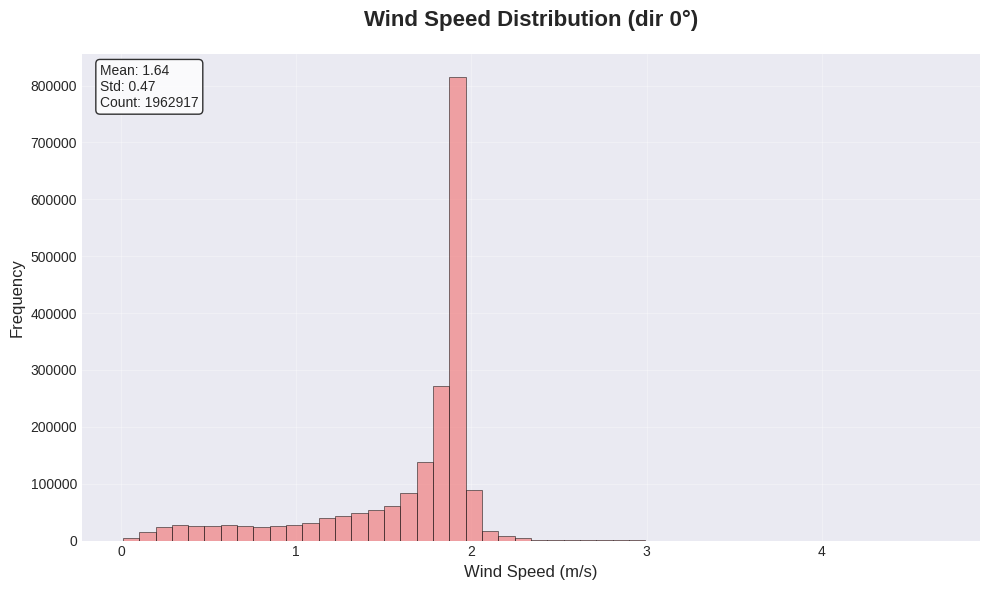


2️⃣  Creating threshold mask...
Angle: 0, Speed: 1.94
   Pixels above threshold: 1730607
✓ Saved raster: output_res_4/dir_0/mask_threshold.tif


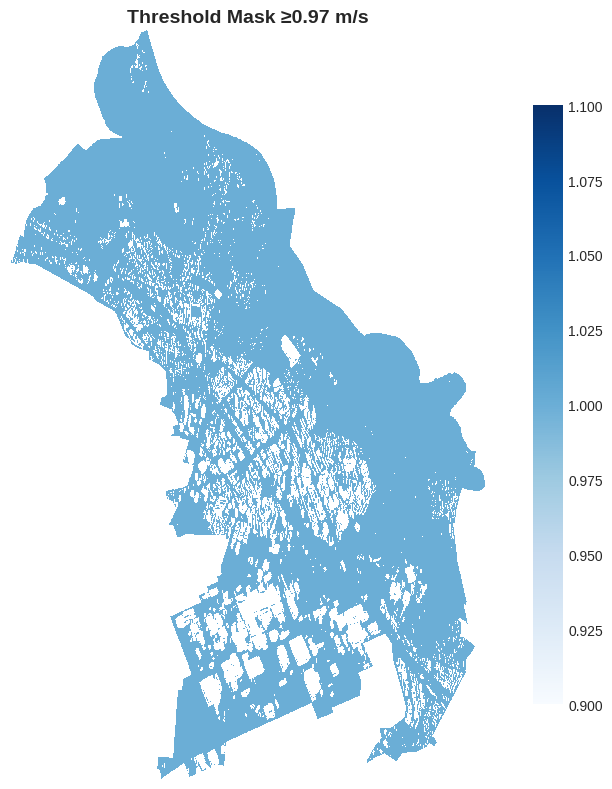


3️⃣  Cleaning mask...
✓ Saved raster: output_res_4/dir_0/mask_clean.tif


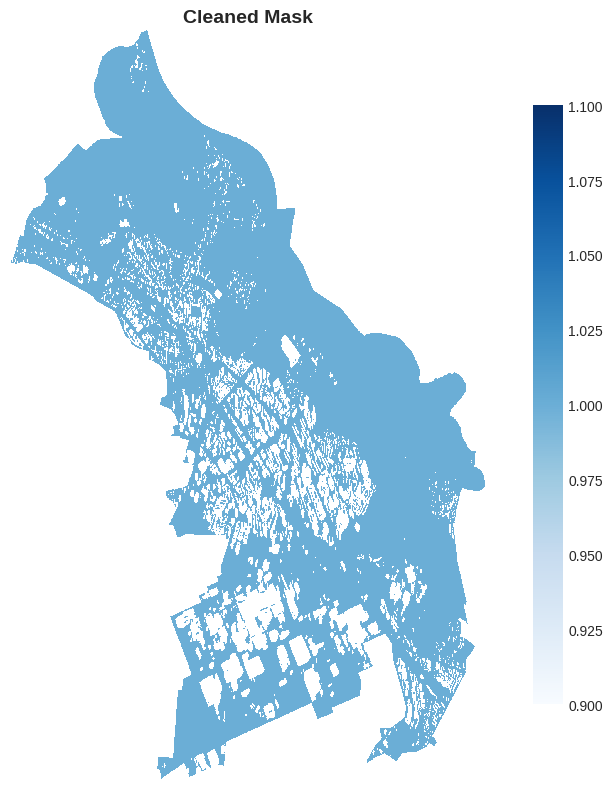


4️⃣  Eroding to minimum width (50.0m) and reconstructing...
   Pixels after erosion (surviving): 1162442
   Pixels after reconstruction: 1524991
✓ Saved raster: output_res_4/dir_0/mask_minwidth.tif


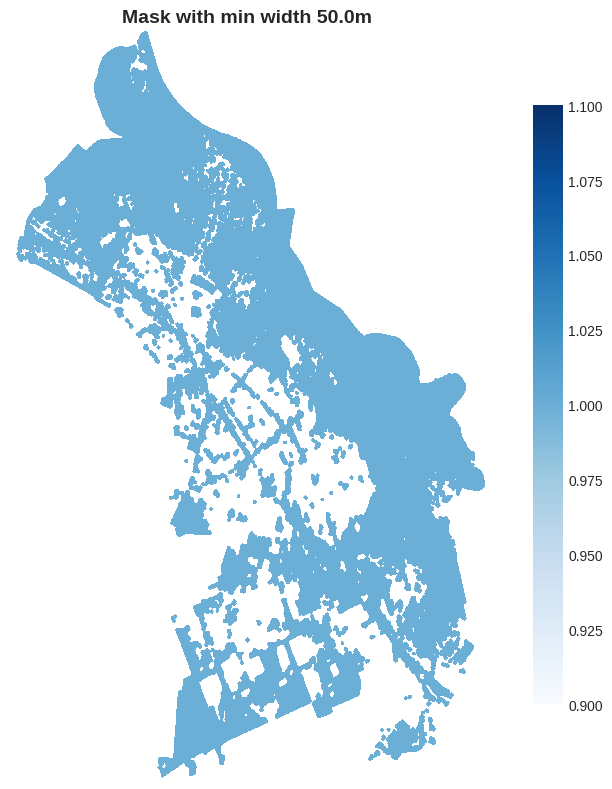


🔍 Filtering regions by approximate length >= 1000.0 m
   Number of regions found: 92
   Regions meeting ≥ 1000.0 m: 1
✓ Saved raster: output_res_4/dir_0/mask_filtered_by_length_0.tif


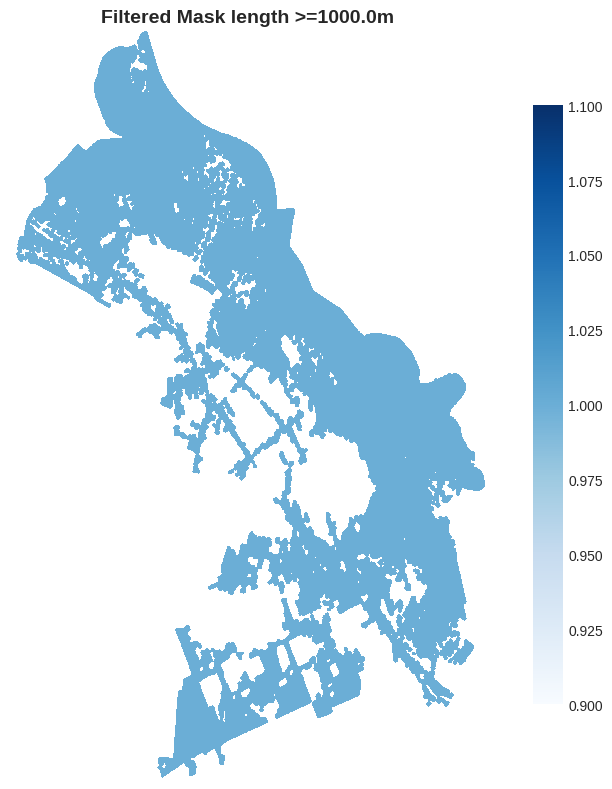


5️⃣  Creating skeleton from filtered mask...
   Skeleton pixels: 37154
✓ Saved raster: output_res_4/dir_0/skeleton_binary.tif


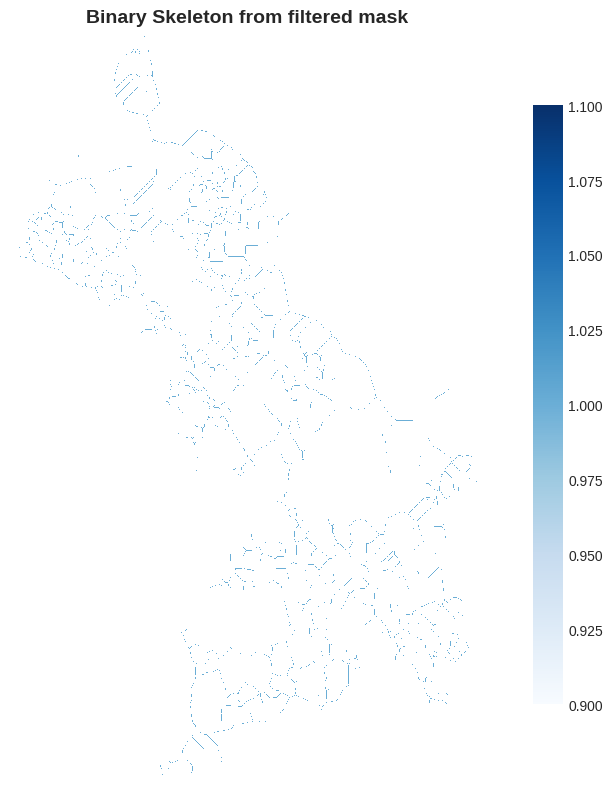


6️⃣  Creating skeleton with wind speeds...
✓ Saved raster: output_res_4/dir_0/skeleton_speed.tif


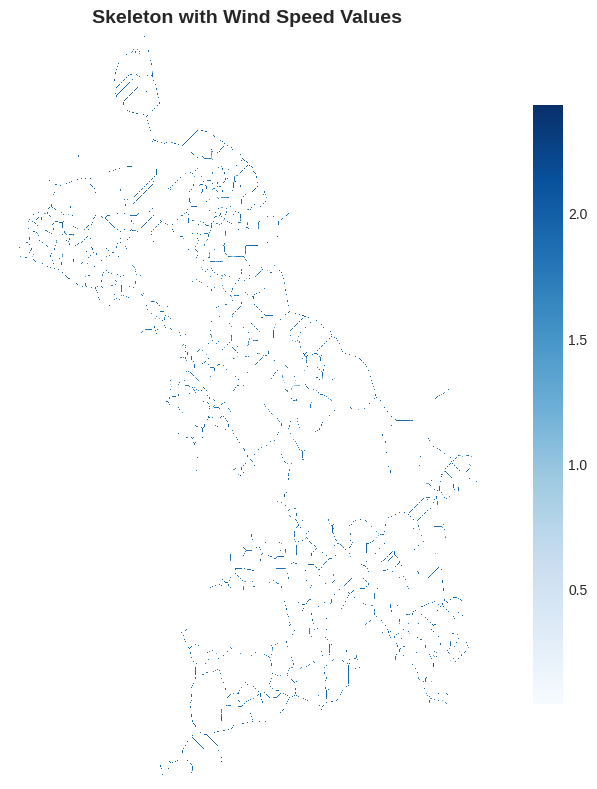


7️⃣  Processing wind direction...
✓ Saved raster: output_res_4/dir_0/skeleton_direction.tif


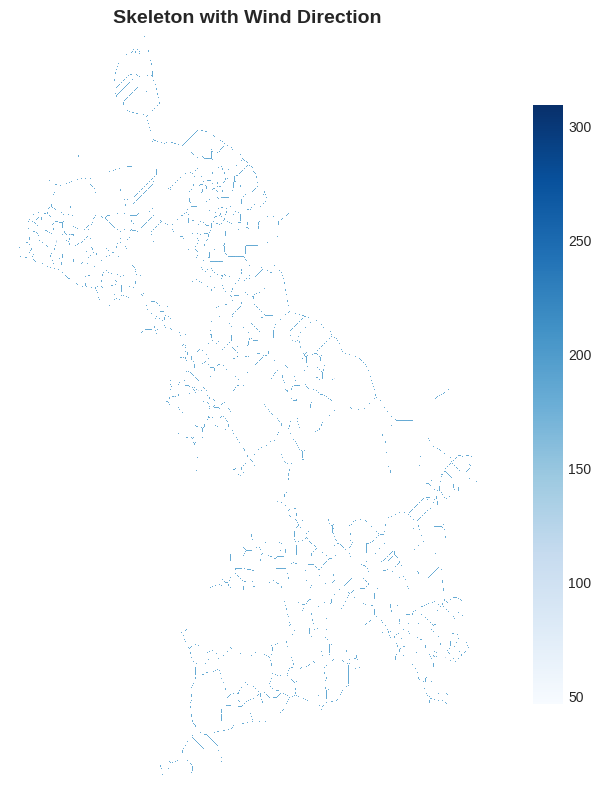


9️⃣  Analyzing Wind Corridors...
   Found 1 potential corridor regions
   Valid corridors meeting size criteria: 1

🏃‍♂️ Wind Corridor Analysis Results for direction 0°:
📏 Analysis Parameters:
   • Minimum length: 1000.0 m
   • Minimum width: 50.0 m
   • Wind speed threshold: 0.97 m/s
   • Pixel resolution: 4 m

📊 Results:
   • Total corridors identified: 1
   • Centerlines file: output_res_4/dir_0/wind_corridors_centerlines.gpkg
   • Polygons file: output_res_4/dir_0/wind_corridors_polygons.gpkg
   • Average corridor wind speed: 1.82 m/s
   • Total corridor area: 22.72 km²

✅ Wind corridor analysis complete for this direction!

🔄 Analysis for direction: 45°

1️⃣  Loading wind speed data...


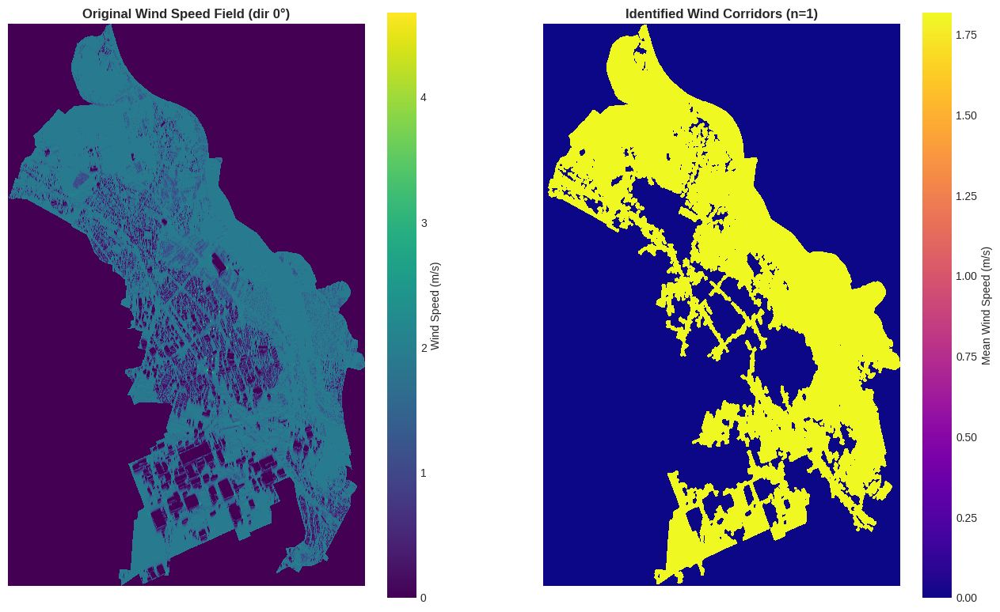

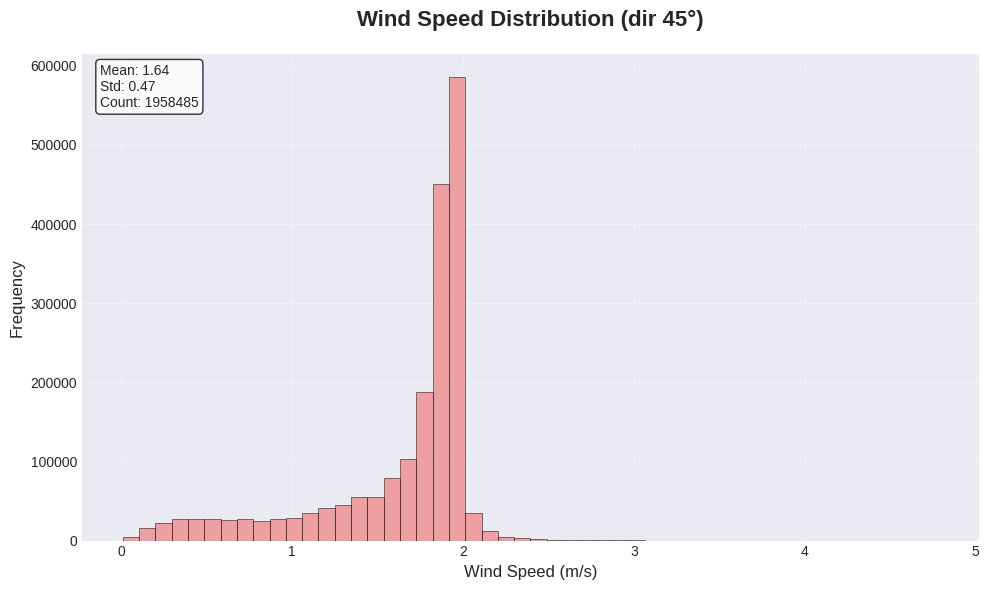


2️⃣  Creating threshold mask...
Angle: 45, Speed: 1.94
   Pixels above threshold: 1726902
✓ Saved raster: output_res_4/dir_45/mask_threshold.tif


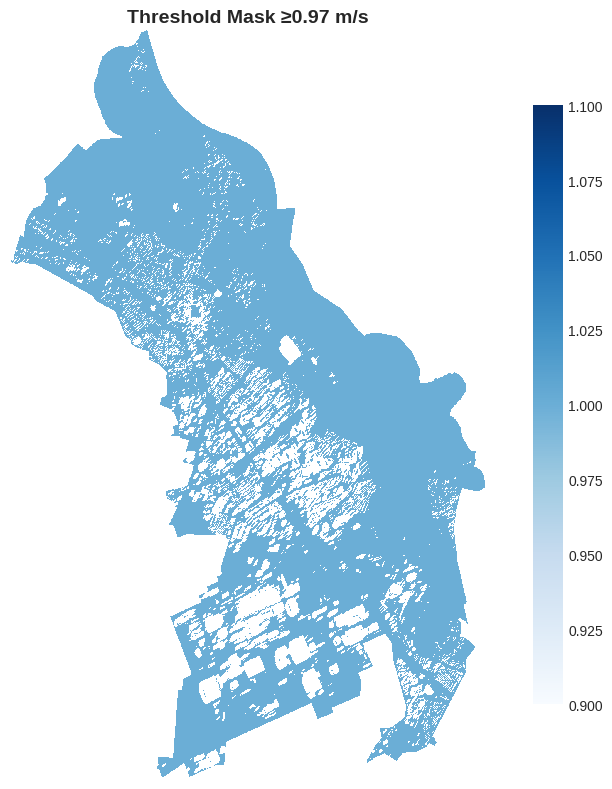


3️⃣  Cleaning mask...
✓ Saved raster: output_res_4/dir_45/mask_clean.tif


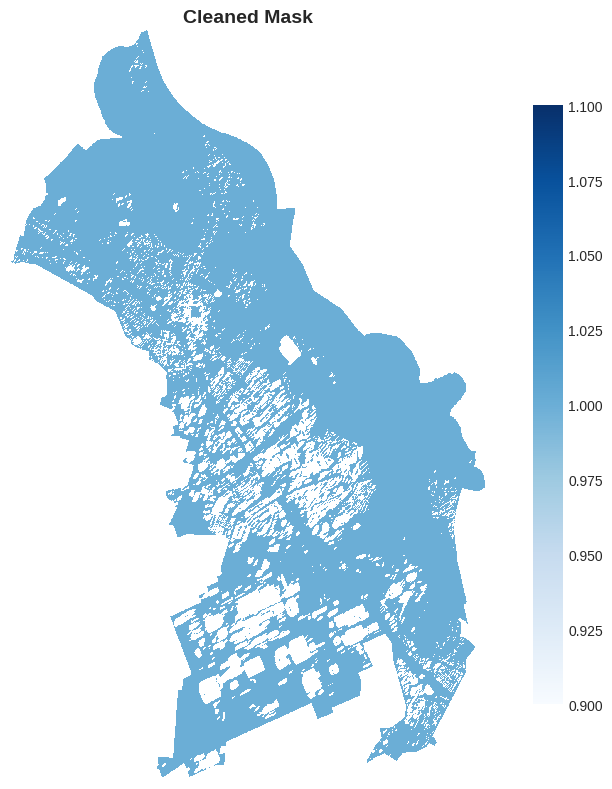


4️⃣  Eroding to minimum width (50.0m) and reconstructing...
   Pixels after erosion (surviving): 1159433
   Pixels after reconstruction: 1524831
✓ Saved raster: output_res_4/dir_45/mask_minwidth.tif


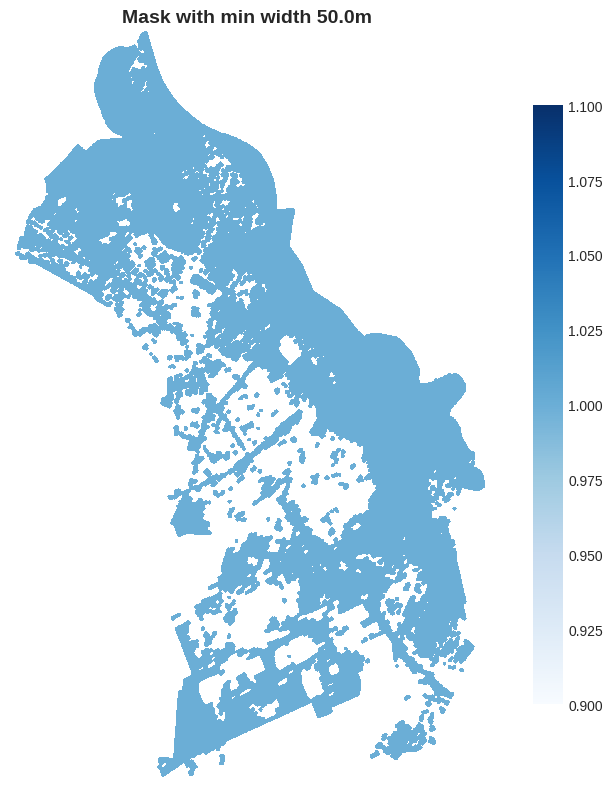


🔍 Filtering regions by approximate length >= 1000.0 m
   Number of regions found: 100
   Regions meeting ≥ 1000.0 m: 3
✓ Saved raster: output_res_4/dir_45/mask_filtered_by_length_45.tif


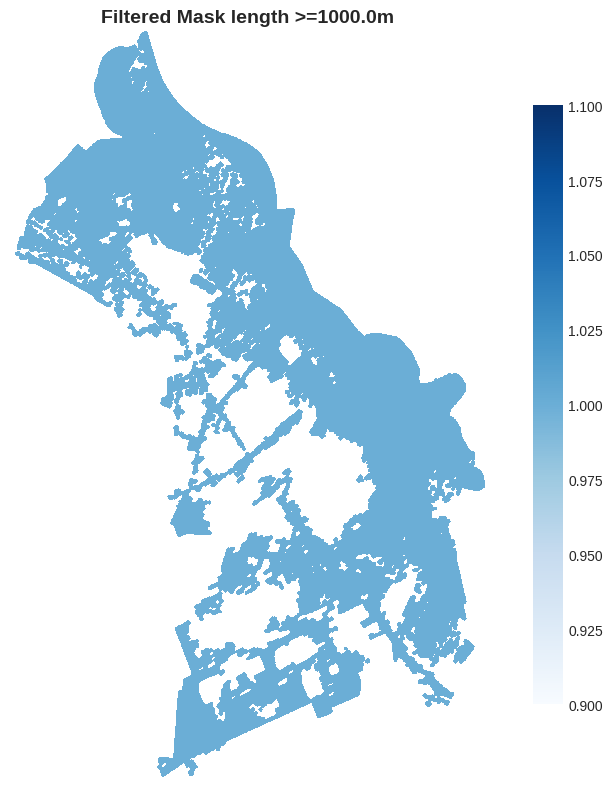


5️⃣  Creating skeleton from filtered mask...
   Skeleton pixels: 39741
✓ Saved raster: output_res_4/dir_45/skeleton_binary.tif


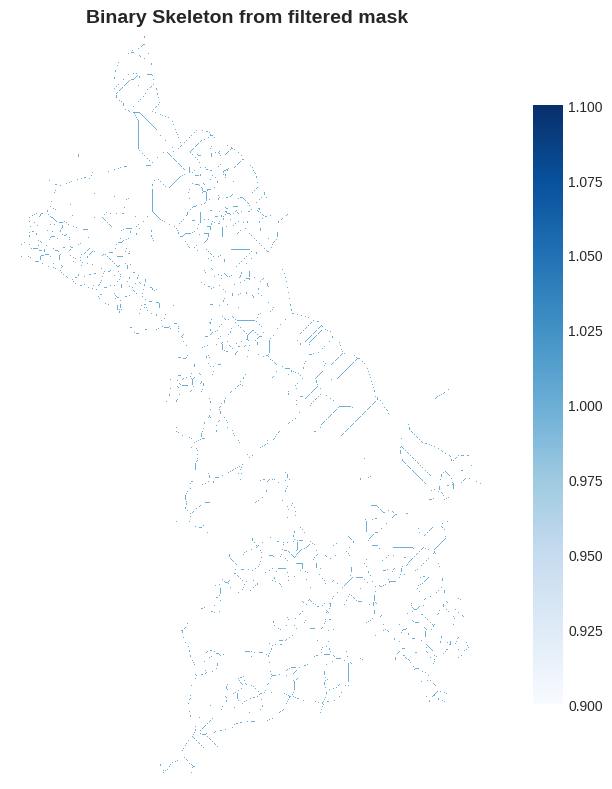


6️⃣  Creating skeleton with wind speeds...
✓ Saved raster: output_res_4/dir_45/skeleton_speed.tif


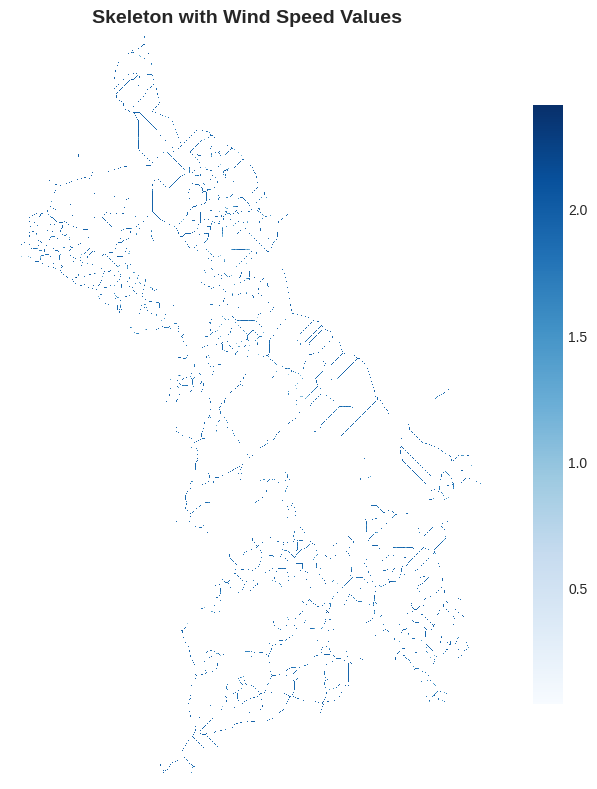


7️⃣  Processing wind direction...
✓ Saved raster: output_res_4/dir_45/skeleton_direction.tif


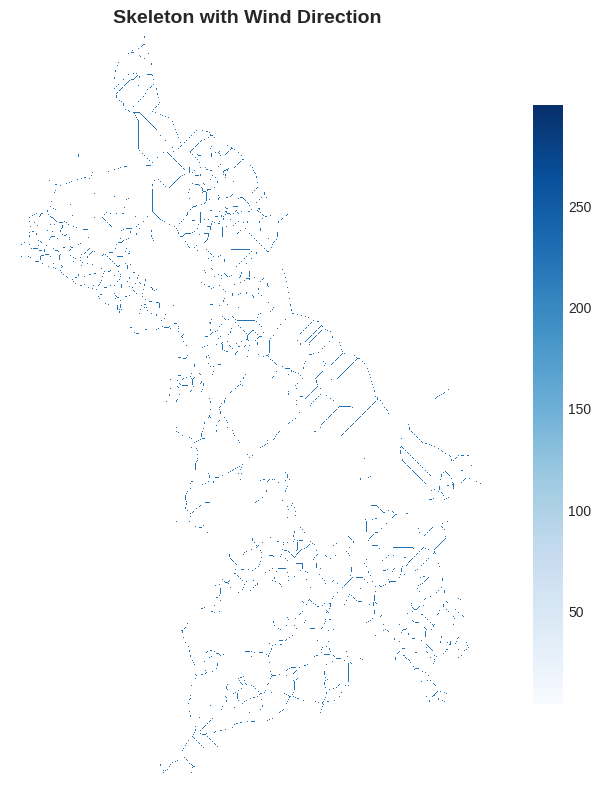


9️⃣  Analyzing Wind Corridors...
   Found 3 potential corridor regions
   Valid corridors meeting size criteria: 3

🏃‍♂️ Wind Corridor Analysis Results for direction 45°:
📏 Analysis Parameters:
   • Minimum length: 1000.0 m
   • Minimum width: 50.0 m
   • Wind speed threshold: 0.97 m/s
   • Pixel resolution: 4 m

📊 Results:
   • Total corridors identified: 3
   • Centerlines file: output_res_4/dir_45/wind_corridors_centerlines.gpkg
   • Polygons file: output_res_4/dir_45/wind_corridors_polygons.gpkg
   • Average corridor wind speed: 1.79 m/s
   • Total corridor area: 23.12 km²

✅ Wind corridor analysis complete for this direction!

🔄 Analysis for direction: 90°

1️⃣  Loading wind speed data...


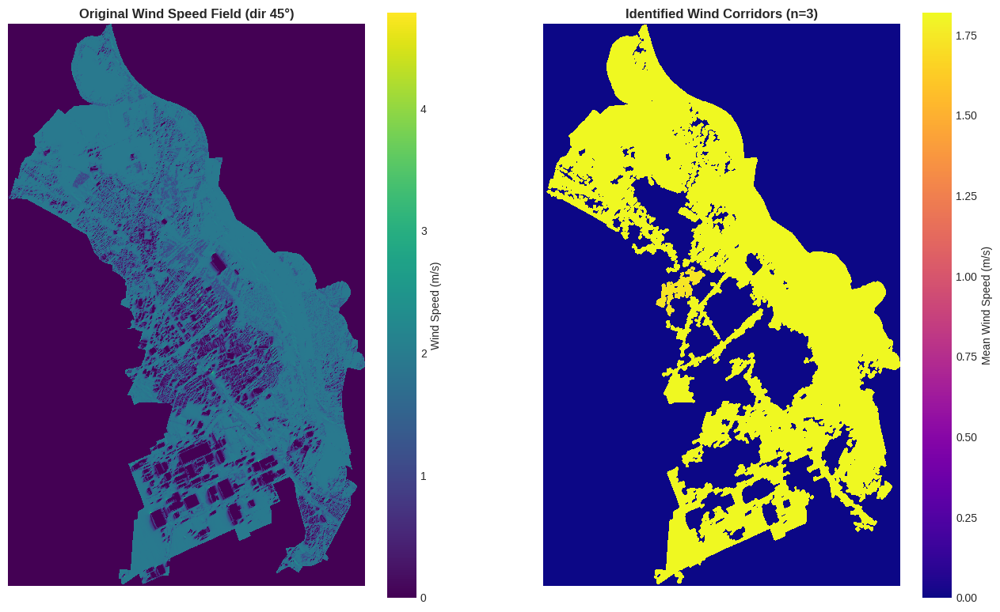

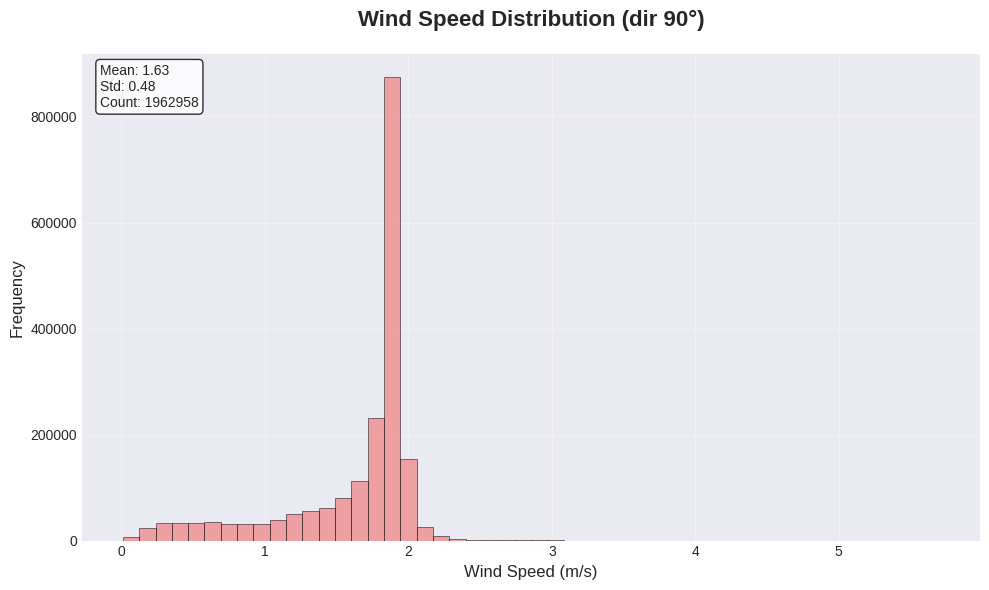


2️⃣  Creating threshold mask...
Angle: 90, Speed: 1.94
   Pixels above threshold: 1723389
✓ Saved raster: output_res_4/dir_90/mask_threshold.tif


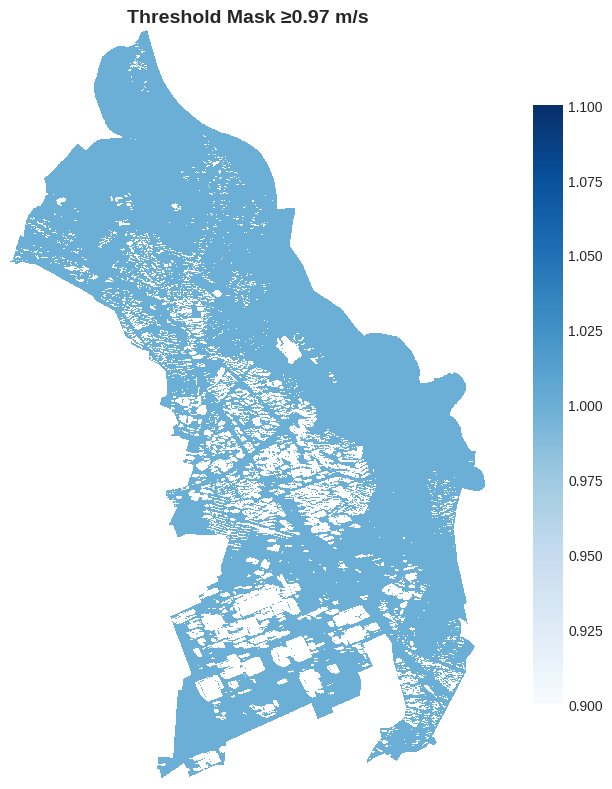


3️⃣  Cleaning mask...
✓ Saved raster: output_res_4/dir_90/mask_clean.tif


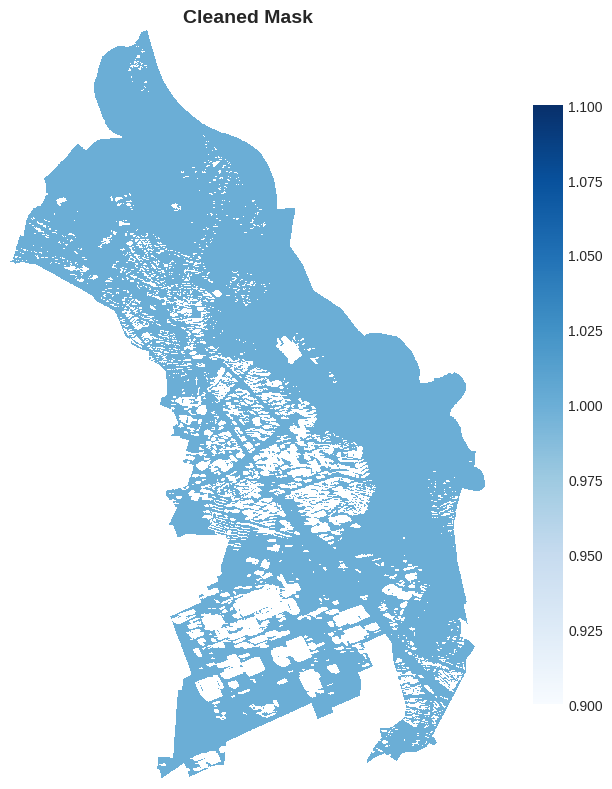


4️⃣  Eroding to minimum width (50.0m) and reconstructing...
   Pixels after erosion (surviving): 1159276
   Pixels after reconstruction: 1517866
✓ Saved raster: output_res_4/dir_90/mask_minwidth.tif


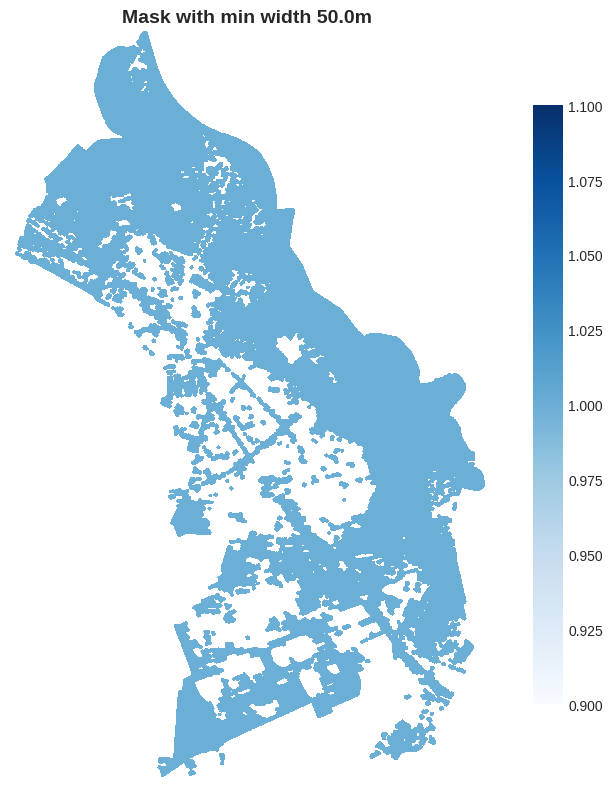


🔍 Filtering regions by approximate length >= 1000.0 m
   Number of regions found: 100
   Regions meeting ≥ 1000.0 m: 3
✓ Saved raster: output_res_4/dir_90/mask_filtered_by_length_90.tif


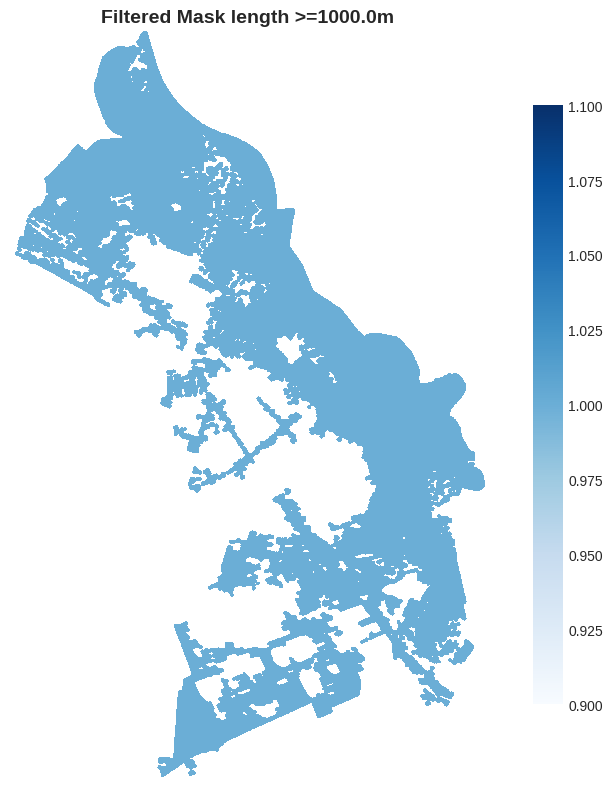


5️⃣  Creating skeleton from filtered mask...
   Skeleton pixels: 36857
✓ Saved raster: output_res_4/dir_90/skeleton_binary.tif


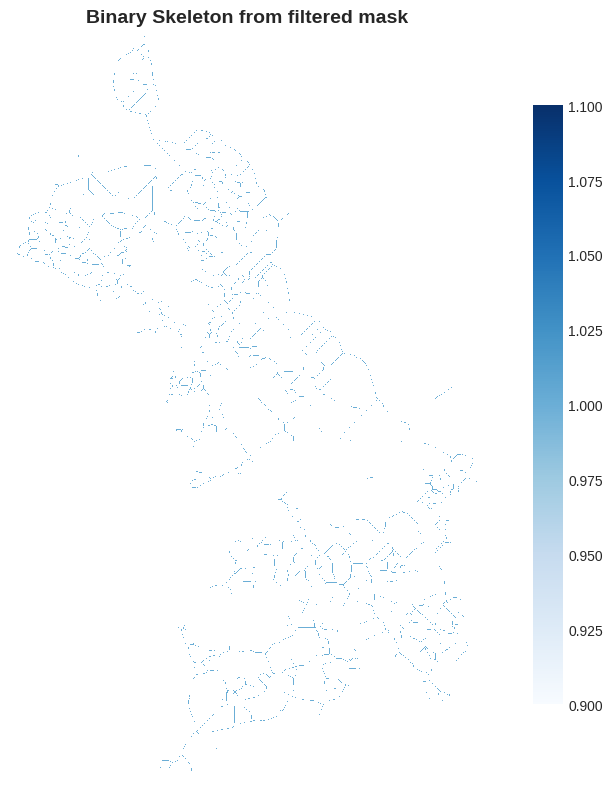


6️⃣  Creating skeleton with wind speeds...
✓ Saved raster: output_res_4/dir_90/skeleton_speed.tif


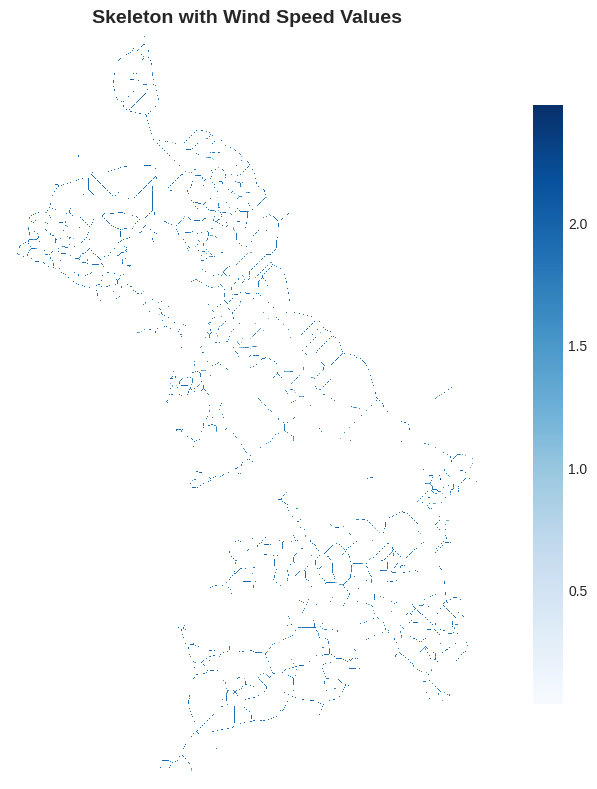


7️⃣  Processing wind direction...
✓ Saved raster: output_res_4/dir_90/skeleton_direction.tif


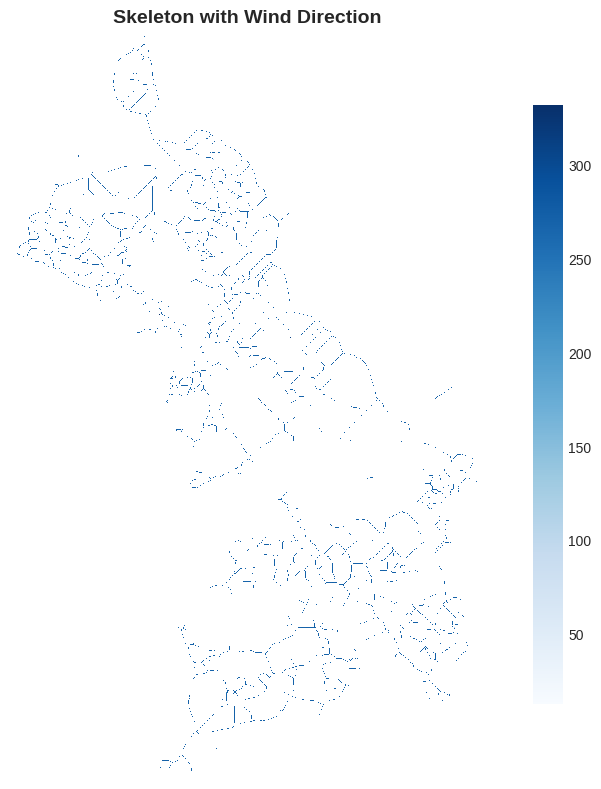


9️⃣  Analyzing Wind Corridors...
   Found 3 potential corridor regions
   Valid corridors meeting size criteria: 3

🏃‍♂️ Wind Corridor Analysis Results for direction 90°:
📏 Analysis Parameters:
   • Minimum length: 1000.0 m
   • Minimum width: 50.0 m
   • Wind speed threshold: 0.97 m/s
   • Pixel resolution: 4 m

📊 Results:
   • Total corridors identified: 3
   • Centerlines file: output_res_4/dir_90/wind_corridors_centerlines.gpkg
   • Polygons file: output_res_4/dir_90/wind_corridors_polygons.gpkg
   • Average corridor wind speed: 1.80 m/s
   • Total corridor area: 22.52 km²

✅ Wind corridor analysis complete for this direction!

🔄 Analysis for direction: 135°

1️⃣  Loading wind speed data...


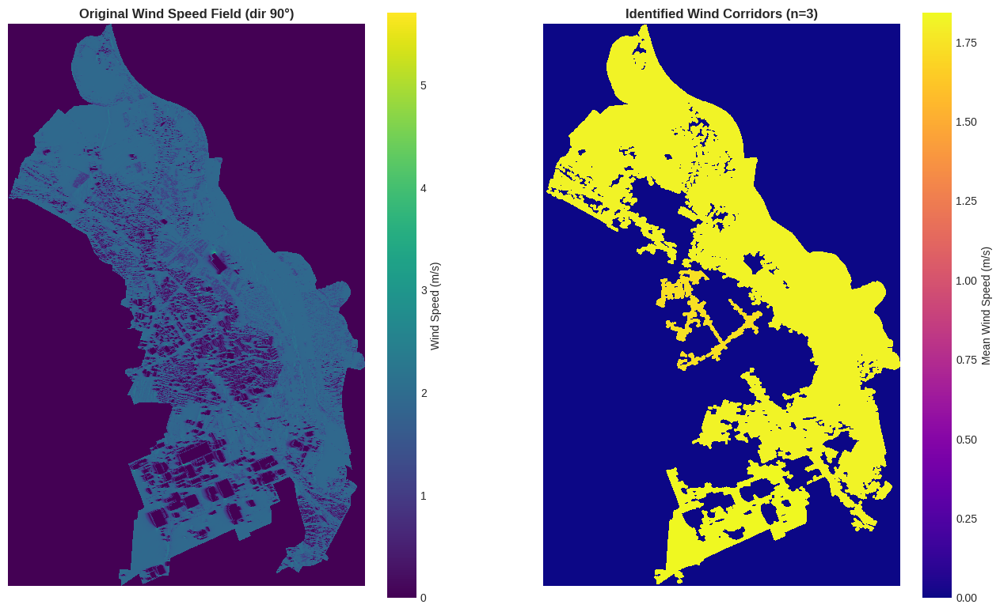

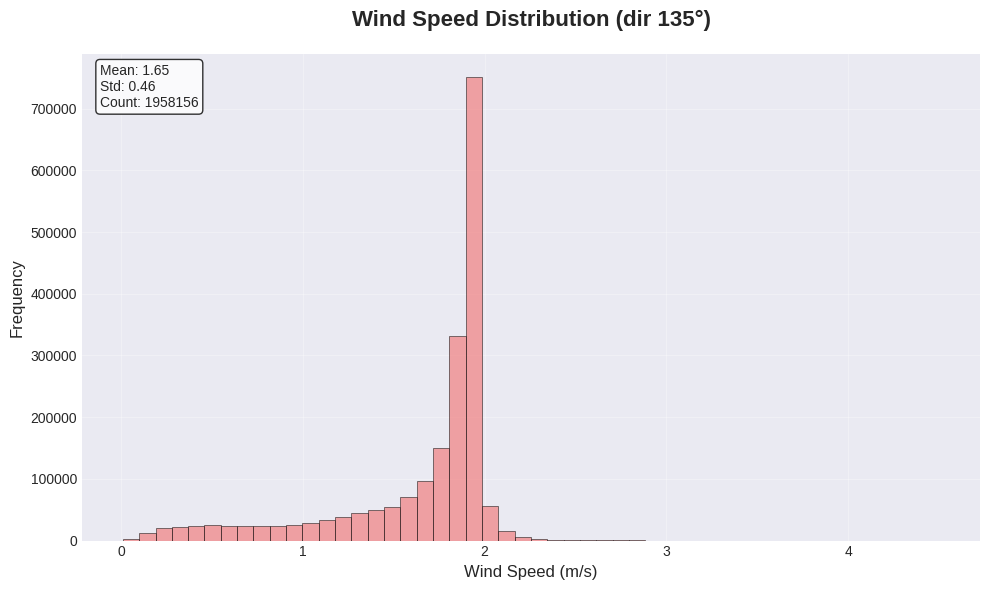


2️⃣  Creating threshold mask...
Angle: 135, Speed: 1.94
   Pixels above threshold: 1739932
✓ Saved raster: output_res_4/dir_135/mask_threshold.tif


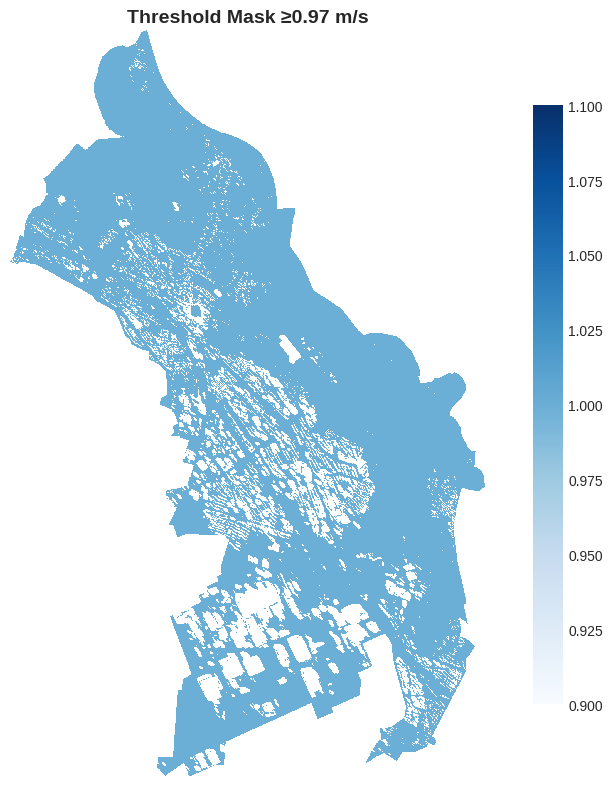


3️⃣  Cleaning mask...
✓ Saved raster: output_res_4/dir_135/mask_clean.tif


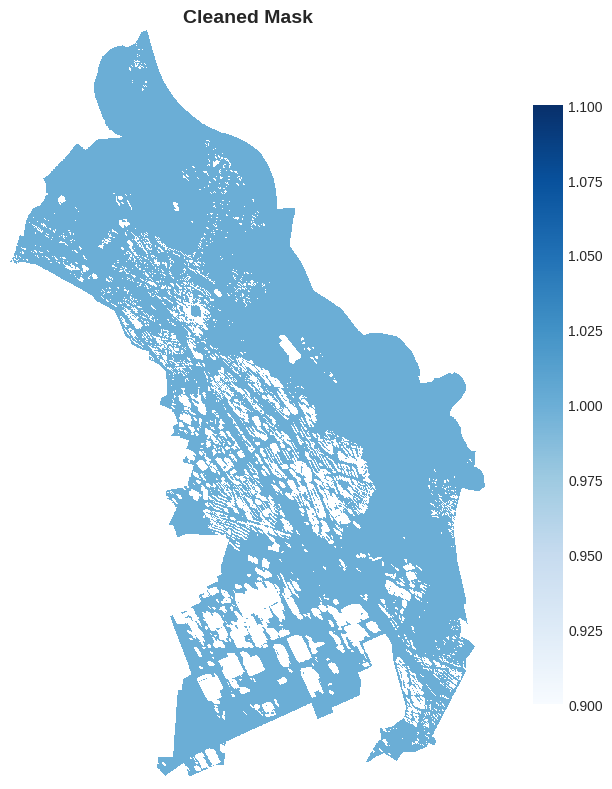


4️⃣  Eroding to minimum width (50.0m) and reconstructing...
   Pixels after erosion (surviving): 1168568
   Pixels after reconstruction: 1540028
✓ Saved raster: output_res_4/dir_135/mask_minwidth.tif


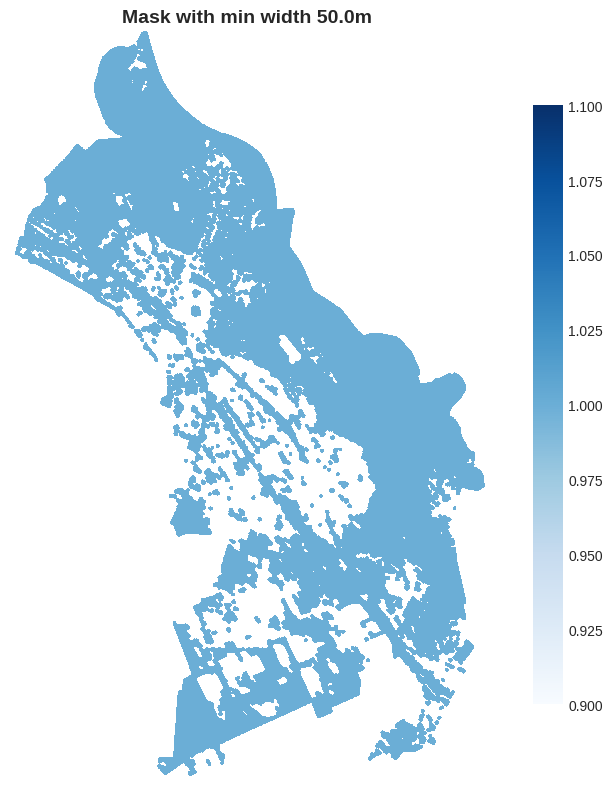


🔍 Filtering regions by approximate length >= 1000.0 m
   Number of regions found: 110
   Regions meeting ≥ 1000.0 m: 3
✓ Saved raster: output_res_4/dir_135/mask_filtered_by_length_135.tif


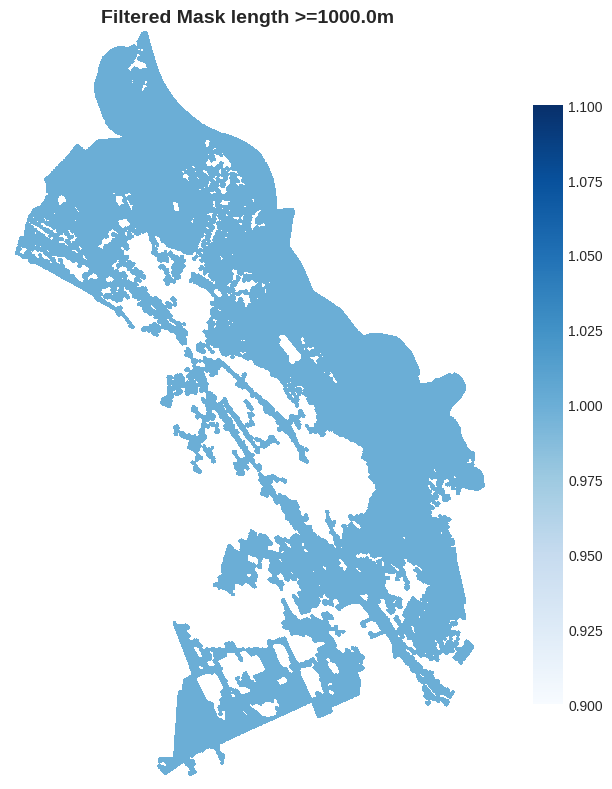


5️⃣  Creating skeleton from filtered mask...
   Skeleton pixels: 38604
✓ Saved raster: output_res_4/dir_135/skeleton_binary.tif


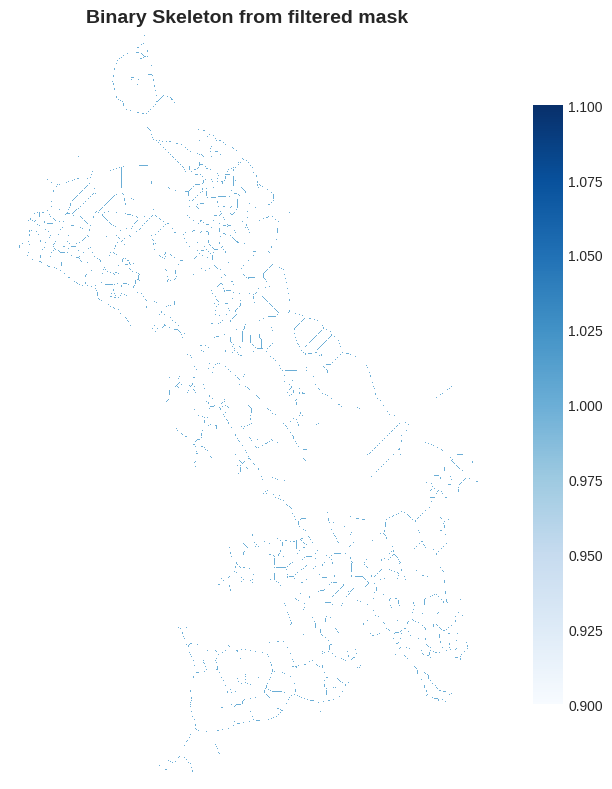


6️⃣  Creating skeleton with wind speeds...
✓ Saved raster: output_res_4/dir_135/skeleton_speed.tif


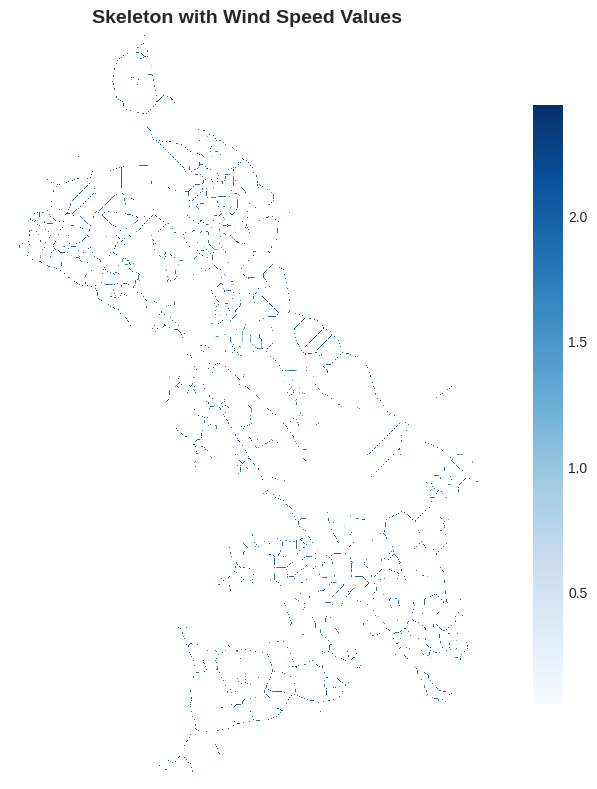


7️⃣  Processing wind direction...
✓ Saved raster: output_res_4/dir_135/skeleton_direction.tif


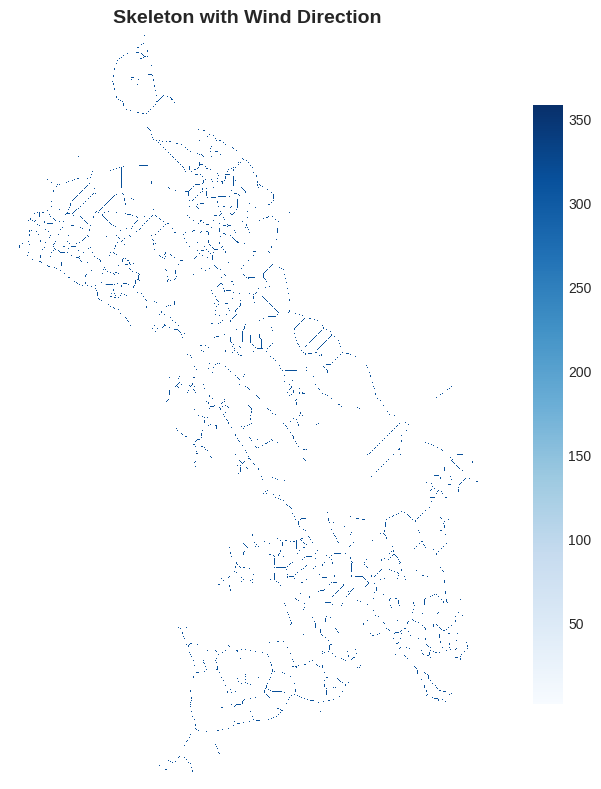


9️⃣  Analyzing Wind Corridors...
   Found 3 potential corridor regions
   Valid corridors meeting size criteria: 3

🏃‍♂️ Wind Corridor Analysis Results for direction 135°:
📏 Analysis Parameters:
   • Minimum length: 1000.0 m
   • Minimum width: 50.0 m
   • Wind speed threshold: 0.97 m/s
   • Pixel resolution: 4 m

📊 Results:
   • Total corridors identified: 3
   • Centerlines file: output_res_4/dir_135/wind_corridors_centerlines.gpkg
   • Polygons file: output_res_4/dir_135/wind_corridors_polygons.gpkg
   • Average corridor wind speed: 1.80 m/s
   • Total corridor area: 23.07 km²

✅ Wind corridor analysis complete for this direction!

🔄 Analysis for direction: 180°

1️⃣  Loading wind speed data...


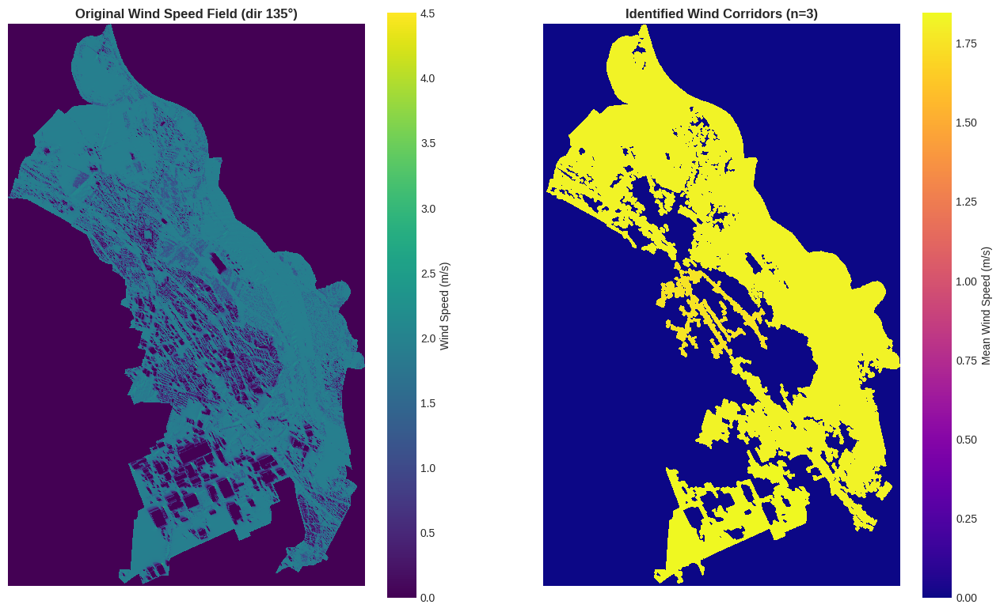

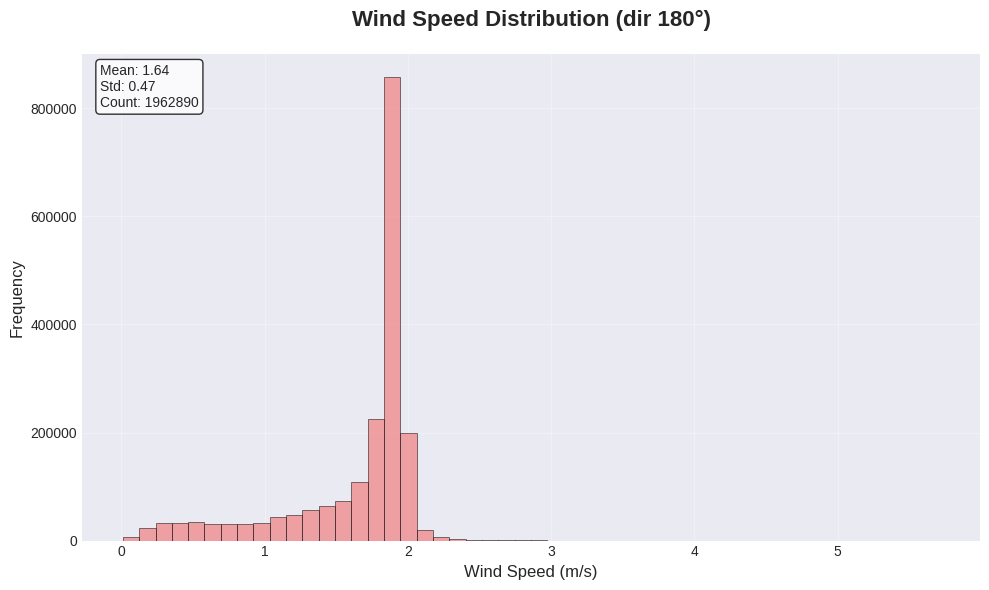


2️⃣  Creating threshold mask...
Angle: 180, Speed: 1.94
   Pixels above threshold: 1729748
✓ Saved raster: output_res_4/dir_180/mask_threshold.tif


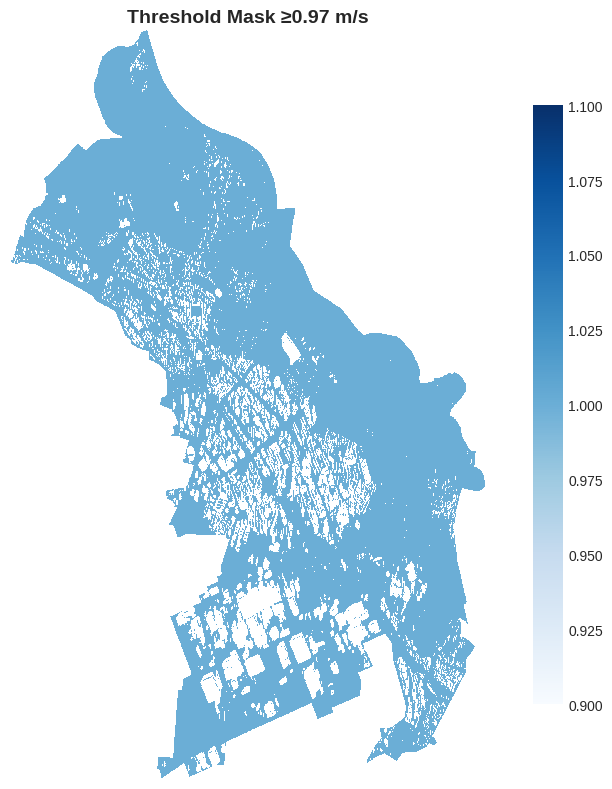


3️⃣  Cleaning mask...
✓ Saved raster: output_res_4/dir_180/mask_clean.tif


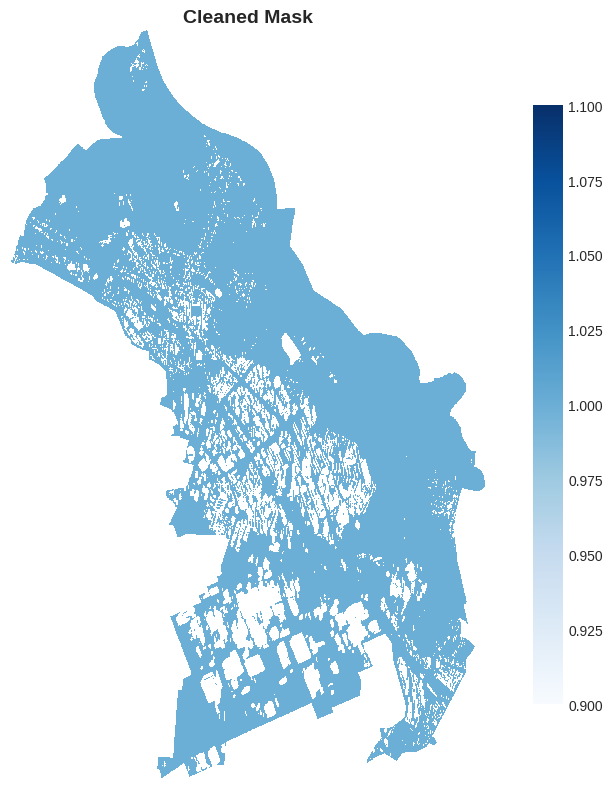


4️⃣  Eroding to minimum width (50.0m) and reconstructing...
   Pixels after erosion (surviving): 1162824
   Pixels after reconstruction: 1523398
✓ Saved raster: output_res_4/dir_180/mask_minwidth.tif


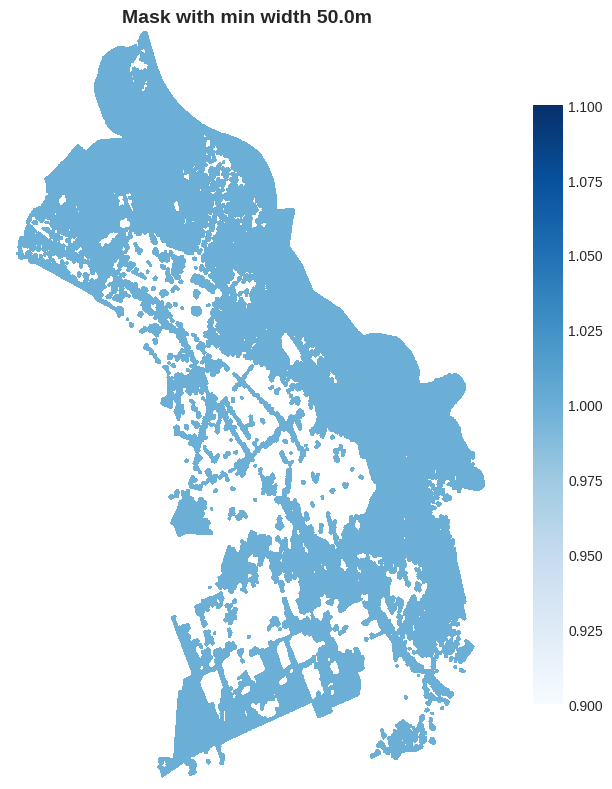


🔍 Filtering regions by approximate length >= 1000.0 m
   Number of regions found: 92
   Regions meeting ≥ 1000.0 m: 1
✓ Saved raster: output_res_4/dir_180/mask_filtered_by_length_180.tif


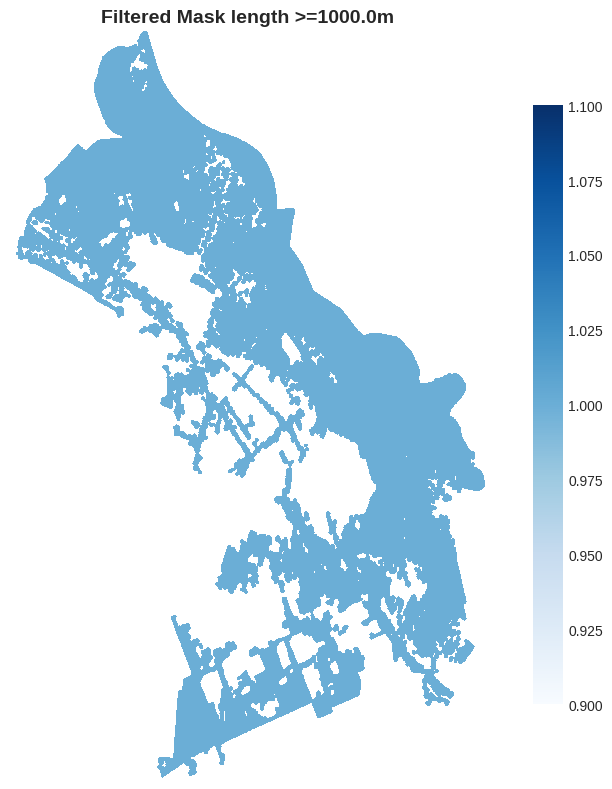


5️⃣  Creating skeleton from filtered mask...
   Skeleton pixels: 37210
✓ Saved raster: output_res_4/dir_180/skeleton_binary.tif


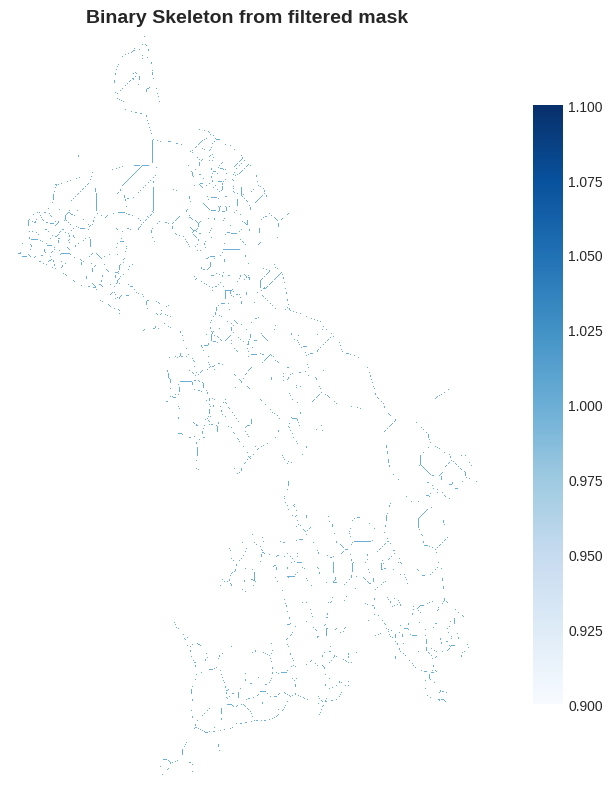


6️⃣  Creating skeleton with wind speeds...
✓ Saved raster: output_res_4/dir_180/skeleton_speed.tif


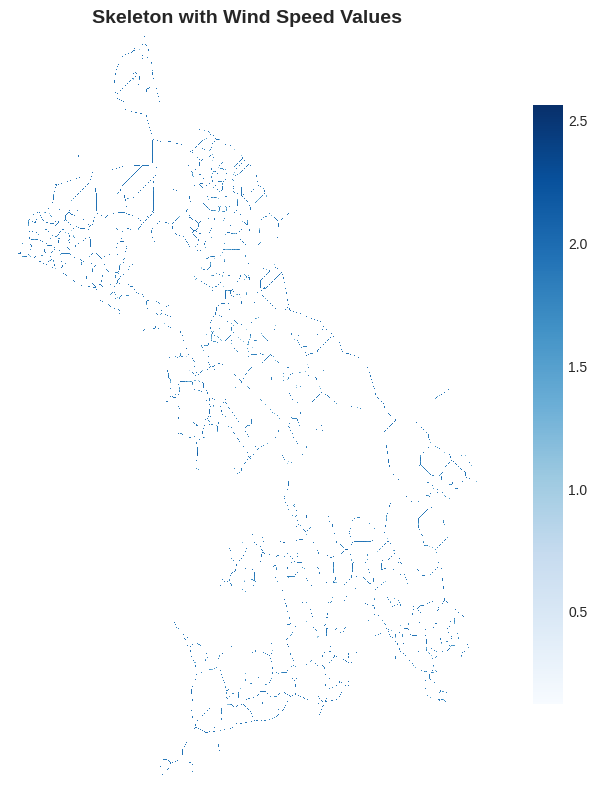


7️⃣  Processing wind direction...
✓ Saved raster: output_res_4/dir_180/skeleton_direction.tif


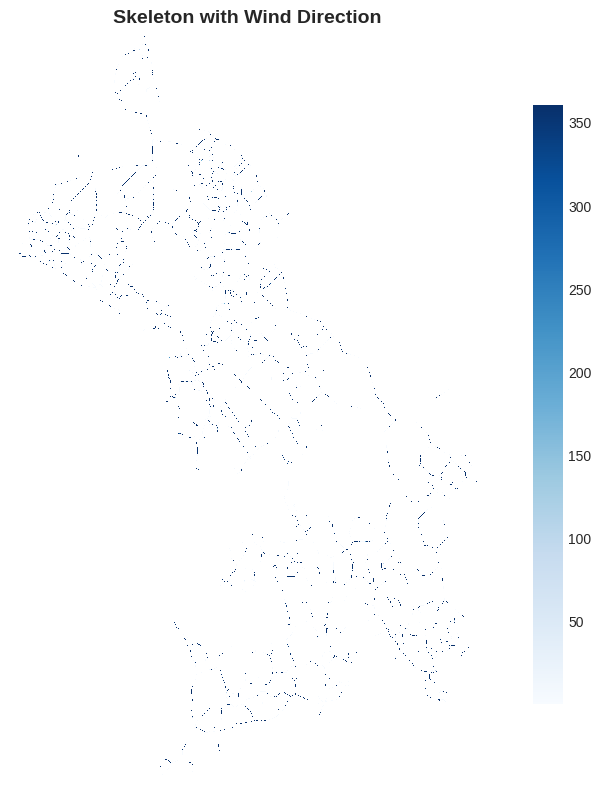


9️⃣  Analyzing Wind Corridors...
   Found 1 potential corridor regions
   Valid corridors meeting size criteria: 1

🏃‍♂️ Wind Corridor Analysis Results for direction 180°:
📏 Analysis Parameters:
   • Minimum length: 1000.0 m
   • Minimum width: 50.0 m
   • Wind speed threshold: 0.97 m/s
   • Pixel resolution: 4 m

📊 Results:
   • Total corridors identified: 1
   • Centerlines file: output_res_4/dir_180/wind_corridors_centerlines.gpkg
   • Polygons file: output_res_4/dir_180/wind_corridors_polygons.gpkg
   • Average corridor wind speed: 1.82 m/s
   • Total corridor area: 22.77 km²

✅ Wind corridor analysis complete for this direction!

🔄 Analysis for direction: 225°

1️⃣  Loading wind speed data...


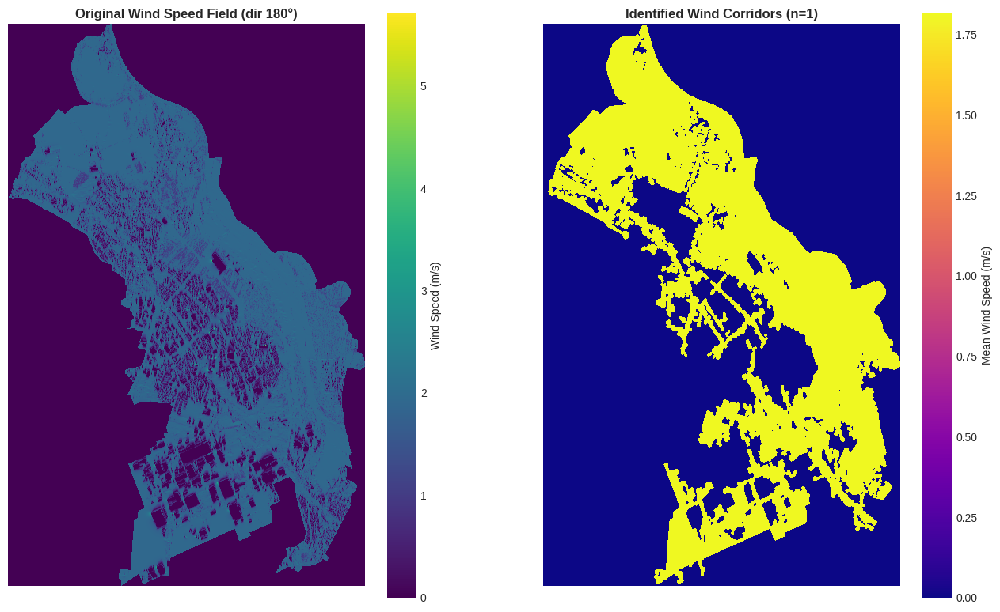

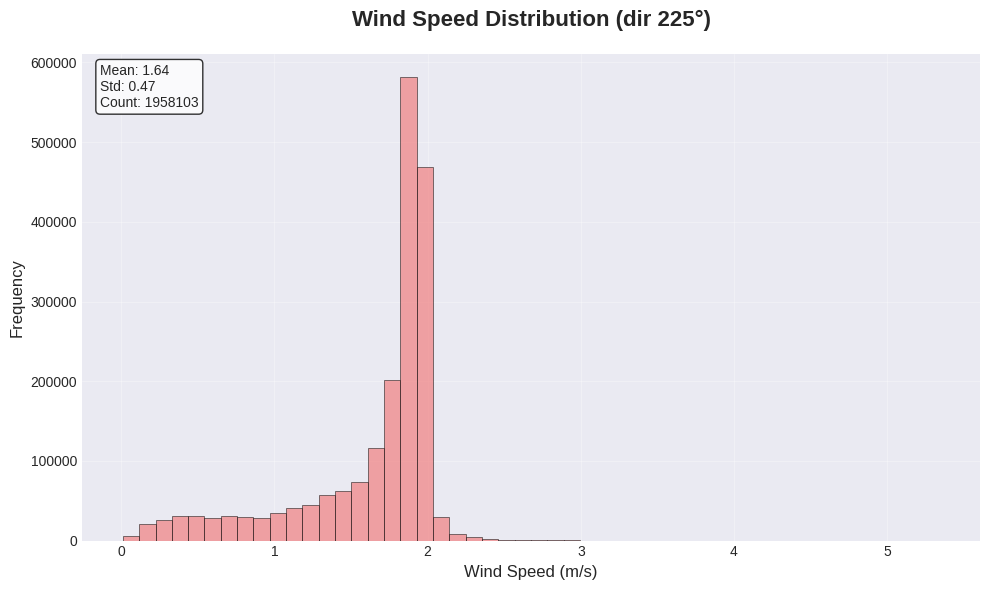


2️⃣  Creating threshold mask...
Angle: 225, Speed: 1.94
   Pixels above threshold: 1727955
✓ Saved raster: output_res_4/dir_225/mask_threshold.tif


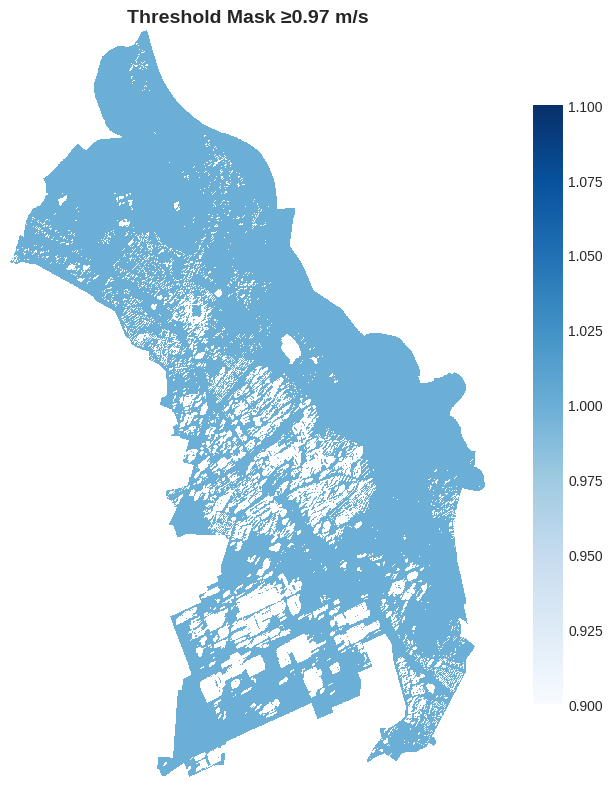


3️⃣  Cleaning mask...
✓ Saved raster: output_res_4/dir_225/mask_clean.tif


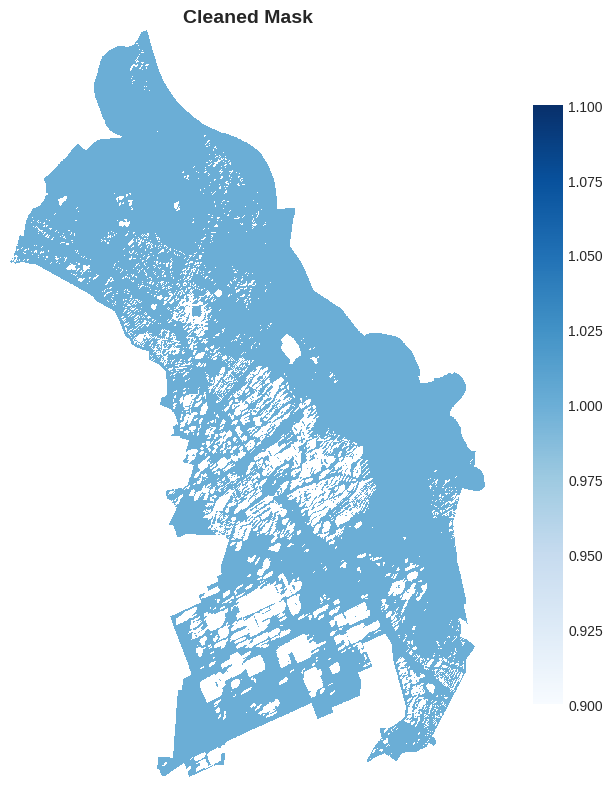


4️⃣  Eroding to minimum width (50.0m) and reconstructing...
   Pixels after erosion (surviving): 1158996
   Pixels after reconstruction: 1526241
✓ Saved raster: output_res_4/dir_225/mask_minwidth.tif


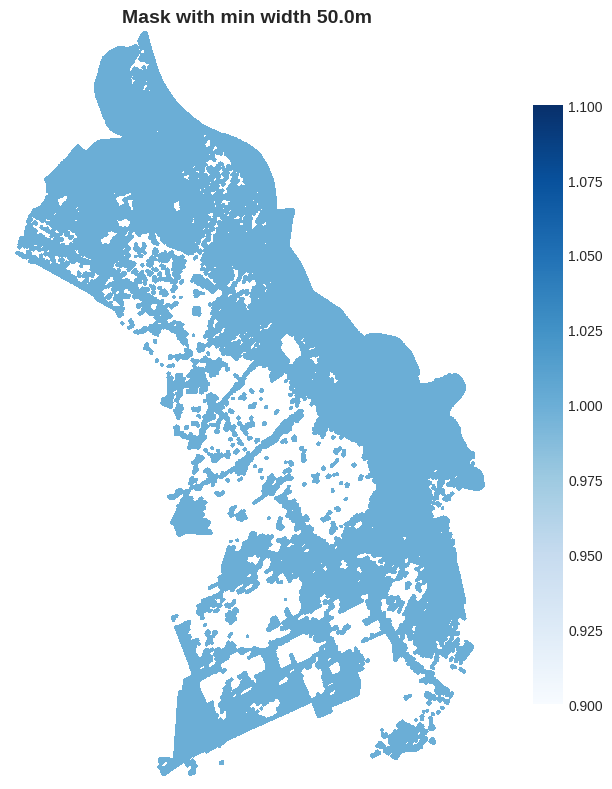


🔍 Filtering regions by approximate length >= 1000.0 m
   Number of regions found: 115
   Regions meeting ≥ 1000.0 m: 3
✓ Saved raster: output_res_4/dir_225/mask_filtered_by_length_225.tif


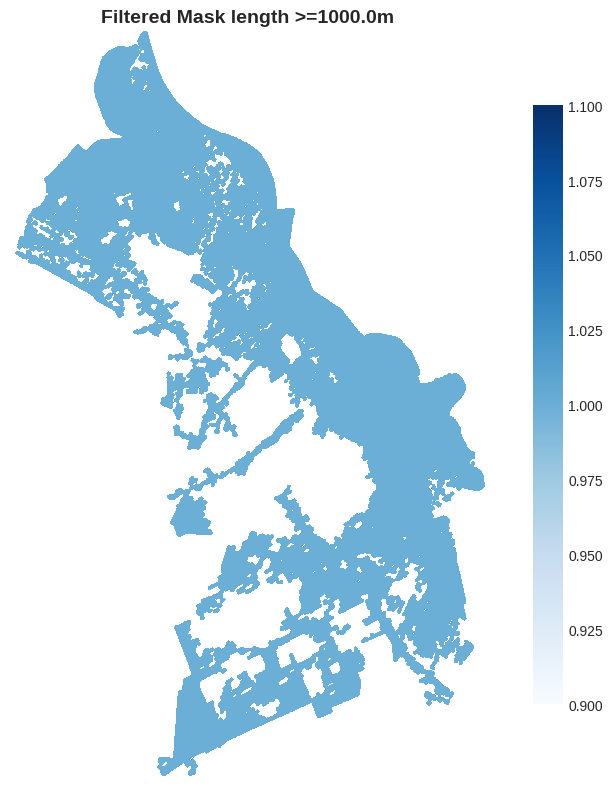


5️⃣  Creating skeleton from filtered mask...
   Skeleton pixels: 38466
✓ Saved raster: output_res_4/dir_225/skeleton_binary.tif


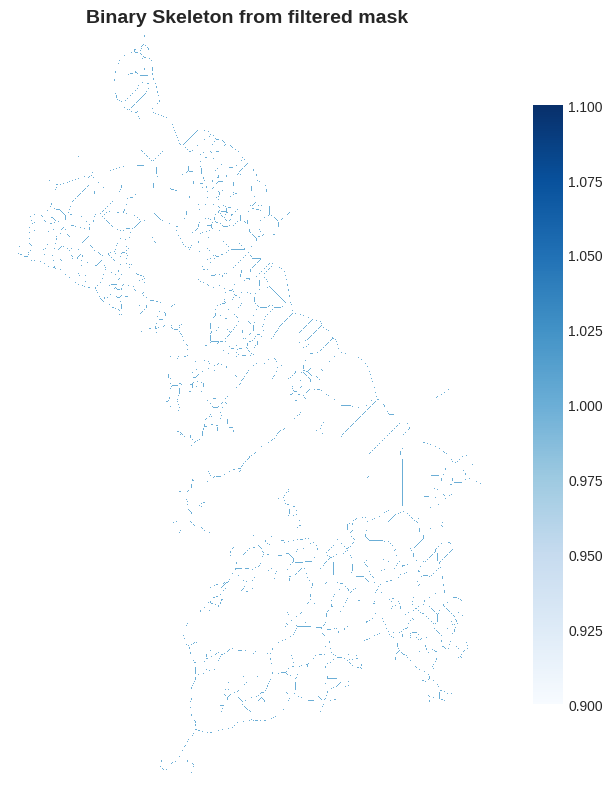


6️⃣  Creating skeleton with wind speeds...
✓ Saved raster: output_res_4/dir_225/skeleton_speed.tif


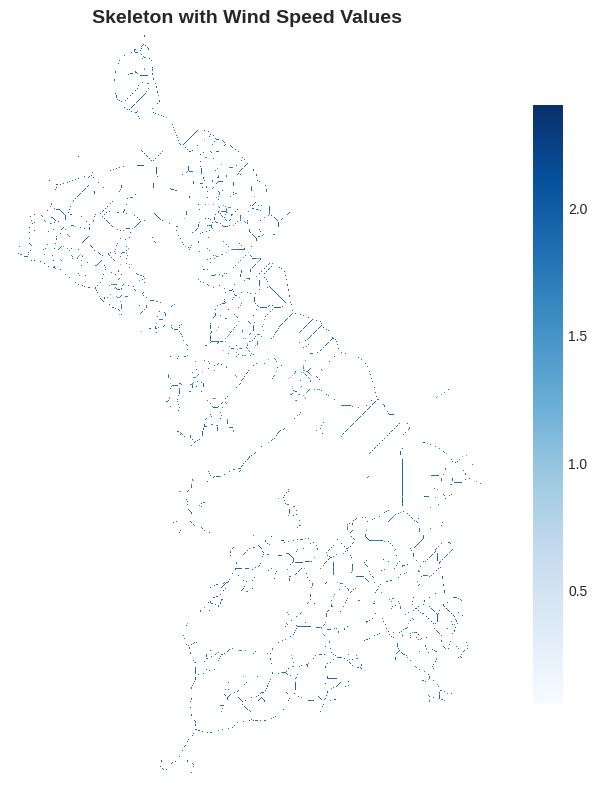


7️⃣  Processing wind direction...
✓ Saved raster: output_res_4/dir_225/skeleton_direction.tif


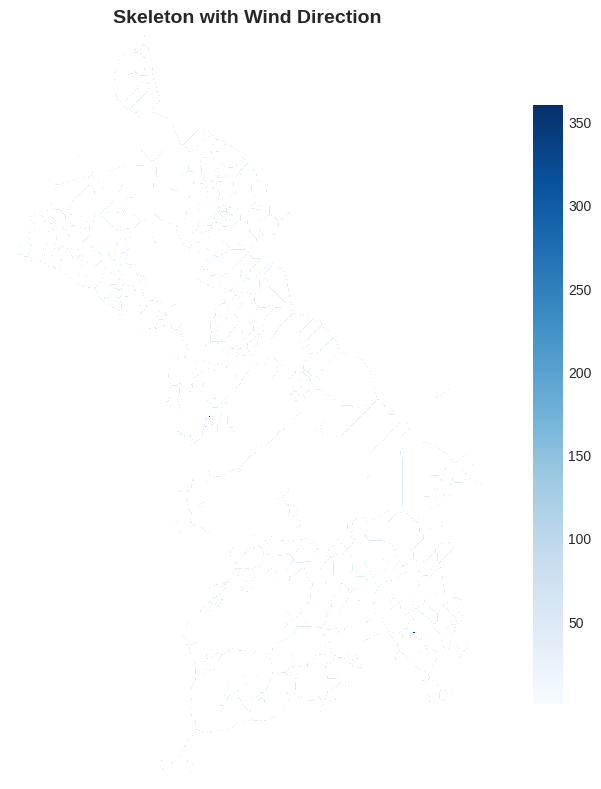


9️⃣  Analyzing Wind Corridors...
   Found 3 potential corridor regions
   Valid corridors meeting size criteria: 3

🏃‍♂️ Wind Corridor Analysis Results for direction 225°:
📏 Analysis Parameters:
   • Minimum length: 1000.0 m
   • Minimum width: 50.0 m
   • Wind speed threshold: 0.97 m/s
   • Pixel resolution: 4 m

📊 Results:
   • Total corridors identified: 3
   • Centerlines file: output_res_4/dir_225/wind_corridors_centerlines.gpkg
   • Polygons file: output_res_4/dir_225/wind_corridors_polygons.gpkg
   • Average corridor wind speed: 1.79 m/s
   • Total corridor area: 22.96 km²

✅ Wind corridor analysis complete for this direction!

🔄 Analysis for direction: 270°

1️⃣  Loading wind speed data...


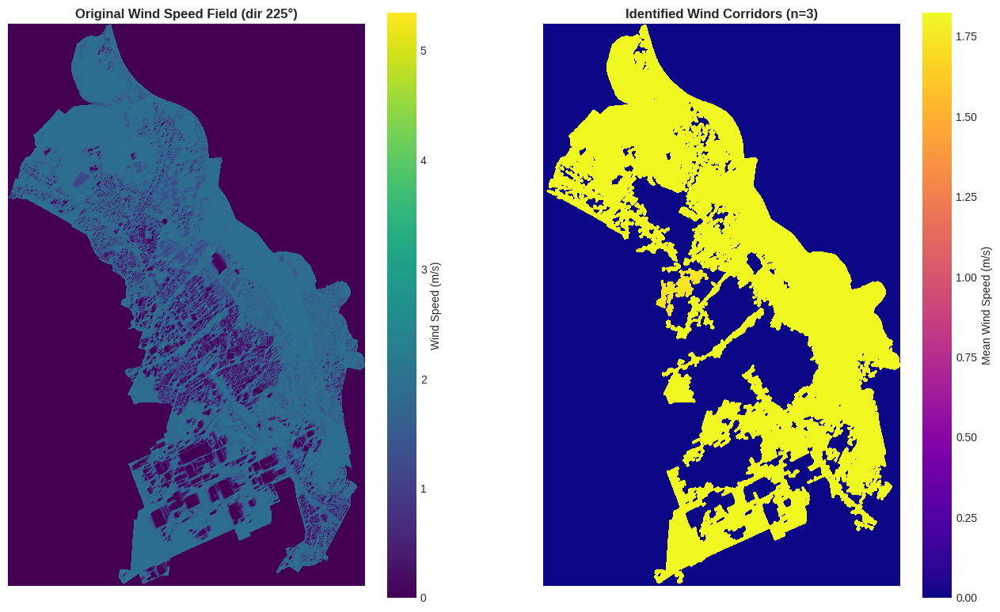

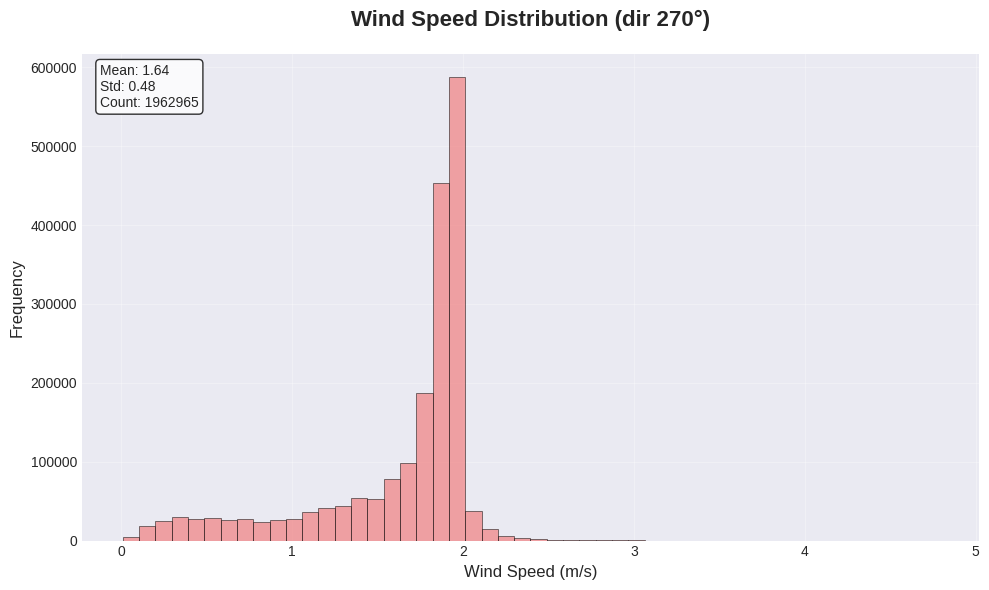


2️⃣  Creating threshold mask...
Angle: 270, Speed: 1.94
   Pixels above threshold: 1724510
✓ Saved raster: output_res_4/dir_270/mask_threshold.tif


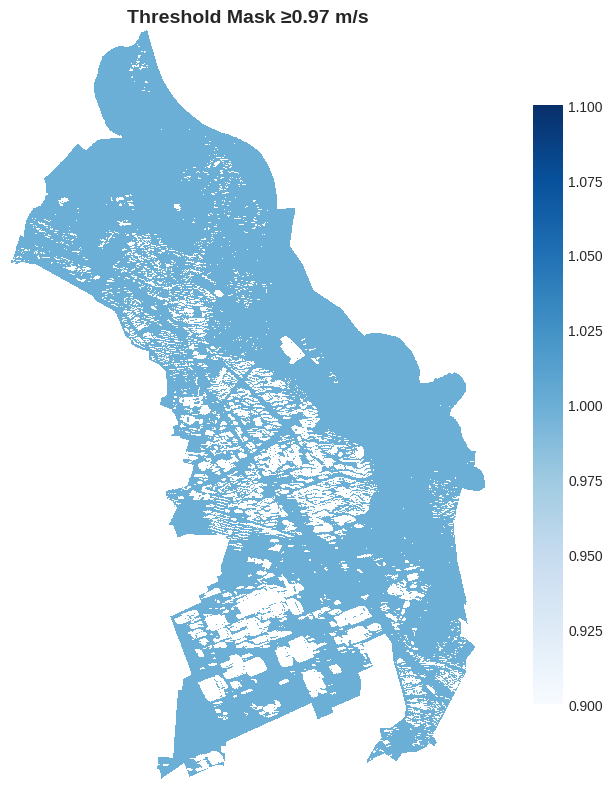


3️⃣  Cleaning mask...
✓ Saved raster: output_res_4/dir_270/mask_clean.tif


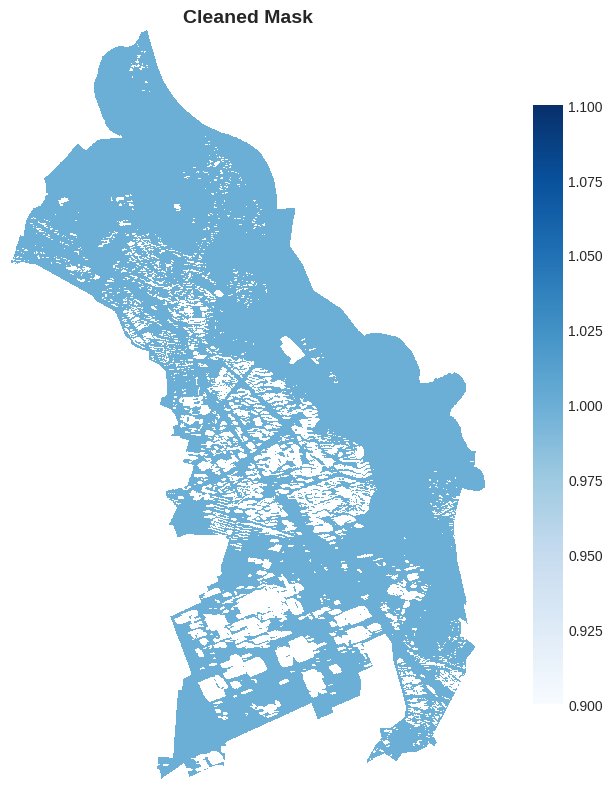


4️⃣  Eroding to minimum width (50.0m) and reconstructing...
   Pixels after erosion (surviving): 1162950
   Pixels after reconstruction: 1520661
✓ Saved raster: output_res_4/dir_270/mask_minwidth.tif


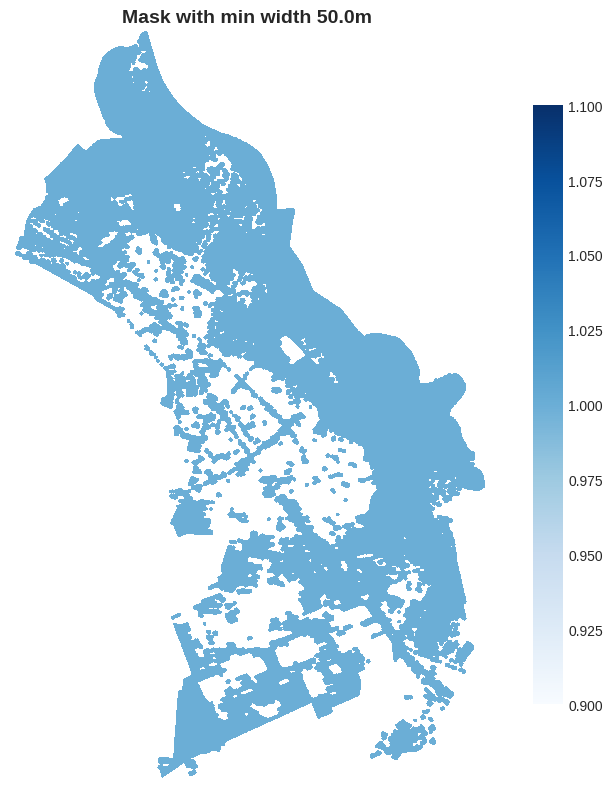


🔍 Filtering regions by approximate length >= 1000.0 m
   Number of regions found: 104
   Regions meeting ≥ 1000.0 m: 5
✓ Saved raster: output_res_4/dir_270/mask_filtered_by_length_270.tif


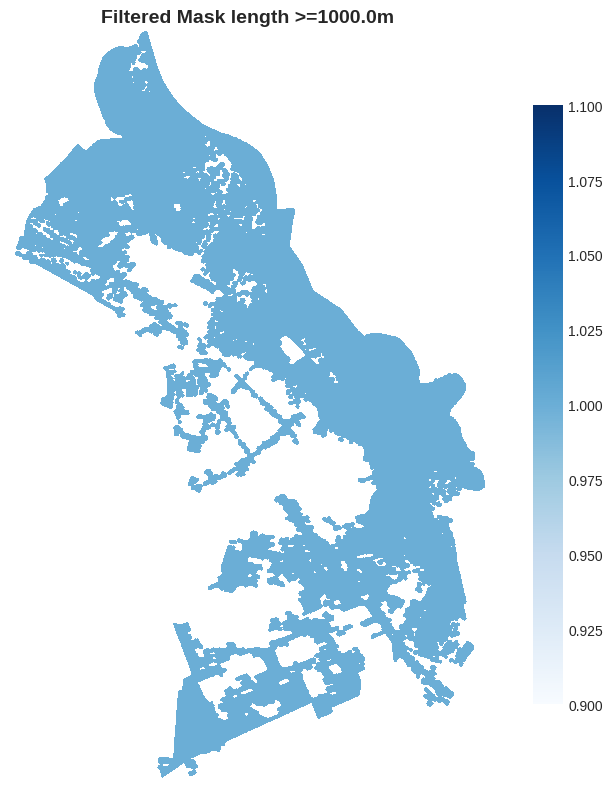


5️⃣  Creating skeleton from filtered mask...
   Skeleton pixels: 37004
✓ Saved raster: output_res_4/dir_270/skeleton_binary.tif


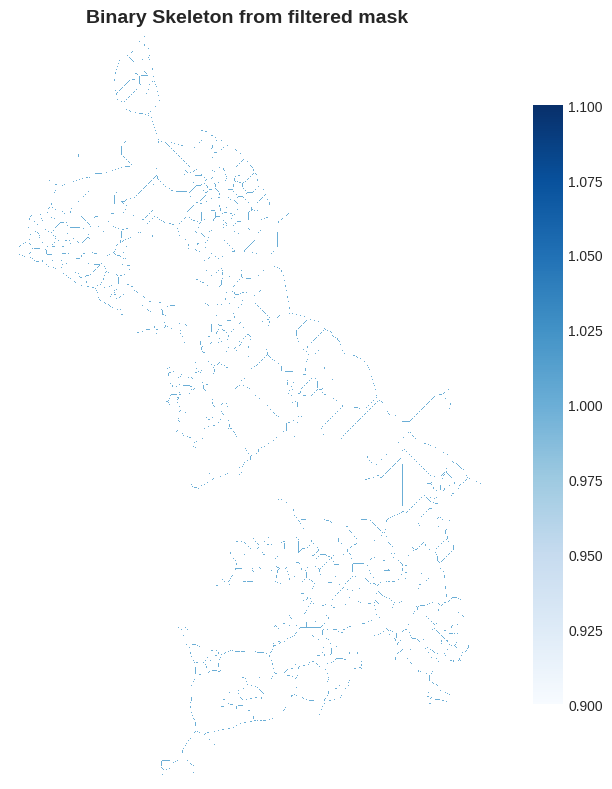


6️⃣  Creating skeleton with wind speeds...
✓ Saved raster: output_res_4/dir_270/skeleton_speed.tif


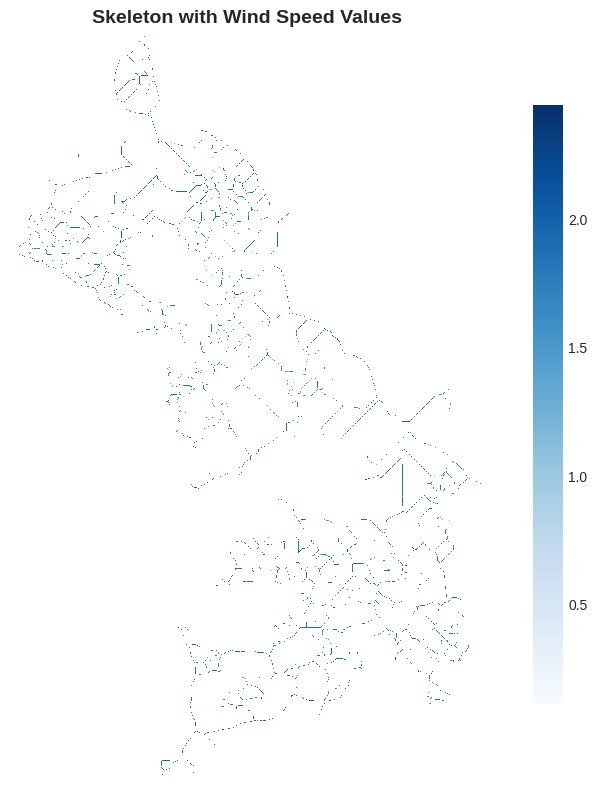


7️⃣  Processing wind direction...
✓ Saved raster: output_res_4/dir_270/skeleton_direction.tif


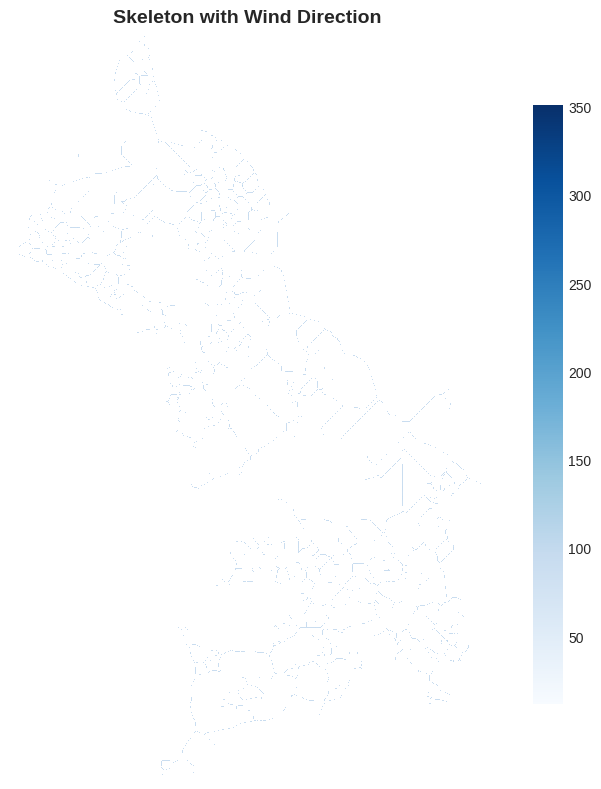


9️⃣  Analyzing Wind Corridors...
   Found 5 potential corridor regions
   Valid corridors meeting size criteria: 5

🏃‍♂️ Wind Corridor Analysis Results for direction 270°:
📏 Analysis Parameters:
   • Minimum length: 1000.0 m
   • Minimum width: 50.0 m
   • Wind speed threshold: 0.97 m/s
   • Pixel resolution: 4 m

📊 Results:
   • Total corridors identified: 5
   • Centerlines file: output_res_4/dir_270/wind_corridors_centerlines.gpkg
   • Polygons file: output_res_4/dir_270/wind_corridors_polygons.gpkg
   • Average corridor wind speed: 1.77 m/s
   • Total corridor area: 22.67 km²

✅ Wind corridor analysis complete for this direction!

🔄 Analysis for direction: 315°

1️⃣  Loading wind speed data...


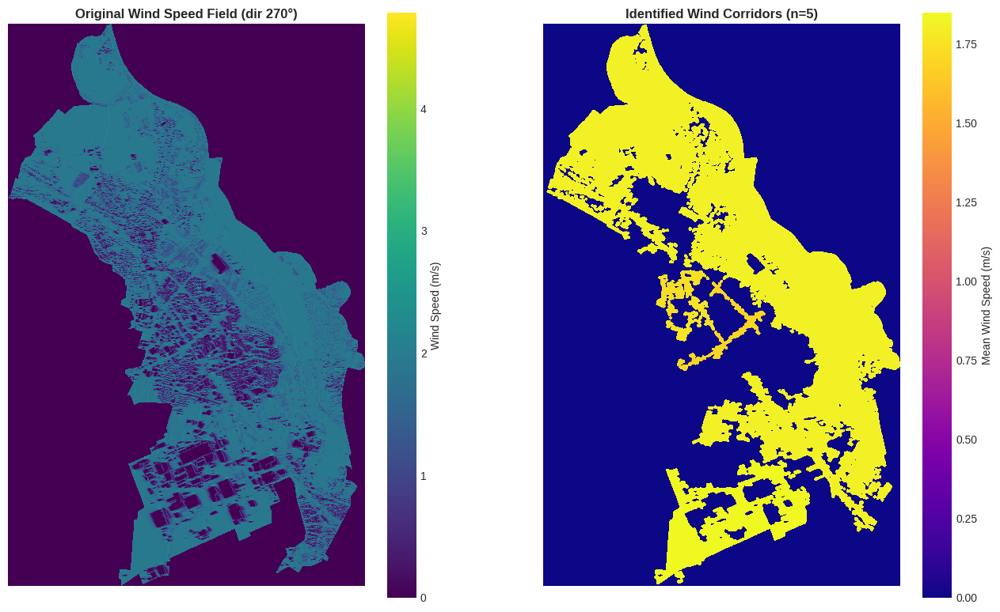

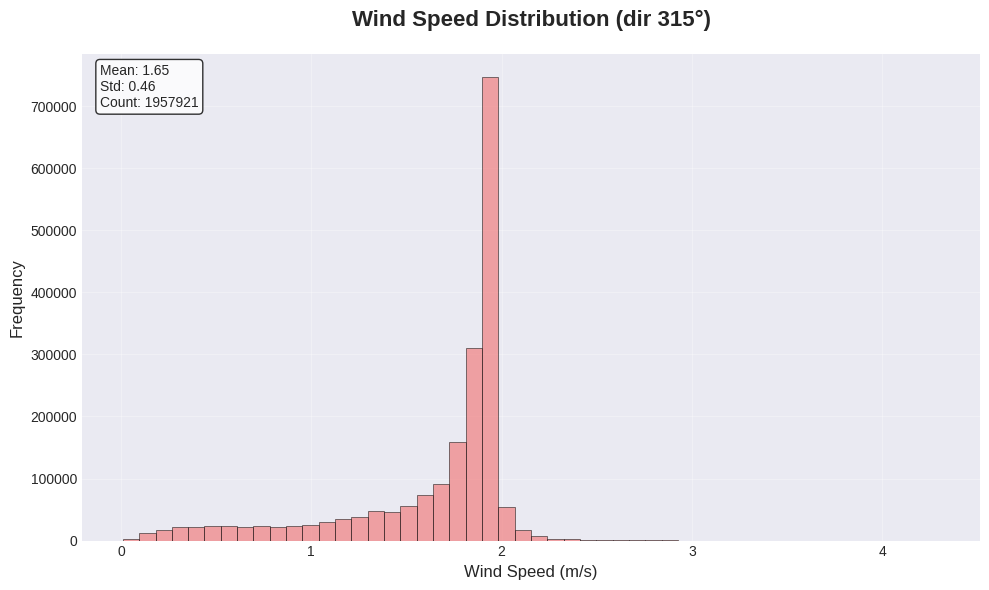


2️⃣  Creating threshold mask...
Angle: 315, Speed: 1.94
   Pixels above threshold: 1740558
✓ Saved raster: output_res_4/dir_315/mask_threshold.tif


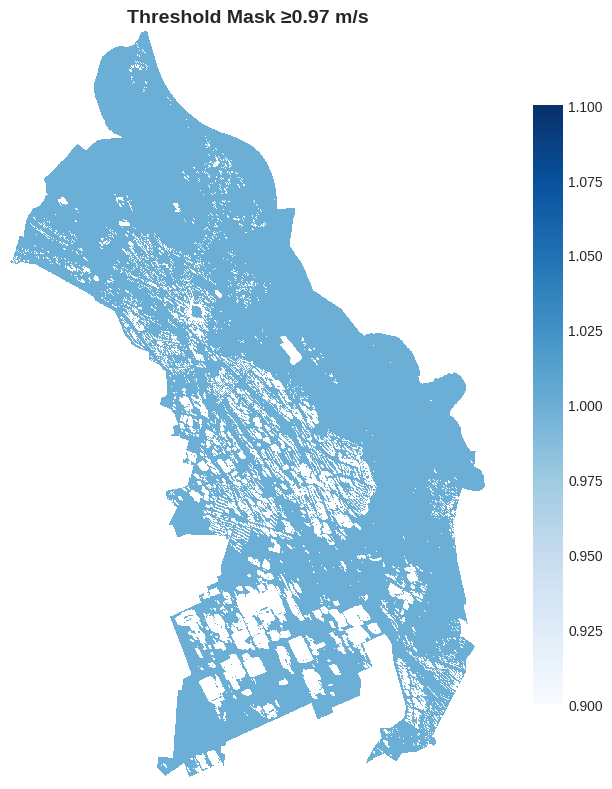


3️⃣  Cleaning mask...
✓ Saved raster: output_res_4/dir_315/mask_clean.tif


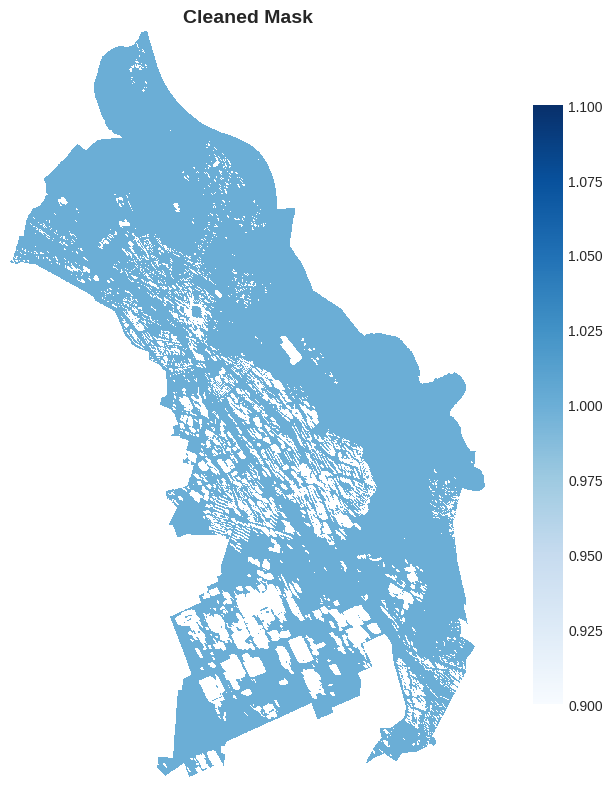


4️⃣  Eroding to minimum width (50.0m) and reconstructing...
   Pixels after erosion (surviving): 1168428
   Pixels after reconstruction: 1537684
✓ Saved raster: output_res_4/dir_315/mask_minwidth.tif


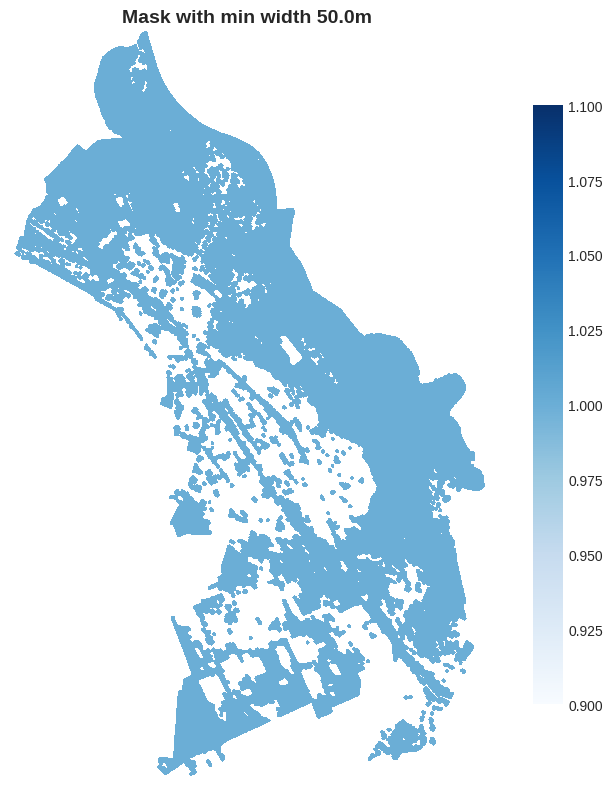


🔍 Filtering regions by approximate length >= 1000.0 m
   Number of regions found: 109
   Regions meeting ≥ 1000.0 m: 2
✓ Saved raster: output_res_4/dir_315/mask_filtered_by_length_315.tif


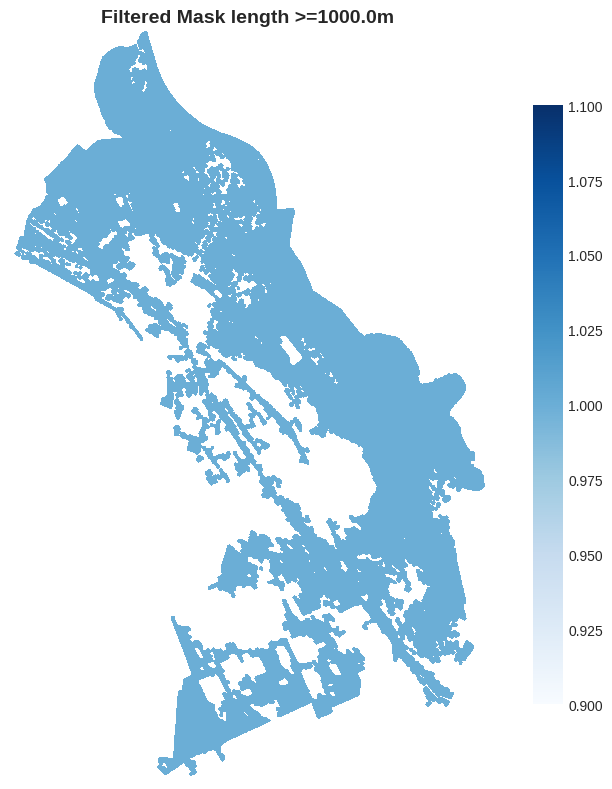


5️⃣  Creating skeleton from filtered mask...
   Skeleton pixels: 38318
✓ Saved raster: output_res_4/dir_315/skeleton_binary.tif


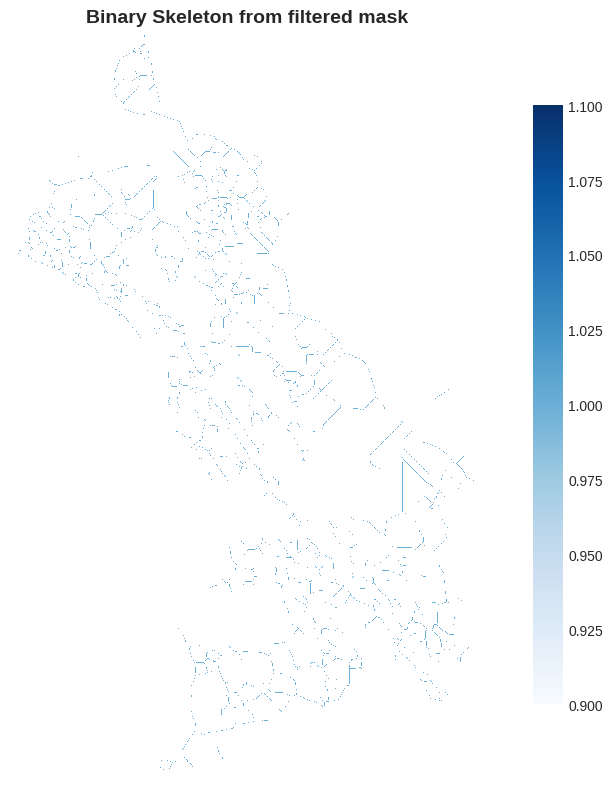


6️⃣  Creating skeleton with wind speeds...
✓ Saved raster: output_res_4/dir_315/skeleton_speed.tif


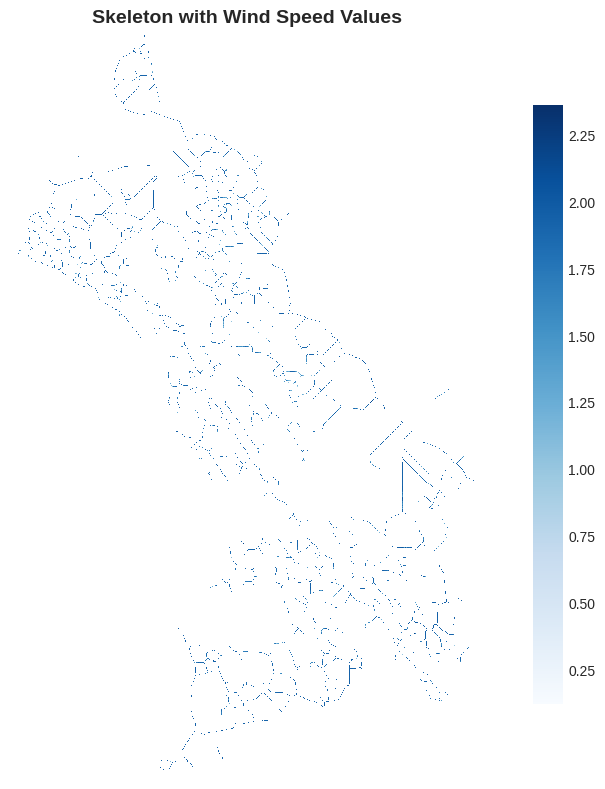


7️⃣  Processing wind direction...
✓ Saved raster: output_res_4/dir_315/skeleton_direction.tif


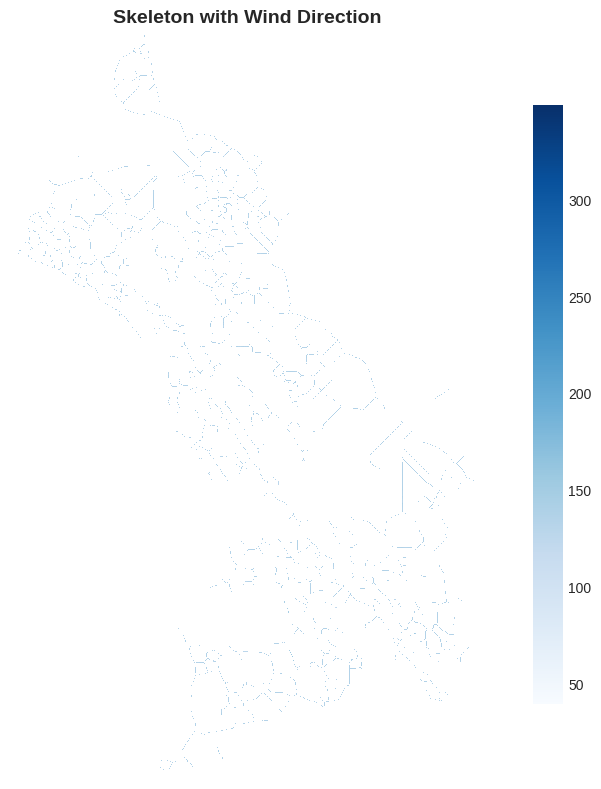


9️⃣  Analyzing Wind Corridors...
   Found 2 potential corridor regions
   Valid corridors meeting size criteria: 2

🏃‍♂️ Wind Corridor Analysis Results for direction 315°:
📏 Analysis Parameters:
   • Minimum length: 1000.0 m
   • Minimum width: 50.0 m
   • Wind speed threshold: 0.97 m/s
   • Pixel resolution: 4 m

📊 Results:
   • Total corridors identified: 2
   • Centerlines file: output_res_4/dir_315/wind_corridors_centerlines.gpkg
   • Polygons file: output_res_4/dir_315/wind_corridors_polygons.gpkg
   • Average corridor wind speed: 1.83 m/s
   • Total corridor area: 23.12 km²

✅ Wind corridor analysis complete for this direction!
✅ Zapisano all_directions_min_corridors (przed filtracją): /content/output_res_4/all_directions/all_directions_min_corridors.tif

🔍 Filtrowanie regionów wg przybliżonej długości >= 1000.0 m
   Znaleziono regionów: 52
   Regionów spełniających ≥ 1000.0 m: 4
✓ Saved raster: /content/output_res_4/all_directions/mask_filtered_by_length.tif


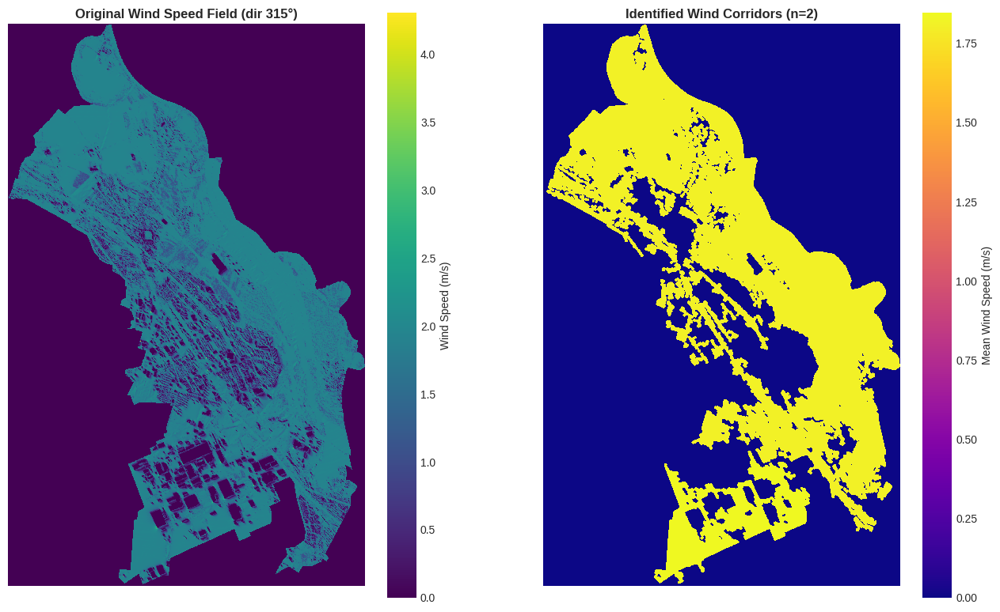

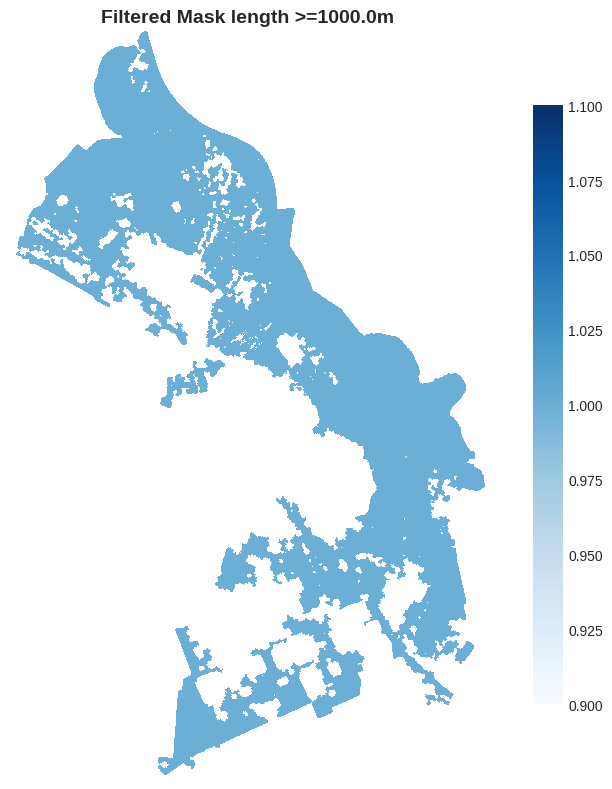

✅ Zapisano all_directions_min_corridors_filtered (po filtracji): /content/output_res_4/all_directions/all_directions_min_corridors_filtered.tif
✅ Zapisano all_directions_max_corridors: /content/output_res_4/all_directions/all_directions_max_corridors.tif
✅ Zapisano all_directions_frequency: /content/output_res_4/all_directions/all_directions_frequency.tif


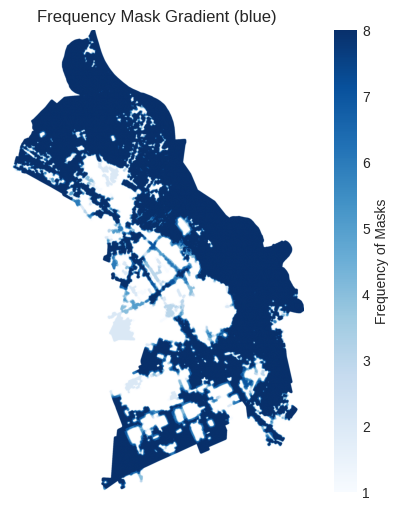

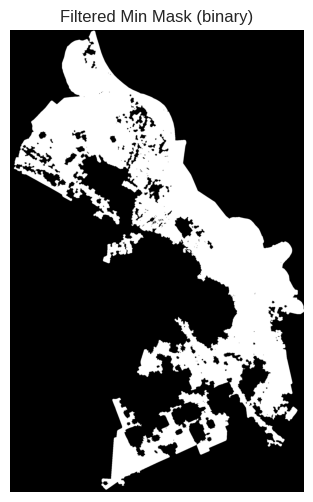

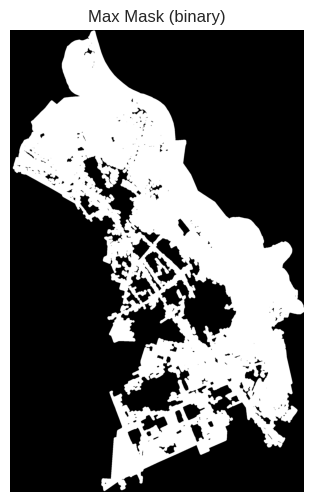

In [ ]:
# Main loop over wind directions
for dir_angle in directions:

    print("\n" + "=" * 60)
    print(f"🔄 Analysis for direction: {dir_angle}°")

    speed_raster_path = f'wind_speed/raster_res_{pixel_size}x6_dir_{dir_angle}_wind_speed_filled_cut.tif'
    dir_raster_path = f'wind_direction/raster_res_{pixel_size}x6_dir_{dir_angle}_wind_direction_filled_cut.tif'

    out_dir = os.path.join(base_out_dir, f'dir_{dir_angle}')
    os.makedirs(out_dir, exist_ok=True)

    # 1. Loading wind speed raster
    print("\n1️⃣  Loading wind speed data...")
    try:
        with rasterio.open(speed_raster_path) as src:
            wind = src.read(1).astype(float)
            transform = src.transform
            crs = src.crs
            profile = src.profile
            speed_nodata = src.nodata
    except FileNotFoundError:
        print(f"❌ Error: File not found: {speed_raster_path}")
        continue

    # Mask nodata values in wind speed
    if speed_nodata is not None:
        wind = np.where(wind == speed_nodata, np.nan, wind)
    else:
        wind = np.where(wind == 0, np.nan, wind)

    # Display histogram of wind speed values
    vals = wind.flatten()
    create_histogram(vals, f'Wind Speed Distribution (dir {dir_angle}°)', 'Wind Speed (m/s)', 'lightcoral')

    # 2. Creating threshold mask
    print("\n2️⃣  Creating threshold mask...")
    #Good corridors is when
    threshold = speed_near_ground * threshold_to_corridor
    print(f"Angle: {dir_angle}, Speed: {speed_near_ground}")
    mask = (wind >= threshold) & (~np.isnan(wind))
    print(f"   Pixels above threshold: {np.sum(mask)}")

    out_mask_path = os.path.join(out_dir, 'mask_threshold.tif')
    write_raster(mask.astype(np.uint8), out_mask_path, profile,
                 dtype=rasterio.uint8, nodata=0,
                 show=True, title=f'Threshold Mask ≥{threshold} m/s')

    # 3. Cleaning mask (opening and closing)
    print("\n3️⃣  Cleaning mask...")
    mask_clean = binary_opening(mask, footprint=disk(1))
    mask_clean = binary_closing(mask_clean, footprint=disk(1))

    out_clean_path = os.path.join(out_dir, 'mask_clean.tif')
    write_raster(mask_clean.astype(np.uint8), out_clean_path, profile,
                 dtype=rasterio.uint8, nodata=0,
                 show=True, title='Cleaned Mask')

    # 4. Erode to enforce minimum width and reconstruct
    print(f"\n4️⃣  Eroding to minimum width ({min_width_m}m) and reconstructing...")
    # Compute half-width in pixels
    half_width_px = int(np.ceil((min_width_m / 2) / pixel_size))
    if half_width_px < 1:
        print("   Warning: half-width in pixels < 1; skipping erosion/dilation")
        mask_minwidth = mask_clean.copy()
    else:
        # Erode to remove segments narrower than specified width
        eroded = binary_erosion(mask_clean, footprint=disk(half_width_px))
        print(f"   Pixels after erosion (surviving): {np.sum(eroded)}")
        # Reconstruct by dilating eroded core back to minimum width
        reconstructed = binary_dilation(eroded, footprint=disk(half_width_px))
        print(f"   Pixels after reconstruction: {np.sum(reconstructed)}")
        mask_minwidth = reconstructed

    out_minwidth_path = os.path.join(out_dir, 'mask_minwidth.tif')
    write_raster(mask_minwidth.astype(np.uint8), out_minwidth_path, profile,
                 dtype=rasterio.uint8, nodata=0,
                 show=True, title=f'Mask with min width {min_width_m}m')

    # 4.1 Filter regions by approximate length >= min_length_m
    print("\n🔍 Filtering regions by approximate length >= {:.1f} m".format(min_length_m))
    labeled, n_regions = ndimage.label(mask_minwidth, structure=structure8)
    print(f"   Number of regions found: {n_regions}")
    keep_labels = []
    for label_id in range(1, n_regions + 1):
        region_mask = (labeled == label_id)
        if np.sum(region_mask) < 2:
            continue
        b_coords = boundary_pixels(region_mask)
        if len(b_coords) < 2:
            continue
        cost_array = np.where(region_mask, 1.0, np.inf)
        start0 = tuple(b_coords[0])
        try:
            mcp0 = MCP(cost_array)
            cost0, _ = mcp0.find_costs([start0])
        except Exception:
            continue
        costs_b0 = cost0[tuple(b_coords.T)]
        idx_far = np.nanargmax(costs_b0)
        far1 = tuple(b_coords[idx_far])
        try:
            mcp1 = MCP(cost_array)
            cost1, _ = mcp1.find_costs([far1])
        except Exception:
            continue
        costs_b1 = cost1[tuple(b_coords.T)]
        max_cost = np.nanmax(costs_b1)
        length_m = max_cost * pixel_size
        if length_m >= min_length_m:
            keep_labels.append(label_id)
    print(f"   Regions meeting ≥ {min_length_m} m: {len(keep_labels)}")

    filtered_mask = np.isin(labeled, keep_labels)
    out_filtered_path = os.path.join(out_dir, f'mask_filtered_by_length_{dir_angle}.tif')
    write_raster(filtered_mask.astype(np.uint8), out_filtered_path, profile,
                 dtype=rasterio.uint8, nodata=0,
                 show=True, title=f'Filtered Mask length >={min_length_m}m')

    # 5. Skeletonization on filtered mask
    print("\n5️⃣  Creating skeleton from filtered mask...")
    skeleton = skeletonize(filtered_mask)
    print(f"   Skeleton pixels: {np.sum(skeleton)}")

    out_skel_bin = os.path.join(out_dir, 'skeleton_binary.tif')
    write_raster(skeleton.astype(np.uint8), out_skel_bin, profile,
                 dtype=rasterio.uint8, nodata=0,
                 show=True, title='Binary Skeleton from filtered mask')

    # 6. Skeleton with wind speed values
    print("\n6️⃣  Creating skeleton with wind speeds...")
    skeleton_speed = np.full(wind.shape, speed_nodata if speed_nodata else -9999, dtype=float)
    mask_skel = skeleton.astype(bool)
    skeleton_speed[mask_skel] = np.where(
        np.isnan(wind[mask_skel]),
        speed_nodata if speed_nodata else -9999,
        wind[mask_skel]
    )
    profile_float = profile.copy()
    profile_float.update(dtype=rasterio.float32, nodata=speed_nodata if speed_nodata else -9999)
    out_skel_speed = os.path.join(out_dir, 'skeleton_speed.tif')
    write_raster(skeleton_speed.astype(np.float32), out_skel_speed, profile_float,
                 dtype=rasterio.float32, nodata=speed_nodata if speed_nodata else -9999,
                 show=True, title='Skeleton with Wind Speed Values')

    # 7. Skeleton with wind direction values
    print("\n7️⃣  Processing wind direction...")
    wind_dir = None
    dir_nodata = None
    profile_dir = None
    if dir_raster_path and os.path.exists(dir_raster_path):
        try:
            with rasterio.open(dir_raster_path) as ds_dir:
                wind_dir = ds_dir.read(1).astype(float)
                dir_nodata = ds_dir.nodata
                profile_dir = ds_dir.profile.copy()
            # Mask nodata in wind direction
            if dir_nodata is not None:
                wind_dir = np.where(wind_dir == dir_nodata, np.nan, wind_dir)
            else:
                wind_dir = np.where(wind_dir == 0, np.nan, wind_dir)

            skeleton_dir = np.full(wind_dir.shape, dir_nodata if dir_nodata else -9999, dtype=float)
            skeleton_dir[mask_skel] = np.where(
                np.isnan(wind_dir[mask_skel]),
                dir_nodata if dir_nodata else -9999,
                wind_dir[mask_skel]
            )

            profile_dir.update(dtype=rasterio.float32, nodata=dir_nodata if dir_nodata else -9999)
            out_skel_dir = os.path.join(out_dir, 'skeleton_direction.tif')
            write_raster(skeleton_dir.astype(np.float32), out_skel_dir, profile_dir,
                         dtype=rasterio.float32, nodata=dir_nodata if dir_nodata else -9999,
                         show=True, title='Skeleton with Wind Direction')
        except FileNotFoundError:
            print(f"   No wind direction file found at {dir_raster_path}, skipping...")
            wind_dir = None
    else:
        print("   No wind direction file found, skipping...")

    # 9. Analyzing Wind Corridors
    print("\n9️⃣  Analyzing Wind Corridors...")
    wind_dir_for_analysis = None
    if dir_raster_path and os.path.exists(dir_raster_path):
        try:
            with rasterio.open(dir_raster_path) as ds_dir:
                arr = ds_dir.read(1).astype(float)
                dir_nodata = ds_dir.nodata
            if dir_nodata is not None:
                wind_dir_for_analysis = np.where(arr == dir_nodata, np.nan, arr)
            else:
                wind_dir_for_analysis = np.where(arr == 0, np.nan, arr)
        except FileNotFoundError:
            wind_dir_for_analysis = None

    lbl_corridors = sk_label(filtered_mask, connectivity=2)
    num_potential_corridors = lbl_corridors.max()
    print(f"   Found {num_potential_corridors} potential corridor regions")

    corridor_data = []
    valid_corridors = 0

    # Evaluate each region for corridor properties
    for region_id in range(1, num_potential_corridors + 1):
        region_mask = (lbl_corridors == region_id)
        properties = analyze_corridor_properties(
            region_mask, wind, wind_dir_for_analysis, transform, pixel_size
        )
        if properties is None:
            continue
        area_threshold = min_length_m * min_width_m
        if (properties['area_m2'] >= area_threshold and
                properties['pixel_count'] >= (min_length_m / pixel_size)):
            corridor_data.append({
                'region_id': region_id,
                'mask': region_mask,
                'properties': properties
            })
            valid_corridors += 1

    print(f"   Valid corridors meeting size criteria: {valid_corridors}")

    # Prepare output file paths and schemas
    out_corridor_lines = os.path.join(out_dir, 'wind_corridors_centerlines.gpkg')
    out_leastcost_lines = os.path.join(out_dir, 'wind_corridors_leastcost_lines.gpkg')
    out_corridor_polygons = os.path.join(out_dir, 'wind_corridors_polygons.gpkg')
    for fp in [out_corridor_lines, out_leastcost_lines, out_corridor_polygons]:
        if os.path.exists(fp):
            os.remove(fp)

    schema_lines = {
        'geometry': 'MultiLineString',
        'properties': {
            'corridor_id': 'int',
            'length_m': 'float',
            'area_m2': 'float',
            'mean_wind_speed': 'float',
            'max_wind_speed': 'float',
            'wind_speed_std': 'float',
            'wind_percentile_90': 'float',
            'mean_wind_direction': 'float',
            'direction_consistency': 'float',
        },
    }
    # Polygons schema updated to MultiPolygon
    schema_polygons = {
        'geometry': 'MultiPolygon',
        'properties': {
            'corridor_id': 'int',
            'length_m': 'float',
            'area_m2': 'float',
            'mean_wind_speed': 'float',
            'max_wind_speed': 'float',
        },
    }
    schema_least = {'geometry': 'LineString', 'properties': {'corridor_id': 'int', 'cost': 'float'},}

    # 10. Write centerlines with pruning and filtering by wind direction
    written_corridors = 0
    with fiona.open(out_corridor_lines, mode='w', driver='GPKG',
                    layer='wind_corridors', crs=crs, schema=schema_lines) as dst_lines:
        for corridor in corridor_data:
            region_id = corridor['region_id']
            properties = corridor['properties']
            skel_mask = skeleton & (lbl_corridors == region_id)
            if np.sum(skel_mask) < 2:
                continue
            G = skeleton_to_graph(skel_mask, transform, use_euclid=True, pixel_size=pixel_size)
            wind_dir_mean = properties.get('dir_stats', {}).get('mean', None)
            G = prune_terminal_branches_preserve_trunk(G, min_length_m=min_prune_length_m)
            if wind_dir_mean is not None and not np.isnan(wind_dir_mean):
                G = filter_edges_by_wind_direction(G, wind_dir_deg=wind_dir_mean, angle_tolerance_deg=angle_tol_deg)
            segments = []
            for (y1, x1), (y2, x2) in G.edges():
                coord1 = G.nodes[(y1, x1)]['coord']
                coord2 = G.nodes[(y2, x2)]['coord']
                segments.append(LineString([coord1, coord2]))
            if not segments:
                continue
            merged = ops.linemerge(segments)
            if isinstance(merged, LineString):
                multiline = MultiLineString([merged])
            elif isinstance(merged, MultiLineString):
                multiline = merged
            else:
                continue
            length_val = multiline.length
            if length_val < min_length_m:
                continue

            dst_lines.write({
                'geometry': mapping(multiline),
                'properties': {
                    'corridor_id': written_corridors + 1,
                    'length_m': float(length_val),
                    'area_m2': float(properties['area_m2']),
                    'mean_wind_speed': float(properties['wind_stats']['mean']),
                    'max_wind_speed': float(properties['wind_stats']['max']),
                    'wind_speed_std': float(properties['wind_stats']['std']),
                    'wind_percentile_90': float(properties['wind_stats']['percentile_90']),
                    'mean_wind_direction': float(properties['dir_stats']['mean']),
                    'direction_consistency': float(properties['dir_stats']['consistency']),
                }
            })
            written_corridors += 1

    # 11. Write least-cost paths (unchanged logic)
    with fiona.open(out_leastcost_lines, mode='w', driver='GPKG', layer='leastcost_paths', crs=crs, schema=schema_least) as dst_lc:
        for idx, corridor in enumerate(corridor_data, start=1):
            region_mask = corridor['mask']
            cost = np.full(wind.shape, np.inf, dtype=float)
            eps = 1e-3
            valid = region_mask & ~np.isnan(wind)
            cost[valid] = 1.0 / (wind[valid] + eps)
            eroded = binary_erosion(region_mask, footprint=disk(1))
            boundary = region_mask & ~eroded
            ys, xs = np.where(boundary)
            if len(ys) < 2:
                continue
            coords = np.column_stack((ys, xs))
            if len(coords) > 500:
                idxs = np.random.choice(len(coords), size=500, replace=False)
                coords_sample = coords[idxs]
            else:
                coords_sample = coords
            diffs = coords_sample[:, None, :] - coords_sample[None, :, :]
            dists2 = np.sum(diffs**2, axis=2)
            i_max, j_max = np.unravel_index(np.argmax(dists2), dists2.shape)
            start = tuple(coords_sample[i_max])
            end = tuple(coords_sample[j_max])
            try:
                mcp = MCP_Geometric(cost)
                costs_arr, tb = mcp.find_costs([start])
                if np.isinf(costs_arr[end]):
                    continue
                path_rc = []
                r, c = end
                offsets = np.array(mcp.offsets)
                while True:
                    path_rc.append((r, c))
                    idx_offset = tb[r, c]
                    if idx_offset < 0:
                        break
                    dy, dx = offsets[idx_offset]
                    r_prev = r - dy; c_prev = c - dx
                    r, c = r_prev, c_prev
                path_rc.reverse()
            except Exception as e:
                print(f"    ⚠️ MCP error for corridor {idx}: {e}")
                continue
            path_coords = [rasterio.transform.xy(transform, y, x) for y, x in path_rc]
            line = LineString(path_coords)
            total_cost = float(costs_arr[end])
            dst_lc.write({
                'geometry': mapping(line),
                'properties': {
                    'corridor_id': idx,
                    'cost': total_cost
                }
            })

    # 12. Write corridor polygons as MultiPolygon
    with fiona.open(out_corridor_polygons, mode='w', driver='GPKG',
                    layer='wind_corridors', crs=crs, schema=schema_polygons) as dst_polygons:
        corridor_id = 1
        for corridor in corridor_data:
            region_id = corridor['region_id']
            properties = corridor['properties']
            skel_mask = skeleton & (lbl_corridors == region_id)
            if np.sum(skel_mask) < 2:
                continue
            G = skeleton_to_graph(skel_mask, transform, use_euclid=True, pixel_size=pixel_size)
            wind_dir_mean = properties.get('dir_stats', {}).get('mean', None)
            G = prune_terminal_branches_preserve_trunk(G, min_length_m=min_prune_length_m)
            if wind_dir_mean is not None and not np.isnan(wind_dir_mean):
                G = filter_edges_by_wind_direction(G, wind_dir_deg=wind_dir_mean, angle_tolerance_deg=angle_tol_deg)
            segments = []
            for (y1, x1), (y2, x2) in G.edges():
                coord1 = G.nodes[(y1, x1)]['coord']
                coord2 = G.nodes[(y2, x2)]['coord']
                segments.append(LineString([coord1, coord2]))
            if not segments:
                continue
            merged = ops.linemerge(segments)
            if isinstance(merged, LineString):
                multiline = MultiLineString([merged])
            elif isinstance(merged, MultiLineString):
                multiline = merged
            else:
                continue
            length_val = multiline.length
            if length_val < min_length_m:
                continue
            buffer_geom = create_corridor_buffer(multiline, min_width_m / 2)
            # Ensure result is MultiPolygon
            if isinstance(buffer_geom, Polygon):
                buffer_geom = MultiPolygon([buffer_geom])
            elif isinstance(buffer_geom, MultiPolygon):
                pass
            else:
                # Unexpected type: skip
                continue
            dst_polygons.write({
                'geometry': mapping(buffer_geom),
                'properties': {
                    'corridor_id': corridor_id,
                    'length_m': float(length_val),
                    'area_m2': float(properties['area_m2']),
                    'mean_wind_speed': float(properties['wind_stats']['mean']),
                    'max_wind_speed': float(properties['wind_stats']['max']),
                }
            })
            corridor_id += 1

    # 13. Visual summary plots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 12))
    wind_display = np.where(np.isnan(wind), 0, wind)
    im1 = ax1.imshow(wind_display, cmap='viridis', interpolation='nearest')
    ax1.set_title(f'Original Wind Speed Field (dir {dir_angle}°)', fontweight='bold')
    ax1.axis('off')
    plt.colorbar(im1, ax=ax1, shrink=0.8, label='Wind Speed (m/s)')

    corridor_display = np.zeros_like(wind)
    for corridor in corridor_data:
        corridor_display[corridor['mask']] = corridor['properties']['wind_stats']['mean']
    im2 = ax2.imshow(corridor_display, cmap='plasma', interpolation='nearest')
    ax2.set_title(f'Identified Wind Corridors (n={written_corridors})', fontweight='bold')
    ax2.axis('off')
    plt.colorbar(im2, ax=ax2, shrink=0.8, label='Mean Wind Speed (m/s)')

    # 15. Console summary details
    print(f"\n🏃‍♂️ Wind Corridor Analysis Results for direction {dir_angle}°:")
    print("=" * 50)
    print(f"📏 Analysis Parameters:")
    print(f"   • Minimum length: {min_length_m} m")
    print(f"   • Minimum width: {min_width_m} m")
    print(f"   • Wind speed threshold: {threshold} m/s")
    print(f"   • Pixel resolution: {pixel_size} m")

    print(f"\n📊 Results:")
    print(f"   • Total corridors identified: {written_corridors}")
    print(f"   • Centerlines file: {out_corridor_lines}")
    print(f"   • Polygons file: {out_corridor_polygons}")

    if corridor_data:
        avg_wind_speed = np.mean([c['properties']['wind_stats']['mean'] for c in corridor_data])
        total_area_km2 = sum(c['properties']['area_m2'] for c in corridor_data) / 1e6
        print(f"   • Average corridor wind speed: {avg_wind_speed:.2f} m/s")
        print(f"   • Total corridor area: {total_area_km2:.2f} km²")

    print("\n✅ Wind corridor analysis complete for this direction!")
    print("=" * 50)

# 16. Generate combined mask across all directions
# output_min: intersection mask where corridor exists in all directions
# output_min_filtered: same intersection, additionally filtered by min length 1000 m
# output_max_filename: union mask where corridor exists in at least one direction
multiply_and_combine_masks(
    base_path=f"/content/output_res_{pixel_size}",
    directions=directions,
    mask_name="mask_filtered_by_length.tif",
    output_folder="all_directions",
    output_min_filename="all_directions_min_corridors.tif",
    output_max_filename="all_directions_max_corridors.tif",
    output_freq_filename="all_directions_frequency.tif",
    pixel_size=pixel_size,
    min_length_m=min_length_m,
    boundary_pixels=boundary_pixels,
    write_raster=write_raster
)

# Streamlines by Navier

123
0.009925435706583574
4.565973208591305
mask.shape: (337, 214)
Vxd.shape: (539, 342) Vyd.shape: (539, 342) Vd.shape: (539, 342)
[i] Uwaga: mask.shape nie jest dokładnie wielokrotnością Vxd.shape. Upewnij się, że to zachodzi lub dostosuj ręcznie.
[i] Faktor Y: 0, Faktor X: 0


ZeroDivisionError: division by zero

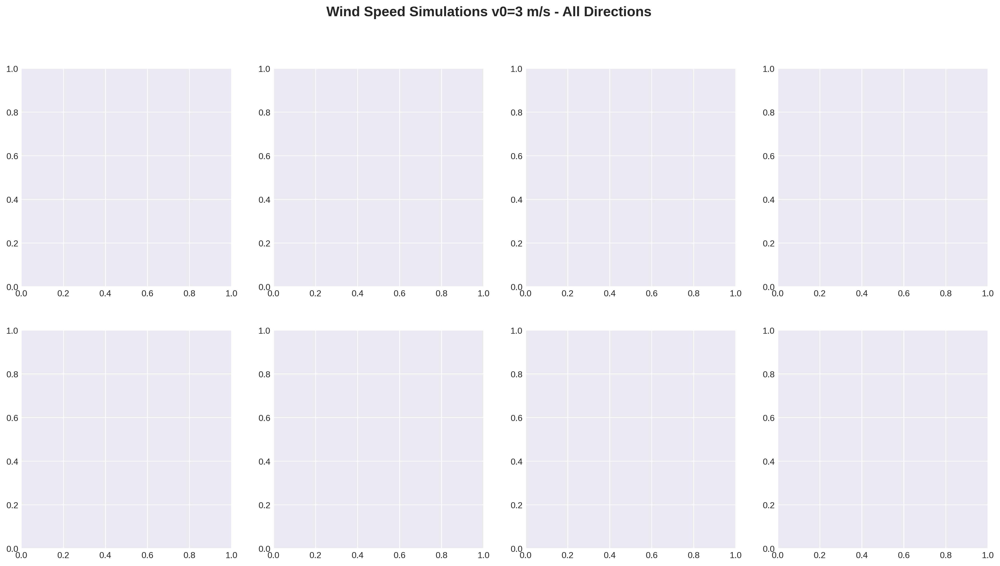

In [ ]:
# === PARAMETRY GLOBALNE ===
dx = 10
dy = 10
dt = 0.0001
dxd = 10
dyd = 10
p0 = 101300
rho = 1.247
nu = 15.6e-6
g = 1
target_epsg = 3007
directions = [0,45,90,135,180,225,270,315]
v0 = 3

# === PREPARE SUBPLOT FIGURE ===
plt.close('all')
fig_all, axes_all = plt.subplots(2, 4, figsize=(20, 10), dpi=300)
fig_all.patch.set_facecolor('white')
axes_all = axes_all.flatten()
fig_all.suptitle(f"Wind Speed Simulations v0={round(v0,1)} m/s - All Directions",
                 fontsize=16, fontweight='bold')

# === Kolor i norma (z kodu 1) ===
bounds = [0.01, 0.97, 1.5, 1.9, 3.5]
# qgis_colors = [
#     (43/255, 131/255, 186/255, 1),   # niebieski
#     (167/255, 216/255, 168/255, 1),  # zielony
#     (241/255, 236/255, 171/255, 1),  # żółtawy
#     (250/255, 168/255, 99/255, 1),   # pomarańczowy
#     (215/255, 25/255, 28/255, 1),    # czerwony
# ]
qgis_colors = [
    (247/255, 251/255, 255/255, 1),  # (0.9686, 0.9843, 1.0) jasny niebieski
    (199/255, 220/255, 239/255, 1),  # (0.7804, 0.8627, 0.9373) jasny błękit
    (144/255, 194/255, 222/255, 1),  # (0.5647, 0.7608, 0.8706) średni niebieski
    (100/255, 169/255, 211/255, 1),  # (0.3922, 0.6627, 0.8275) ciemniejszy niebieski
    (8/255, 48/255, 107/255, 1),     # (0.0314, 0.1882, 0.4196) granatowy
]
from matplotlib.colors import ListedColormap, BoundaryNorm
cmap = ListedColormap(qgis_colors)
norm = BoundaryNorm(bounds, ncolors=len(qgis_colors))

# === PĘTLA PO KIERUNKACH ===
for idx, dir_angle in enumerate(directions):
    raster_path = f"output_res_{pixel_size}/dir_{dir_angle}/mask_filtered_by_length_{dir_angle}.tif"
    output_dir = f"navier_output/sim_outputs_{dir_angle}"
    os.makedirs(output_dir, exist_ok=True)

    # === WCZYTANIE I PRZETWORZENIE MASKI ===
    with rasterio.open(raster_path) as src:
        src_epsg = src.crs.to_epsg() if src.crs else None
        if src_epsg != target_epsg:
            transform, width, height = calculate_default_transform(
                src.crs, f"EPSG:{target_epsg}", src.width, src.height, *src.bounds
            )
            dtype = src.dtypes[0]
            mask_reproj = np.empty((height, width), dtype=dtype)
            reproject(
                source=rasterio.band(src, 1),
                destination=mask_reproj,
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=f"EPSG:{target_epsg}",
                resampling=Resampling.nearest
            )
            mask = mask_reproj
            transform_used = transform
        else:
            mask = src.read(1)
            transform_used = src.transform

    angle_rad = np.radians(dir_angle)

    S_bin = np.where(mask == 0, 0, 1).astype(np.uint8)
    h, w = mask.shape
    minx, miny, maxx, maxy = array_bounds(h, w, transform_used)
    lx = maxx - minx
    ly = maxy - miny
    sx = int(lx // dx)
    sy = int(ly // dy)
    sxd = int(lx // dxd)
    syd = int(ly // dyd)

    # === RESAMPLING ===
    width_new = int(np.ceil((maxx - minx) / dxd))
    height_new = int(np.ceil((maxy - miny) / dyd))
    transform_new = Affine(dxd, 0, minx, 0, -dyd, maxy)

    mask_resampled = np.empty((height_new, width_new), dtype=S_bin.dtype)
    reproject(
        source=S_bin,
        destination=mask_resampled,
        src_transform=transform_used,
        src_crs=f"EPSG:{target_epsg}",
        dst_transform=transform_new,
        dst_crs=f"EPSG:{target_epsg}",
        resampling=Resampling.nearest
    )
    S = cv2.resize(mask_resampled, (sxd, syd), interpolation=cv2.INTER_NEAREST)
    Sfilter = cv2.resize(S, (sx, sy))

    # # === WIZUALIZACJA FINALNEJ MASKI DO SYMULACJI ===
    # fig, ax = plt.subplots(figsize=(11, 7), dpi=100)
    # ax.imshow(S, origin='upper', cmap='gray')
    # ax.set_title(f"Maska po resamplingu do siatki w kierunku {dir_angle}")
    # #plt.show()

    # === INICJALIZACJA SIATKI I PÓL ===
    X = np.linspace(0, lx, sx)
    Y = np.linspace(0, ly, sy)

    Vx = v0 * -np.sin(angle_rad) * np.ones((sy, sx))
    Vy = v0 * np.cos(angle_rad) * np.ones((sy, sx))

    p = np.ones((sy, sx)) * p0

    Xd_vis, Yd_vis, Vxd_vis, Vyd_vis = Subset(X / dxd, Y / dyd, Vx, Vy, s=4)

    # === PĘTLA SYMULACJI PRĄDU ===
    udiff = 1
    stepcount = 0
    while True:
        VxnI = Vx.copy()
        VynI = Vy.copy()
        pn = p.copy()

        # średnie sąsiedztwo
        Vxn = VxnI.copy()
        Vyn = VynI.copy()
        Vxn[1:-1,1:-1] = (VxnI[:-2,1:-1] + VxnI[2:,1:-1] + VxnI[1:-1,2:] + VxnI[1:-1,:-2]) / 4
        Vyn[1:-1,1:-1] = (VynI[:-2,1:-1] + VynI[2:,1:-1] + VynI[1:-1,2:] + VynI[1:-1,:-2]) / 4

        pn = Calcul_Pression(pn, Vxn, Vyn, dt, dx, dy)
        LapX, LapY = Laplacien(Vxn, Vyn, dx, dy)

        # pochodne w środku
        dVxn_dx = (Vxn[1:-1,2:] - Vxn[1:-1,:-2]) / (2*dx)
        dVyn_dy = (Vyn[2:,1:-1] - Vyn[:-2,1:-1]) / (2*dy)
        dVxn_dy = (Vxn[2:,1:-1] - Vxn[:-2,1:-1]) / (2*dy)
        dVyn_dx = (Vyn[1:-1,2:] - Vyn[1:-1,:-2]) / (2*dx)
        dp_dx = (pn[1:-1,2:] - pn[1:-1,:-2]) / (2*dx)
        dp_dy = (pn[2:,1:-1] - pn[:-2,1:-1]) / (2*dy)

        # aktualizacja Vx w środku
        Vx[1:-1,1:-1] = (
            Vxn[1:-1,1:-1] + dt * (
                nu * LapX
                - Vxn[1:-1,1:-1] * dVxn_dx
                - Vyn[1:-1,1:-1] * dVxn_dy
                - (1/rho) * dp_dx
            )
        )
        # brzeg x w kolumnie -1
        Vx[1:-1,-1] = (
            Vxn[1:-1,-1] + dt * (
                nu * ((Vx[:-2,-1] - 2*Vx[1:-1,-1] + Vx[2:,-1]) / (dy**2))
                - 0
                - Vyn[1:-1,0] * (Vxn[2:,-1] - Vxn[:-2,-1]) / (2*dy)
                - (1/rho) * 0
            )
        )
        # aktualizacja Vy w środku
        Vy[1:-1,1:-1] = (
            Vyn[1:-1,1:-1] + dt * (
                nu * LapY
                - Vxn[1:-1,1:-1] * dVyn_dx
                - Vyn[1:-1,1:-1] * dVyn_dy
                - (1/rho) * dp_dy
                - rho * g
            )
        )
        # brzeg y w kolumnie -1
        Vy[1:-1,-1] = (
            Vyn[1:-1,-1] + dt * (
                nu * ((Vy[:-2,-1] - 2*Vy[1:-1,-1] + Vy[2:, -1]) / (dy**2))
                - 0
                - Vyn[1:-1,0] * (Vyn[2:,-1] - Vyn[:-2,-1]) / (2*dy)
                - (1/rho) * (pn[2:,-1] - pn[:-2,-1]) / (2*dy)
                - rho * g
            )
        )

        # warunki ograniczające
        p = LimitePression(Sfilter, pn, dx, dy)
        p = Limite(Sfilter, p)
        Vx = Limite(Sfilter, Vx)
        Vy = Limite(Sfilter, Vy)
        Vx = np.nan_to_num(Vx)
        VxnI = np.nan_to_num(VxnI)

        clear_output(wait=True)
        udiff = abs((np.sum(Vx) - np.sum(VxnI)) / np.sum(Vx))
        clear_output(wait=True)
        print(stepcount)
        print(udiff)

        if udiff < 0.01:
            break
        stepcount += 1

    # === VISUALIZATION AND EXPORT FOR INDIVIDUAL PLOTS ===
    V = np.sqrt(Vx**2 + Vy**2)
    norm_vis = matplotlib.colors.Normalize(vmin=0, vmax=10)
    sm = cm.ScalarMappable(norm=norm_vis)

    st = 2
    stream = True

    Xd_plot, Yd_plot, Vxd_plot, Vyd_plot, Vd_plot = Subset(X, Y, Vx, Vy, V, s=st)
    print(Vd_plot.max())

    if stream:
        col = Vd_plot
        lw = 3 * col / col.max()

        #eksport_punktow
        Vxd = Vxd_plot
        Vyd = Vyd_plot
        Vd = Vd_plot

        # === EKSPORT DLA PRZYPADKU Vxd.shape = (672,426), mask.shape = (1344,853) ===
        if 'Vxd' not in globals() or 'Vyd' not in globals() or 'Vd' not in globals():
            raise RuntimeError("Brakuje tablic Vxd, Vyd, Vd – wczytaj/oblicz je przed dalszym krokiem.")

        # Sprawdź kształty
        print("mask.shape:", mask.shape)
        print("Vxd.shape:", Vxd.shape, "Vyd.shape:", Vyd.shape, "Vd.shape:", Vd.shape)

        # 1. Wyznacz czynniki downsamplingu
        factor_y = mask.shape[0] // Vxd.shape[0]
        factor_x = mask.shape[1] // Vxd.shape[1]
        if mask.shape[0] % Vxd.shape[0] != 0 or mask.shape[1] % Vxd.shape[1] != 0:
            print("[i] Uwaga: mask.shape nie jest dokładnie wielokrotnością Vxd.shape. Upewnij się, że to zachodzi lub dostosuj ręcznie.")
        print(f"[i] Faktor Y: {factor_y}, Faktor X: {factor_x}")

        # 2. Zbuduj indeksy w oryginalnej maskie
        rows = np.arange(0, mask.shape[0], factor_y)[:Vxd.shape[0]]
        cols = np.arange(0, mask.shape[1], factor_x)[:Vxd.shape[1]]
        RR, CC = np.meshgrid(rows, cols, indexing='ij')  # shape == Vxd.shape

        # 3. Przekształcenie na współrzędne geograficzne
        xs, ys = xy(transform_used, RR, CC, offset='center')
        x_flat = np.array(xs).flatten()
        y_flat = np.array(ys).flatten()
        vx_flat = Vxd.flatten()
        vy_flat = Vyd.flatten()
        v_flat  = Vd.flatten()

        # 4. Filtrowanie po masce
        mask_sub = mask[RR, CC].flatten()
        valid = mask_sub == 1
        x_flat = x_flat[valid]
        y_flat = y_flat[valid]
        vx_flat = vx_flat[valid]
        vy_flat = vy_flat[valid]
        v_flat  = v_flat[valid]

        # 5. Oblicz kierunek i twórz GeoDataFrame
        direction = (270 - np.degrees(np.arctan2(vy_flat, vx_flat))) % 360
        df = pd.DataFrame({
            'Vx': vx_flat,
            'Vy': vy_flat,
            'Speed': v_flat,
            'Direction': direction
        })
        geometry = [Point(x, y) for x, y in zip(x_flat, y_flat)]
        gdf = gpd.GeoDataFrame(df, geometry=geometry, crs=f"EPSG:{target_epsg}")
        gdf.to_file(os.path.join(output_dir, f"wind_{dir_angle}.gpkg"), layer="wind_points", driver="GPKG")
        print(f"Zapisano wind_vectors_wind_{dir_angle}.gpkg")

        # === INDYWIDUALNY PLOT (ORIGINAL) ===
        fig, ax_orig = plt.subplots(figsize=(11, 8), dpi=100)
        ax_orig.set_title(f"Wind Speed {round(v0,1)} m/s - Direction {dir_angle}°", fontsize=14)

        if stream:
            col = Vd_plot
            lw = 3 * col / col.max()
            # ZASTĄPIENIE mapy kolorów i normy
            stream_plot = ax_orig.streamplot(
                Xd_plot/dxd, Yd_plot/dyd, Vxd_plot, Vyd_plot,
                color=col,
                linewidth=lw,
                density=[10,1], arrowsize=0.4,
                cmap=cmap,      # standaryzowana mapa kolorów
                norm=norm       # ta sama norma co w subplotach
            )
            cbar_orig = plt.colorbar(stream_plot.lines, ax=ax_orig,
                                     shrink=0.8, pad=0.02, ticks=bounds)
            cbar_orig.set_label('Wind speed [m/s]', fontsize=10)

            # Export streamlines directly from this plot
            gdf_stream = export_streamlines_from_plot(
                stream_plot=stream_plot,
                transform_used=transform_used,
                mask_shape=mask.shape,
                dxd=dxd,
                dyd=dyd,
                crs=f"EPSG:{target_epsg}",
                filepath=os.path.join(output_dir, f"streamlines_{dir_angle}.gpkg"),
            )

            stream_plot = ax_orig.streamplot(
                Xd_plot/dxd, Yd_plot/dyd, Vxd_plot, Vyd_plot,
                color=col,
                linewidth=lw,
                density=[10,1], arrowsize=0.4,
                cmap=cmap,      # standaryzowana mapa kolorów
                norm=norm       # ta sama norma co w subplotach
            )

            gdf_stream = export_streamlines_from_plot(
                stream_plot=stream_plot,
                transform_used=transform_used,
                mask_shape=mask.shape,
                dxd=dxd, dyd=dyd,
                crs=f"EPSG:{target_epsg}",
                filepath=os.path.join(output_dir, f"streamlines_{dir_angle}.gpkg"),
            )

            # --- 2. Otwieramy odpowiadający raster prędkości ---
            raster_path = f"/content/wind_speed/raster_res_4x6_dir_{dir_angle}_wind_speed_filled_cut.tif"
            with rasterio.open(raster_path) as src:
                band1 = src.read(1)            # 2D numpy array z prędkością
                inv_transform = ~src.transform  # affine inverse

                # --- 3. Wyliczamy prędkości w środkach linii z rastra ---
                speeds = []
                for geom in gdf_stream.geometry:
                    if isinstance(geom, LineString):
                        # punkt środkowy w układzie współrzędnych
                        midpoint = geom.interpolate(0.5, normalized=True)
                        x_mid, y_mid = midpoint.x, midpoint.y

                        # r, c = wiersz, kolumna w rastrze
                        col, row = inv_transform * (x_mid, y_mid)
                        # zaokrąglamy do najbliższej komórki
                        row_i, col_i = int(round(row)), int(round(col))

                        # jeżeli punkt poza rasterem → NaN
                        if (0 <= row_i < band1.shape[0]) and (0 <= col_i < band1.shape[1]):
                            v = band1[row_i, col_i]
                        else:
                            v = np.nan

                        speeds.append(v)
                    else:
                        speeds.append(np.nan)

            # --- 4. Doklejamy kolumnę i zapisujemy warstwę ---
            gdf_stream['speed_m_s'] = speeds
            out_fp = os.path.join(output_dir, f"streamlines_{dir_angle}.gpkg")
            gdf_stream.to_file(out_fp, layer="streamlines", driver="GPKG")
            print(f"Zapisano {out_fp} z kolumną speed_m_s")

        else:
            ax_orig.quiver(
                Xd_plot/dxd, Yd_plot/dyd, Vxd_plot, Vyd_plot, Vd_plot,
                angles='xy', pivot='mid', alpha=0.5, scale=50
            )
            sm = cm.ScalarMappable(norm=Normalize(0, np.max(Vd_plot)), cmap=cmap)
            plt.colorbar(sm, ax=ax_orig, shrink=0.8, pad=0.02, ticks=bounds)

        ax_orig.imshow(Sfilter, origin='upper', cmap='gray', alpha=0.7)
        ax_orig.set_xticks([]); ax_orig.set_yticks([])
        ax_orig.set_aspect('equal')
        plt.tight_layout()
        plt.show()

        # Save individual plot
        fig.savefig(os.path.join(output_dir, f"streamlines_plot_{dir_angle}.png"), dpi=300, bbox_inches='tight')

    # === DODANIE DO SUBPLOTU ===
    ax = axes_all[idx]
    ax.set_facecolor('white')  # <<< DODAJ: tło każdego subplotu
    ax.set_title(f"Direction {dir_angle}°", fontsize=12)  # <<< USTAW: fontsize zgodny z kodem 1

    col = Vd_plot
    lw = 3 * col / col.max()
    stream_plot_sub = ax.streamplot(
        Xd_plot/dxd, Yd_plot/dyd, Vxd_plot, Vyd_plot,
        color=col,
        linewidth=lw,
        density=[5, 0.5],  # <<< ZACHOWAJ gęstość
        arrowsize=0.3,
        cmap=cmap,  # <<< UŻYJ: standaryzowanej mapy kolorów
        norm=norm  # <<< UŻYJ: tej samej normy
    )
    # === DODAJ COLORBAR ===
    cbar = plt.colorbar(stream_plot_sub.lines, ax=ax,
                        shrink=0.8, pad=0.02, ticks=bounds)  # <<< USTAW: ticki = bounds
    cbar.set_label('Wind speed [m/s]', fontsize=10)  # <<< USTAW: etykieta i fontsize

    ax.imshow(Sfilter, origin='upper', cmap='gray', alpha=0.7)  # <<< USTAW: alpha overlay
    ax.set_aspect('equal')  # <<< ZACHOWAJ: równy aspekt
    ax.set_xticks([])  # <<< USUŃ: osie
    ax.set_yticks([])


# === WYŚWIETL I ZAPISZ ===
plt.tight_layout()  # <<< UPEWNIJ SIĘ: tight_layout
plt.show()
fig_all.savefig("wind_simulation_all_directions_standardized.png",
                 dpi=300, bbox_inches='tight')  # <<< ZAPISZ: dpi=300, bbox_inches='tight'
print("Zapisano wind_simulation_all_directions_standardized.png")


## Wyznaczenie streamlines na wszystkich

In [ ]:
##############################
#Dla wszystkich korytarzy
##############################
# === PARAMETRY GLOBALNE ===
dx = 10
dy = 10
dt = 0.0001
dxd = 10
dyd = 10
p0 = 101300
rho = 1.247
nu = 15.6e-6
g = 1
target_epsg = 3007

#mean direction
directions = [315]
v0 = 3

# === Kolor i norma (z kodu 1) ===
bounds = [0.01, 0.97, 1.5, 1.9, 3.5]
qgis_colors = [
    (43/255, 131/255, 186/255, 1),   # niebieski
    (167/255, 216/255, 168/255, 1),  # zielony
    (241/255, 236/255, 171/255, 1),  # żółtawy
    (250/255, 168/255, 99/255, 1),   # pomarańczowy
    (215/255, 25/255, 28/255, 1),    # czerwony
]
from matplotlib.colors import ListedColormap, BoundaryNorm
cmap = ListedColormap(qgis_colors)
norm = BoundaryNorm(bounds, ncolors=len(qgis_colors))


raster_path = f"/content/output_res_4/all_directions/all_directions_max_corridors.tif"
output_dir = f"navier_output/sim_outputs_all_direction"
os.makedirs(output_dir, exist_ok=True)

# === WCZYTANIE I PRZETWORZENIE MASKI ===
with rasterio.open(raster_path) as src:
    src_epsg = src.crs.to_epsg() if src.crs else None
    if src_epsg != target_epsg:
        transform, width, height = calculate_default_transform(
            src.crs, f"EPSG:{target_epsg}", src.width, src.height, *src.bounds
        )
        dtype = src.dtypes[0]
        mask_reproj = np.empty((height, width), dtype=dtype)
        reproject(
            source=rasterio.band(src, 1),
            destination=mask_reproj,
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=transform,
            dst_crs=f"EPSG:{target_epsg}",
            resampling=Resampling.nearest
        )
        mask = mask_reproj
        transform_used = transform
    else:
        mask = src.read(1)
        transform_used = src.transform

angle_rad = np.radians(dir_angle)

S_bin = np.where(mask == 0, 0, 1).astype(np.uint8)
h, w = mask.shape
minx, miny, maxx, maxy = array_bounds(h, w, transform_used)
lx = maxx - minx
ly = maxy - miny
sx = int(lx // dx)
sy = int(ly // dy)
sxd = int(lx // dxd)
syd = int(ly // dyd)

# === RESAMPLING ===
width_new = int(np.ceil((maxx - minx) / dxd))
height_new = int(np.ceil((maxy - miny) / dyd))
transform_new = Affine(dxd, 0, minx, 0, -dyd, maxy)

mask_resampled = np.empty((height_new, width_new), dtype=S_bin.dtype)
reproject(
    source=S_bin,
    destination=mask_resampled,
    src_transform=transform_used,
    src_crs=f"EPSG:{target_epsg}",
    dst_transform=transform_new,
    dst_crs=f"EPSG:{target_epsg}",
    resampling=Resampling.nearest
)
S = cv2.resize(mask_resampled, (sxd, syd), interpolation=cv2.INTER_NEAREST)
Sfilter = cv2.resize(S, (sx, sy))

# # === WIZUALIZACJA FINALNEJ MASKI DO SYMULACJI ===
# fig, ax = plt.subplots(figsize=(11, 7), dpi=100)
# ax.imshow(S, origin='upper', cmap='gray')
# ax.set_title(f"Maska po resamplingu do siatki w kierunku {dir_angle}")
# #plt.show()

# === INICJALIZACJA SIATKI I PÓL ===
X = np.linspace(0, lx, sx)
Y = np.linspace(0, ly, sy)

Vx = v0 * -np.sin(angle_rad) * np.ones((sy, sx))
Vy = v0 * np.cos(angle_rad) * np.ones((sy, sx))

p = np.ones((sy, sx)) * p0

Xd_vis, Yd_vis, Vxd_vis, Vyd_vis = Subset(X / dxd, Y / dyd, Vx, Vy, s=4)

# === PĘTLA SYMULACJI PRĄDU ===
udiff = 1
stepcount = 0
while True:
    VxnI = Vx.copy()
    VynI = Vy.copy()
    pn = p.copy()

    # średnie sąsiedztwo
    Vxn = VxnI.copy()
    Vyn = VynI.copy()
    Vxn[1:-1,1:-1] = (VxnI[:-2,1:-1] + VxnI[2:,1:-1] + VxnI[1:-1,2:] + VxnI[1:-1,:-2]) / 4
    Vyn[1:-1,1:-1] = (VynI[:-2,1:-1] + VynI[2:,1:-1] + VynI[1:-1,2:] + VynI[1:-1,:-2]) / 4

    pn = Calcul_Pression(pn, Vxn, Vyn, dt, dx, dy)
    LapX, LapY = Laplacien(Vxn, Vyn, dx, dy)

    # pochodne w środku
    dVxn_dx = (Vxn[1:-1,2:] - Vxn[1:-1,:-2]) / (2*dx)
    dVyn_dy = (Vyn[2:,1:-1] - Vyn[:-2,1:-1]) / (2*dy)
    dVxn_dy = (Vxn[2:,1:-1] - Vxn[:-2,1:-1]) / (2*dy)
    dVyn_dx = (Vyn[1:-1,2:] - Vyn[1:-1,:-2]) / (2*dx)
    dp_dx = (pn[1:-1,2:] - pn[1:-1,:-2]) / (2*dx)
    dp_dy = (pn[2:,1:-1] - pn[:-2,1:-1]) / (2*dy)

    # aktualizacja Vx w środku
    Vx[1:-1,1:-1] = (
        Vxn[1:-1,1:-1] + dt * (
            nu * LapX
            - Vxn[1:-1,1:-1] * dVxn_dx
            - Vyn[1:-1,1:-1] * dVxn_dy
            - (1/rho) * dp_dx
        )
    )
    # brzeg x w kolumnie -1
    Vx[1:-1,-1] = (
        Vxn[1:-1,-1] + dt * (
            nu * ((Vx[:-2,-1] - 2*Vx[1:-1,-1] + Vx[2:,-1]) / (dy**2))
            - 0
            - Vyn[1:-1,0] * (Vxn[2:,-1] - Vxn[:-2,-1]) / (2*dy)
            - (1/rho) * 0
        )
    )
    # aktualizacja Vy w środku
    Vy[1:-1,1:-1] = (
        Vyn[1:-1,1:-1] + dt * (
            nu * LapY
            - Vxn[1:-1,1:-1] * dVyn_dx
            - Vyn[1:-1,1:-1] * dVyn_dy
            - (1/rho) * dp_dy
            - rho * g
        )
    )
    # brzeg y w kolumnie -1
    Vy[1:-1,-1] = (
        Vyn[1:-1,-1] + dt * (
            nu * ((Vy[:-2,-1] - 2*Vy[1:-1,-1] + Vy[2:, -1]) / (dy**2))
            - 0
            - Vyn[1:-1,0] * (Vyn[2:,-1] - Vyn[:-2,-1]) / (2*dy)
            - (1/rho) * (pn[2:,-1] - pn[:-2,-1]) / (2*dy)
            - rho * g
        )
    )

    # warunki ograniczające
    p = LimitePression(Sfilter, pn, dx, dy)
    p = Limite(Sfilter, p)
    Vx = Limite(Sfilter, Vx)
    Vy = Limite(Sfilter, Vy)
    Vx = np.nan_to_num(Vx)
    VxnI = np.nan_to_num(VxnI)

    clear_output(wait=True)
    udiff = abs((np.sum(Vx) - np.sum(VxnI)) / np.sum(Vx))
    clear_output(wait=True)
    print(stepcount)
    print(udiff)

    if udiff < 0.01:
        break
    stepcount += 1

# === VISUALIZATION AND EXPORT FOR INDIVIDUAL PLOTS ===
V = np.sqrt(Vx**2 + Vy**2)
norm_vis = matplotlib.colors.Normalize(vmin=0, vmax=10)
sm = cm.ScalarMappable(norm=norm_vis)

st = 2
stream = True

Xd_plot, Yd_plot, Vxd_plot, Vyd_plot, Vd_plot = Subset(X, Y, Vx, Vy, V, s=st)
print(Vd_plot.max())

if stream:
    col = Vd_plot
    lw = 3 * col / col.max()

    #eksport_punktow
    Vxd = Vxd_plot
    Vyd = Vyd_plot
    Vd = Vd_plot

    # === EKSPORT DLA PRZYPADKU Vxd.shape = (672,426), mask.shape = (1344,853) ===
    if 'Vxd' not in globals() or 'Vyd' not in globals() or 'Vd' not in globals():
        raise RuntimeError("Brakuje tablic Vxd, Vyd, Vd – wczytaj/oblicz je przed dalszym krokiem.")

    # Sprawdź kształty
    print("mask.shape:", mask.shape)
    print("Vxd.shape:", Vxd.shape, "Vyd.shape:", Vyd.shape, "Vd.shape:", Vd.shape)

    # 1. Wyznacz czynniki downsamplingu
    factor_y = mask.shape[0] // Vxd.shape[0]
    factor_x = mask.shape[1] // Vxd.shape[1]
    if mask.shape[0] % Vxd.shape[0] != 0 or mask.shape[1] % Vxd.shape[1] != 0:
        print("[i] Uwaga: mask.shape nie jest dokładnie wielokrotnością Vxd.shape. Upewnij się, że to zachodzi lub dostosuj ręcznie.")
    print(f"[i] Faktor Y: {factor_y}, Faktor X: {factor_x}")

    # 2. Zbuduj indeksy w oryginalnej maskie
    rows = np.arange(0, mask.shape[0], factor_y)[:Vxd.shape[0]]
    cols = np.arange(0, mask.shape[1], factor_x)[:Vxd.shape[1]]
    RR, CC = np.meshgrid(rows, cols, indexing='ij')  # shape == Vxd.shape

    # 3. Przekształcenie na współrzędne geograficzne
    xs, ys = xy(transform_used, RR, CC, offset='center')
    x_flat = np.array(xs).flatten()
    y_flat = np.array(ys).flatten()
    vx_flat = Vxd.flatten()
    vy_flat = Vyd.flatten()
    v_flat  = Vd.flatten()

    # 4. Filtrowanie po masce
    mask_sub = mask[RR, CC].flatten()
    valid = mask_sub == 1
    x_flat = x_flat[valid]
    y_flat = y_flat[valid]
    vx_flat = vx_flat[valid]
    vy_flat = vy_flat[valid]
    v_flat  = v_flat[valid]

    # 5. Oblicz kierunek i twórz GeoDataFrame
    direction = (270 - np.degrees(np.arctan2(vy_flat, vx_flat))) % 360
    df = pd.DataFrame({
        'Vx': vx_flat,
        'Vy': vy_flat,
        'Speed': v_flat,
        'Direction': direction
    })
    geometry = [Point(x, y) for x, y in zip(x_flat, y_flat)]
    gdf = gpd.GeoDataFrame(df, geometry=geometry, crs=f"EPSG:{target_epsg}")
    gdf.to_file(os.path.join(output_dir, f"wind_{dir_angle}.gpkg"), layer="wind_points", driver="GPKG")
    print(f"Zapisano wind_vectors_wind_{dir_angle}.gpkg")

    # === INDYWIDUALNY PLOT (ORIGINAL) ===
    fig, ax_orig = plt.subplots(figsize=(11, 8), dpi=100)
    ax_orig.set_title(f"Wind Speed {round(v0,1)} m/s - Direction {dir_angle}°", fontsize=14)

    if stream:
        col = Vd_plot
        lw = 3 * col / col.max()
        # ZASTĄPIENIE mapy kolorów i normy
        stream_plot = ax_orig.streamplot(
            Xd_plot/dxd, Yd_plot/dyd, Vxd_plot, Vyd_plot,
            color=col,
            linewidth=lw,
            density=[10,1], arrowsize=0.4,
            cmap=cmap,      # standaryzowana mapa kolorów
            norm=norm       # ta sama norma co w subplotach
        )
        cbar_orig = plt.colorbar(stream_plot.lines, ax=ax_orig,
                                  shrink=0.8, pad=0.02, ticks=bounds)
        cbar_orig.set_label('Wind speed [m/s]', fontsize=10)

        # Export streamlines directly from this plot
        gdf_stream = export_streamlines_from_plot(
            stream_plot=stream_plot,
            transform_used=transform_used,
            mask_shape=mask.shape,
            dxd=dxd,
            dyd=dyd,
            crs=f"EPSG:{target_epsg}",
            filepath=os.path.join(output_dir, f"streamlines_all_direction.gpkg"),
        )

        # Add speed column :
        # inv_transform = ~transform_used
        # speeds = []
        # for geom in gdf_stream.geometry:
        #     if isinstance(geom, LineString):
        #         midpoint = geom.interpolate(0.5, normalized=True)
        #         x_mid, y_mid = midpoint.x, midpoint.y
        #         speeds.append(get_speed_at_xy(x_mid, y_mid, Vx, Vy))
        #     else:
        #         speeds.append(np.nan)
        # gdf_stream['speed_m_s'] = speeds

        # # Save the file with speed column:
        # gdf_stream.to_file(os.path.join(output_dir, f"streamlines_{dir_angle}.gpkg"), layer="streamlines", driver="GPKG")
        # print(f"Dopisano prędkości i zapisano streamlines_{dir_angle}.gpkg")

        stream_plot = ax_orig.streamplot(
            Xd_plot/dxd, Yd_plot/dyd, Vxd_plot, Vyd_plot,
            color=col,
            linewidth=lw,
            density=[10,1], arrowsize=0.4,
            cmap=cmap,      # standaryzowana mapa kolorów
            norm=norm       # ta sama norma co w subplotach
        )

        gdf_stream = export_streamlines_from_plot(
            stream_plot=stream_plot,
            transform_used=transform_used,
            mask_shape=mask.shape,
            dxd=dxd, dyd=dyd,
            crs=f"EPSG:{target_epsg}",
            filepath=os.path.join(output_dir, f"streamlines_{dir_angle}.gpkg"),
        )

        # --- 2. Otwieramy odpowiadający raster prędkości ---
        raster_path = f"/content/wind_speed/raster_res_4x6_dir_{directions[0]}_wind_speed_filled_cut.tif"
        with rasterio.open(raster_path) as src:
            band1 = src.read(1)            # 2D numpy array z prędkością
            inv_transform = ~src.transform  # affine inverse

            # --- 3. Wyliczamy prędkości w środkach linii z rastra ---
            speeds = []
            for geom in gdf_stream.geometry:
                if isinstance(geom, LineString):
                    # punkt środkowy w układzie współrzędnych
                    midpoint = geom.interpolate(0.5, normalized=True)
                    x_mid, y_mid = midpoint.x, midpoint.y

                    # r, c = wiersz, kolumna w rastrze
                    col, row = inv_transform * (x_mid, y_mid)
                    # zaokrąglamy do najbliższej komórki
                    row_i, col_i = int(round(row)), int(round(col))

                    # jeżeli punkt poza rasterem → NaN
                    if (0 <= row_i < band1.shape[0]) and (0 <= col_i < band1.shape[1]):
                        v = band1[row_i, col_i]
                    else:
                        v = np.nan

                    speeds.append(v)
                else:
                    speeds.append(np.nan)

        # --- 4. Doklejamy kolumnę i zapisujemy warstwę ---
        gdf_stream['speed_m_s'] = speeds
        out_fp = os.path.join(output_dir, f"streamlines_{dir_angle}.gpkg")
        gdf_stream.to_file(out_fp, layer="streamlines", driver="GPKG")
        print(f"Zapisano {out_fp} z kolumną speed_m_s")

    else:
        ax_orig.quiver(
            Xd_plot/dxd, Yd_plot/dyd, Vxd_plot, Vyd_plot, Vd_plot,
            angles='xy', pivot='mid', alpha=0.5, scale=50
        )
        sm = cm.ScalarMappable(norm=Normalize(0, np.max(Vd_plot)), cmap=cmap)
        plt.colorbar(sm, ax=ax_orig, shrink=0.8, pad=0.02, ticks=bounds)


# Subplot wind field

Loading wind speed rasters...
🔄 Loading direction: 0°
   ✓ Loaded (2691, 1707) - Speed range: 0.01 - 4.67 m/s
🔄 Loading direction: 45°
   ✓ Loaded (2691, 1707) - Speed range: 0.01 - 4.78 m/s
🔄 Loading direction: 90°
   ✓ Loaded (2691, 1707) - Speed range: 0.01 - 5.70 m/s
🔄 Loading direction: 135°
   ✓ Loaded (2691, 1707) - Speed range: 0.01 - 4.50 m/s
🔄 Loading direction: 180°
   ✓ Loaded (2691, 1707) - Speed range: 0.01 - 5.71 m/s
🔄 Loading direction: 225°
   ✓ Loaded (2691, 1707) - Speed range: 0.01 - 5.34 m/s
🔄 Loading direction: 270°
   ✓ Loaded (2691, 1707) - Speed range: 0.01 - 4.78 m/s
🔄 Loading direction: 315°
   ✓ Loaded (2691, 1707) - Speed range: 0.01 - 4.30 m/s

Creating wind speed raster subplots...


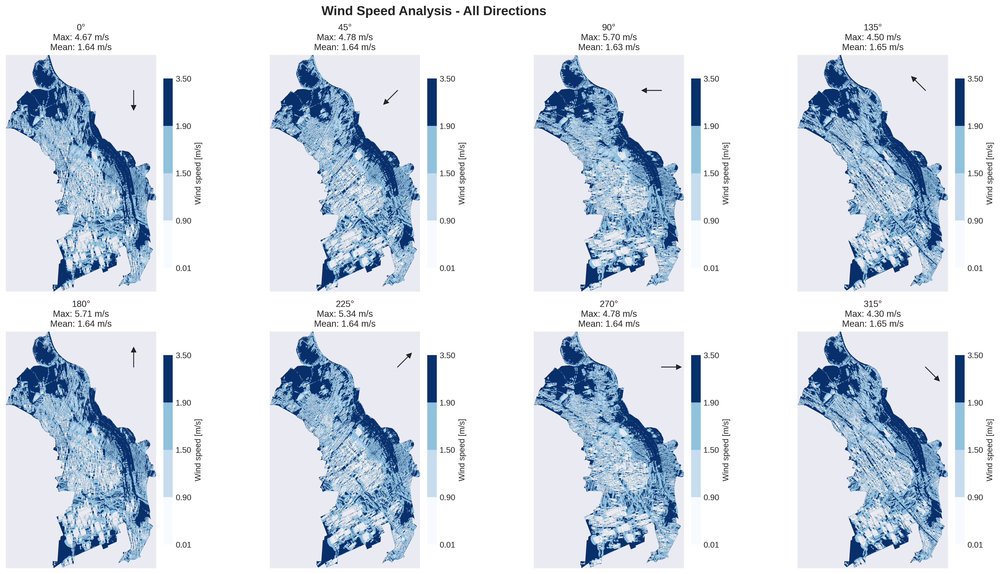

In [ ]:
# === Definition color ===
#bounds = [0.01, 0.97, 1.5, 1.9, 3.5]
# qgis_colors = [
#     (43/255, 131/255, 186/255, 1),   # niebieski
#     (167/255, 216/255, 168/255, 1),  # zielony
#     (241/255, 236/255, 171/255, 1),  # żółtawy
#     (250/255, 168/255, 99/255, 1),   # pomarańczowy
#     (215/255, 25/255, 28/255, 1),    # czerwony
# ] #Paleta kolorow

#gradient niebieski
qgis_colors = [
    (247/255, 251/255, 255/255, 1),  # (0.9686, 0.9843, 1.0) jasny niebieski
    (199/255, 220/255, 239/255, 1),  # (0.7804, 0.8627, 0.9373) jasny błękit
    (144/255, 194/255, 222/255, 1),  # (0.5647, 0.7608, 0.8706) średni niebieski
    (100/255, 169/255, 211/255, 1),  # (0.3922, 0.6627, 0.8275) ciemniejszy niebieski
    (8/255, 48/255, 107/255, 1),     # (0.0314, 0.1882, 0.4196) granatowy
]

bounds = [0.01, 0.9, 1.5, 1.9, 3.5]

cmap = ListedColormap(qgis_colors)
norm = BoundaryNorm(bounds, ncolors=len(qgis_colors))

# === Read raster ===
raster_data = {}
stats_summary = {}

print("Loading wind speed rasters...")

for dir_angle in directions:
    print(f"🔄 Loading direction: {dir_angle}°")
    speed_raster_path = f'wind_speed/raster_res_{pixel_size}x6_dir_{dir_angle}_wind_speed_filled_cut.tif'

    try:
        with rasterio.open(speed_raster_path) as src:
            wind_speed = src.read(1)
            transform = src.transform
            crs = src.crs

            if src.nodata is not None:
                wind_speed = np.where(wind_speed == src.nodata, np.nan, wind_speed)

            raster_data[dir_angle] = {
                'wind_speed': wind_speed,
                'transform': transform,
                'crs': crs,
                'bounds': src.bounds
            }

            print(f"   ✓ Loaded {wind_speed.shape} - Speed range: {np.nanmin(wind_speed):.2f} - {np.nanmax(wind_speed):.2f} m/s")

    except FileNotFoundError:
        print(f"   ❌ File not found: {speed_raster_path}")
        raster_data[dir_angle] = {
            'wind_speed': np.full((100, 100), np.nan),
            'transform': None,
            'crs': None,
            'bounds': None
        }
    except Exception as e:
        print(f"   ❌ Error loading {speed_raster_path}: {e}")
        raster_data[dir_angle] = {
            'wind_speed': np.full((100, 100), np.nan),
            'transform': None,
            'crs': None,
            'bounds': None
        }

# === PLOT ===
print("\nCreating wind speed raster subplots...")

fig, axes = plt.subplots(2, 4, figsize=(20, 10), dpi=300)
fig.suptitle(f'Wind Speed Analysis - All Directions',
             fontsize=16, fontweight='bold')

axes_flat = axes.flatten()

for i, dir_angle in enumerate(directions):
    ax = axes_flat[i]
    data = raster_data[dir_angle]
    wind_speed = data['wind_speed']

    valid_speeds = wind_speed[~np.isnan(wind_speed)]
    if len(valid_speeds) > 0:
        max_speed = np.max(valid_speeds)
        mean_speed = np.mean(valid_speeds)
        stats_summary[dir_angle] = {
            'min': np.min(valid_speeds),
            'max': max_speed,
            'mean': mean_speed,
            'std': np.std(valid_speeds),
            'valid_pixels': len(valid_speeds)
        }
    else:
        stats_summary[dir_angle] = {
            'min': np.nan,
            'max': np.nan,
            'mean': np.nan,
            'std': np.nan,
            'valid_pixels': 0
        }

    if not np.all(np.isnan(wind_speed)):
        im = ax.imshow(wind_speed, cmap=cmap, norm=norm, origin='upper',
                      interpolation='bilinear', aspect=None)

        cbar = plt.colorbar(im, ax=ax, shrink=0.8, pad=0.02, ticks=bounds)
        cbar.set_label('Wind speed [m/s]', fontsize=10)
    else:
        ax.imshow(np.zeros_like(wind_speed), cmap='gray', alpha=0.3)
        ax.text(0.5, 0.5, 'No Data', transform=ax.transAxes,
                ha='center', va='center', fontsize=12, color='red')

    # Title with values
    if not np.isnan(stats_summary[dir_angle]['max']):
        title = f"{dir_angle}°\nMax: {stats_summary[dir_angle]['max']:.2f} m/s\nMean: {stats_summary[dir_angle]['mean']:.2f} m/s"
    else:
        title = f"{dir_angle}°\nNo Data"

    ax.set_title(title, fontsize=11)
    ax.set_xticks([])
    ax.set_yticks([])

    # Arrow direction
    if not np.all(np.isnan(wind_speed)):
        h, w = wind_speed.shape
        arrow_x = w * 0.85
        arrow_y = h * 0.15
        angle_rad = np.radians(dir_angle)
        dx = -np.sin(angle_rad) * min(w, h) * 0.1
        dy = np.cos(angle_rad) * min(w, h) * 0.1

        ax.arrow(arrow_x, arrow_y, dx, dy, head_width=min(w, h)*0.03,
                 head_length=min(w, h)*0.03, fc='black', ec='black', alpha=0.8)

plt.tight_layout()

output_filename_base = f"wind_speed_subplots_wind_field"
plt.savefig(f"{output_filename_base}.png", dpi=300, bbox_inches='tight')
plt.tight_layout()
plt.show()

# Pakowanie plików

In [ ]:
!zip -r /content/output_res_4.zip /content/output_res_4
!zip -r /content/navier_output.zip /content/navier_output

updating: content/output_res_4/ (stored 0%)
updating: content/output_res_4/dir_90/ (stored 0%)
updating: content/output_res_4/dir_90/mask_threshold.tif (deflated 98%)
updating: content/output_res_4/dir_90/wind_corridors_centerlines.gpkg (deflated 82%)
updating: content/output_res_4/dir_90/skeleton_speed.tif (deflated 99%)
updating: content/output_res_4/dir_90/wind_corridors_polygons.gpkg (deflated 67%)
updating: content/output_res_4/dir_90/mask_minwidth.tif (deflated 98%)
updating: content/output_res_4/dir_90/skeleton_binary.tif (deflated 99%)
updating: content/output_res_4/dir_90/skeleton_direction.tif (deflated 99%)
updating: content/output_res_4/dir_90/wind_corridors_leastcost_lines.gpkg (deflated 89%)
updating: content/output_res_4/dir_90/mask_clean.tif (deflated 98%)
updating: content/output_res_4/dir_90/mask_filtered_by_length_90.tif (deflated 99%)
updating: content/output_res_4/dir_45/ (stored 0%)
updating: content/output_res_4/dir_45/mask_threshold.tif (deflated 97%)
updating: 